# Dynamics of Encoding Axes in two Domains
Jan.12th, 2024

Reproducing part of Yuelin Shi, Doris Tsao 2023 paper analysis for DeePSim, BigGAN analysis

## Set up

### Import lib functions.

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os 
import sys
import glob
import torch
import pickle as pkl
from os.path import join
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sys
from sklearn.metrics.pairwise import cosine_similarity
from scipy.stats import ttest_1samp
sys.path.append("/n/home12/binxuwang/Github/Neuro-ActMax-GAN-comparison")

### Load meta & neural data of all windows

In [3]:
tabdir = r"/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/BigGAN_Project/Stats_tables"
meta_df = pd.read_csv(join(tabdir, "meta_activation_stats_w_optimizer.csv"), index_col=0)

In [4]:
from neuro_data_analysis.neural_data_lib import load_neural_data, \
        load_img_resp_pairs_multiwindow, load_resp_multiwindow
from neuro_data_analysis.neural_data_utils import get_all_masks
stim_rootdir = "/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Datasets"

BFEStats_merge, BFEStats = load_neural_data()

### Path for image embeddings (GAN & Evol)

In [5]:
GANembed_root = "/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/GAN_img_embedding"
GANembed_dir = join(GANembed_root, "dinov2_vitb14")
Evol_embed_root = '/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/BigGAN_img_embedding'
Evol_embed_dir = join(Evol_embed_root, "dinov2_vitb14")

def load_compute_eigen(dataset_str):
    if dataset_str == "imagenet_valid":
        embed = pkl.load(open(join(GANembed_dir, dataset_str+"_embedding.pkl"), "rb"))
    else:
        _, embed = pkl.load(open(join(GANembed_dir, dataset_str+"_embedding.pkl"), "rb"))
    embed = embed.cuda()
    cov = torch.cov(embed.T, )
    data_mean = embed.mean(dim=0)
    data_eigvals, data_eigvecs = torch.linalg.eigh(cov)
    data_eigvals = torch.flip(data_eigvals, dims=[0])
    data_eigvecs = torch.flip(data_eigvecs, dims=[1])
    return (data_mean, data_eigvals, data_eigvecs)


# compute mahalanobis distance
def mahalanobis_sqdist(x, mean, eigvec, eigval, eigfloor=1e-5, device="cuda"):
    x = x.to(device) - mean[None, :].to(device)
    # rotate
    rot_x = x @ eigvec
    # scale
    return (rot_x ** 2 / torch.clamp(eigval[None, :].to(device), min=eigfloor)).sum(dim=1)


# plot functions to collect activation / distace according to gens. 
def compute_mean_var(x, gen_vec, var="std"):
    meanvec = []
    errvec = []
    for gen in range(gen_vec.min(), gen_vec.max()+1):
        meanvec.append(x[gen_vec==gen].mean())
        if var == "std":
            errvec.append(x[gen_vec==gen].std())
        elif var == "var":
            errvec.append(x[gen_vec==gen].var())
        elif var == "sem":
            errvec.append(x[gen_vec==gen].std() / np.sqrt((gen_vec==gen).sum()))
    return torch.tensor(meanvec), torch.tensor(errvec)


def plot_shaded_errorbar(x, y, color="b", label="", var="std", **kwargs):
    meanvec, errvec = compute_mean_var(y, x, var=var)
    plt.plot(np.unique(x), meanvec, color=color, label=label, **kwargs)
    plt.fill_between(np.unique(x), meanvec-errvec, meanvec+errvec, color=color, alpha=0.3)

### Compute Eigen / PC basis of image embedding in datasets

In [6]:
MH_eig_col = {}
for dataset_str in [
    "DeePSim_4std",
    "BigGAN_trunc07",
    "BigGAN_std_008",
    "imagenet_valid",
    'ecoset_val',
    'places365_val',
    'massmem_objects',
    'curvature_contour',
    "pink_noise",
]:
    MH_eig_col[dataset_str] = load_compute_eigen(dataset_str)

### Shape of Evolution trajectory in various feature PC space

Given a evolutionary trajectory, we projected the image embeddings onto the PC basis of different image sets. 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


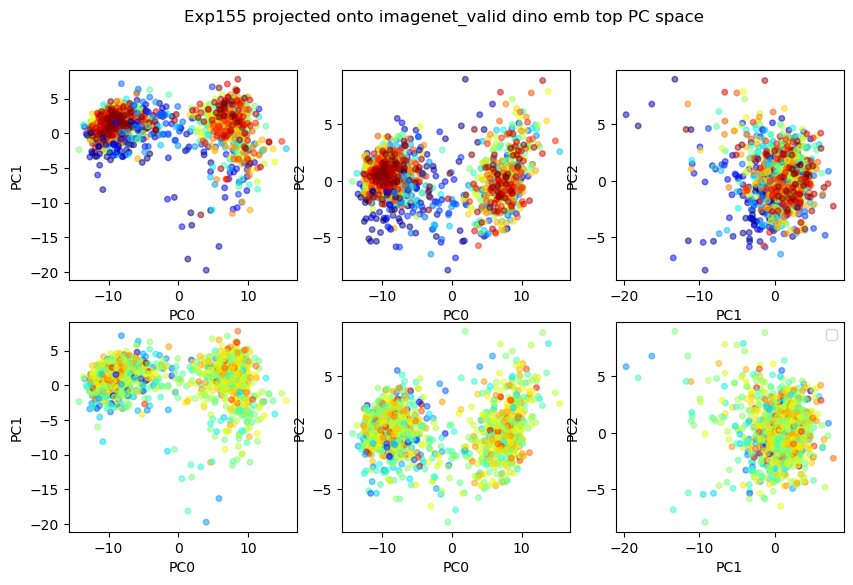

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


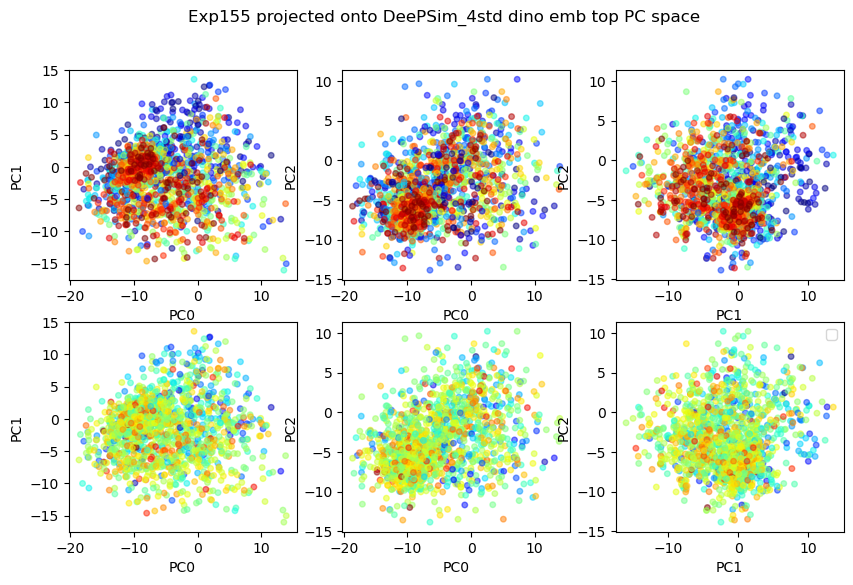

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


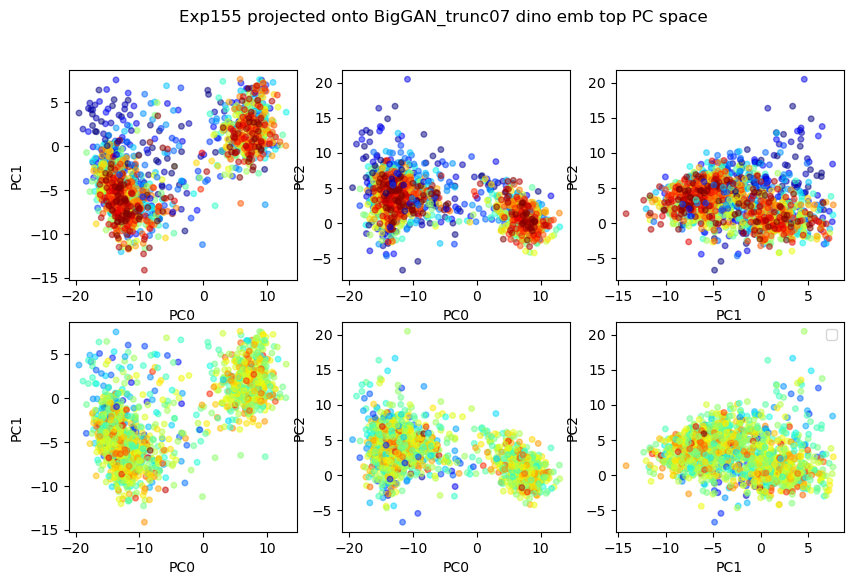

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


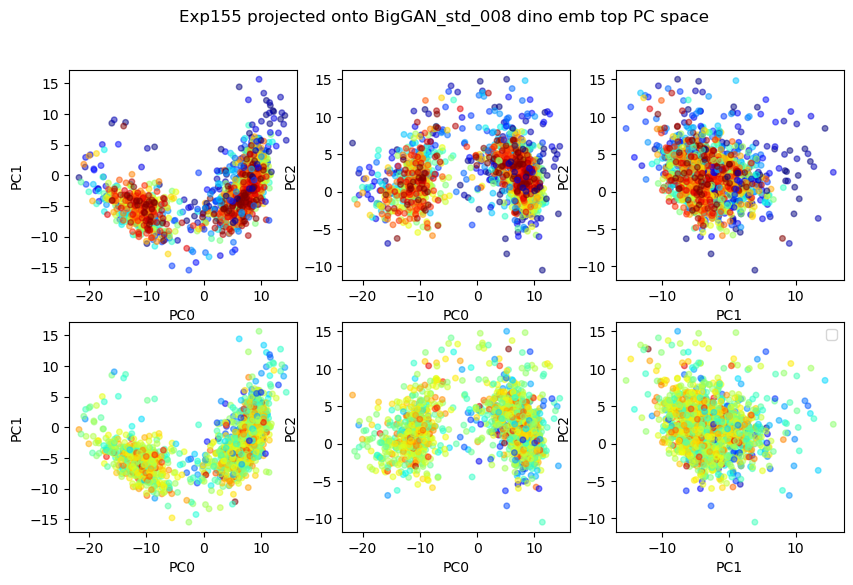

In [30]:
Expi = 155
Evol_emb_data = pkl.load(open(join(Evol_embed_dir, f"Exp{Expi:03d}_embed_act_data.pkl"), "rb"))
for dataset_str in ["imagenet_valid", "DeePSim_4std", "BigGAN_trunc07","BigGAN_std_008", ]: #MH_eig_col:
    data_mean, data_eigvals, data_eigvecs = MH_eig_col[dataset_str]
    # project the embeddings onto the eigenvectors
    embeddings_cmb = torch.cat([Evol_emb_data[f"embeddings{thread}"] for thread in [0, 1]], dim=0)
    gen_vec_cmb = np.concatenate([Evol_emb_data[f"gen_vec{thread}"] for thread in [0, 1]], axis=0)
    resp_mat_cmb = np.concatenate([Evol_emb_data[f"resp_mat{thread}"] for thread in [0, 1]], axis=0)
    PCproj = (embeddings_cmb.cuda() - data_mean[None,:]) @ data_eigvecs[:, :]
    figh, axs = plt.subplots(2, 3, figsize=[10, 6])
    for axi, (PCi, PCj) in enumerate([(0,1), (0,2), (1,2)]):
        axs[0, axi].scatter(PCproj[:, PCi].cpu(), PCproj[:, PCj].cpu(), 
                         s=16, c=gen_vec_cmb, cmap="jet", alpha=0.5, )
        axs[1, axi].scatter(PCproj[:, PCi].cpu(), PCproj[:, PCj].cpu(), 
                         s=16, c=resp_mat_cmb[:, 0], cmap="jet", alpha=0.5, )
        axs[0, axi].set_xlabel(f"PC{PCi}")
        axs[0, axi].set_ylabel(f"PC{PCj}")
        axs[1, axi].set_xlabel(f"PC{PCi}")
        axs[1, axi].set_ylabel(f"PC{PCj}")
    plt.legend()
    plt.suptitle(f"Exp{Expi:03d} projected onto {dataset_str} {'dino emb'} top PC space")
    plt.show()

## All Session Analysis

### Massive compute of regression axes on all experiments 

In [8]:
from sklearn.linear_model import LinearRegression, Ridge, RidgeCV
from sklearn.metrics import r2_score
from tqdm import trange, tqdm
import pickle as pkl

In [9]:
# rsp_wdws = [range(50, 200), range(0, 50), range(50, 100), range(100, 150), range(150, 200)]
rsp_wdw_fine = [range(50, 200), range(0, 50), range(50, 100), range(100, 150), range(150, 200)]
rsp_wdw_fine += [range(strt, strt+25) for strt in range(0, 200, 25)]

In [11]:
savedir = r"/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/BigGAN_Project/EvolLinReg_axes"
# PCcutoff = 50
PCcutoff_list = [2, 5, 10, 20, 50, 100, 200, 500, 768]
np.set_printoptions(precision=3, suppress=True)
for Expi in trange(1, 1 + 190):
    if Expi not in meta_df.index: 
        continue
    resp_mat0, gen_vec0 = load_resp_multiwindow(BFEStats, Expi,
                            "Evol", thread=0, rsp_wdws=rsp_wdw_fine)
    resp_mat1, gen_vec1 = load_resp_multiwindow(BFEStats, Expi,
                            "Evol", thread=1, rsp_wdws=rsp_wdw_fine)
    gen_vec_cmb = np.concatenate([gen_vec0, gen_vec1], axis=0)
    resp_mat_cmb = np.concatenate([resp_mat0, resp_mat1], axis=0)
    Evol_emb_data = pkl.load(open(join(Evol_embed_dir, f"Exp{Expi:03d}_embed_act_data.pkl"), "rb"))
    embeddings0 = Evol_emb_data[f"embeddings0"]
    embeddings1 = Evol_emb_data[f"embeddings1"]
    embeddings_cmb = torch.cat([embeddings0, embeddings1], dim=0)
    for dataset_str in [
            "imagenet_valid",
            'ecoset_val',
            'places365_val',
            'massmem_objects',
            "DeePSim_4std",
            "BigGAN_trunc07",
            "BigGAN_std_008",
            'curvature_contour',
            "pink_noise",
        ]:
        # # #MH_eig_col:
        data_mean, data_eigvals, data_eigvecs = MH_eig_col[dataset_str]
        PCproj0 = ((embeddings0.cuda() - data_mean[None,:]) @ data_eigvecs).cpu()
        PCproj1 = ((embeddings1.cuda() - data_mean[None,:]) @ data_eigvecs).cpu() 
        PCproj_cmb = ((embeddings_cmb.cuda() - data_mean[None,:]) @ data_eigvecs).cpu()
        
        model_stats_synopsis = {}
        cross_eval_synopsis = {}
        for PCcutoff in PCcutoff_list:
            print (f"PCA of {dataset_str}, PC cutoff: {PCcutoff}")
            model_stats_col = {}
            for X, y, label in [
                (PCproj0, resp_mat0, "thread 0"),
                (PCproj1, resp_mat1, "thread 1"),
                (PCproj_cmb, resp_mat_cmb, "combined"),
            ]:
                # Note: we used alpha per target such that regularization for each time bins are different. 
                model = RidgeCV(alphas=np.logspace(-4, 4, 15),
                                fit_intercept=True, alpha_per_target=True)
                model.fit(X[:, :PCcutoff], y)
                predresp = model.predict(X[:, :PCcutoff])
                R2_eachtime = r2_score(y, predresp, multioutput='raw_values')
                R2_varwt = r2_score(y, predresp, multioutput='variance_weighted')
                R2_avg = r2_score(y, predresp, multioutput='uniform_average')
                print(f"{PCcutoff} dim RidgeCV {label} R2 score:")
                print (f"R2_avg: {R2_avg:.3f}", end="\t") # this is the default score used by RidgeCV
                print (f"R2_varwt: {R2_varwt:.3f}", end="\n")
                print (f"R2_eachtime: {R2_eachtime}")
                model_stats_col[label] = (model, R2_eachtime, R2_varwt, R2_avg)
            
            model_stats_synopsis[PCcutoff] = model_stats_col
            
            # fit on one dataset and predict on the other dataset. 
            cross_eval_stats = {}
            # iterate over models
            for label, col in model_stats_col.items():
                model, _, _, _ = col
                # iterate over data
                for (X_, y_, label_) in [
                    (PCproj0, resp_mat0, "thread 0"),
                    (PCproj1, resp_mat1, "thread 1"),
                    (PCproj_cmb, resp_mat_cmb, "combined"),
                    ]:
                    xpredresp_ = model.predict(X_[:, :PCcutoff])
                    xR2_eachtime = r2_score(y_, xpredresp_, multioutput='raw_values')
                    xR2_varwt = r2_score(y_, xpredresp_, multioutput='variance_weighted')
                    xR2_avg = r2_score(y_, xpredresp_, multioutput='uniform_average')
                    cross_eval_stats[(label, label_)] = (xR2_eachtime, xR2_varwt, xR2_avg)
            cross_eval_synopsis[PCcutoff] = cross_eval_stats
            cross_eval_mat = np.array([[cross_eval_stats[a,b][1] 
                            for a in ["thread 0", "thread 1", "combined"]] 
                           for b in ["thread 0", "thread 1", "combined"]])
            print (cross_eval_mat)
        pkl.dump(model_stats_synopsis, open(join(savedir, f"Exp{Expi:03d}_{dataset_str}_PC_model_stats.pkl"), "wb"))
        pkl.dump(cross_eval_synopsis, open(join(savedir, f"Exp{Expi:03d}_{dataset_str}_PC_cross_eval_stats.pkl"), "wb"))
        # raise Exception("Stop here")

  0%|          | 0/190 [00:00<?, ?it/s]

PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.032	R2_varwt: 0.040
R2_eachtime: [0.082 0.007 0.056 0.069 0.008 0.002 0.01  0.003 0.073 0.065 0.026 0.009
 0.003]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.034	R2_varwt: 0.049
R2_eachtime: [0.074 0.    0.093 0.055 0.    0.    0.001 0.013 0.106 0.099 0.001 0.001
 0.   ]
2 dim RidgeCV combined R2 score:
R2_avg: 0.085	R2_varwt: 0.104
R2_eachtime: [0.212 0.001 0.11  0.128 0.129 0.001 0.002 0.007 0.147 0.154 0.026 0.07
 0.113]
[[ 0.04  -0.218  0.018]
 [-0.535  0.049  0.017]
 [-0.081 -0.015  0.104]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.043	R2_varwt: 0.054
R2_eachtime: [0.112 0.008 0.077 0.091 0.013 0.004 0.011 0.006 0.097 0.086 0.036 0.013
 0.005]
5 dim RidgeCV thread 1 R2 score:
R2_avg: 0.061	R2_varwt: 0.086
R2_eachtime: [0.151 0.002 0.176 0.077 0.013 0.001 0.003 0.03  0.196 0.115 0.01  0.015
 0.003]
5 dim RidgeCV combined R2 score:
R2_avg: 0.098	R2_varwt: 0.121
R2_eacht

  2%|▏         | 3/190 [00:12<12:54,  4.14s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.270	R2_varwt: 0.324
R2_eachtime: [0.5   0.088 0.488 0.331 0.284 0.083 0.089 0.151 0.533 0.343 0.164 0.202
 0.252]
[[ 0.264 -0.149  0.226]
 [-0.949  0.302  0.307]
 [-0.106  0.114  0.324]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.029	R2_varwt: 0.031
R2_eachtime: [0.08  0.    0.026 0.051 0.051 0.    0.001 0.012 0.021 0.023 0.047 0.041
 0.03 ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.036	R2_varwt: 0.043
R2_eachtime: [0.093 0.    0.104 0.031 0.03  0.001 0.003 0.027 0.104 0.03  0.011 0.022
 0.017]
2 dim RidgeCV combined R2 score:
R2_avg: 0.035	R2_varwt: 0.039
R2_eachtime: [0.085 0.    0.053 0.058 0.043 0.    0.001 0.033 0.047 0.041 0.034 0.028
 0.031]
[[ 0.031 -0.07   0.01 ]
 [-0.092  0.043  0.02 ]
 [-0.002  0.009  0.039]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.042	R2_varwt: 0.045
R2_eachtime: [0.107 0.002 0.048 0.067 0.067 0.002 0.001 0.018 0.047 0.033 0.058 0.052
 0.

  2%|▏         | 4/190 [00:20<17:03,  5.50s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.256	R2_varwt: 0.281
R2_eachtime: [0.416 0.119 0.397 0.305 0.284 0.116 0.119 0.235 0.395 0.258 0.224 0.238
 0.227]
[[ 0.277 -0.07   0.258]
 [-0.354  0.282  0.269]
 [ 0.002  0.12   0.281]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.003
R2_eachtime: [0.003 0.    0.008 0.    0.004 0.    0.    0.009 0.003 0.    0.    0.005
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.014	R2_varwt: 0.017
R2_eachtime: [0.036 0.001 0.008 0.028 0.023 0.001 0.    0.001 0.012 0.04  0.004 0.01
 0.018]
2 dim RidgeCV combined R2 score:
R2_avg: 0.033	R2_varwt: 0.037
R2_eachtime: [0.075 0.001 0.088 0.058 0.005 0.001 0.    0.055 0.055 0.033 0.045 0.015
 0.001]
[[ 0.003 -0.364 -0.001]
 [-0.243  0.017 -0.048]
 [-0.011 -0.196  0.037]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.022	R2_varwt: 0.023
R2_eachtime: [0.052 0.002 0.043 0.025 0.029 0.001 0.002 0.029 0.026 0.019 0.011 0.015
 0.0

  3%|▎         | 5/190 [00:30<20:55,  6.79s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.214	R2_varwt: 0.226
R2_eachtime: [0.489 0.087 0.294 0.296 0.219 0.083 0.089 0.197 0.232 0.222 0.222 0.182
 0.167]
[[ 0.237 -0.372  0.195]
 [-0.192  0.179  0.157]
 [ 0.164 -0.159  0.226]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.007	R2_varwt: 0.007
R2_eachtime: [0.018 0.002 0.001 0.021 0.006 0.001 0.003 0.    0.002 0.017 0.008 0.003
 0.006]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.049	R2_varwt: 0.051
R2_eachtime: [0.156 0.004 0.031 0.107 0.082 0.007 0.001 0.006 0.033 0.069 0.045 0.021
 0.078]
2 dim RidgeCV combined R2 score:
R2_avg: 0.181	R2_varwt: 0.227
R2_eachtime: [0.455 0.001 0.028 0.418 0.341 0.001 0.001 0.004 0.079 0.304 0.263 0.135
 0.33 ]
[[ 0.007 -0.113 -0.01 ]
 [-0.932  0.051  0.044]
 [-0.09   0.183  0.227]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.014	R2_varwt: 0.014
R2_eachtime: [0.038 0.009 0.008 0.037 0.01  0.008 0.005 0.002 0.01  0.028 0.015 0.003
 0.

  3%|▎         | 6/190 [00:40<24:25,  7.96s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.268	R2_varwt: 0.315
R2_eachtime: [0.553 0.084 0.133 0.523 0.41  0.075 0.078 0.082 0.18  0.426 0.343 0.209
 0.391]
[[ 0.098 -0.23   0.091]
 [-1.017  0.18   0.172]
 [-0.077  0.173  0.315]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.001
R2_eachtime: [0.001 0.003 0.    0.    0.004 0.002 0.001 0.003 0.    0.    0.    0.003
 0.002]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.009	R2_varwt: 0.008
R2_eachtime: [0.027 0.008 0.014 0.011 0.011 0.002 0.009 0.005 0.009 0.004 0.009 0.006
 0.006]
2 dim RidgeCV combined R2 score:
R2_avg: 0.009	R2_varwt: 0.009
R2_eachtime: [0.021 0.005 0.013 0.014 0.011 0.002 0.004 0.003 0.011 0.006 0.012 0.011
 0.004]
[[ 0.001 -0.167 -0.019]
 [-0.25   0.008 -0.079]
 [-0.024 -0.067  0.009]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.039	R2_varwt: 0.044
R2_eachtime: [0.094 0.007 0.041 0.073 0.052 0.007 0.005 0.007 0.043 0.048 0.057 0.03
 0.0

  4%|▎         | 7/190 [00:49<24:46,  8.12s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.224	R2_varwt: 0.239
R2_eachtime: [0.432 0.104 0.274 0.334 0.245 0.104 0.098 0.109 0.307 0.254 0.261 0.211
 0.176]
[[ 0.276 -0.227  0.229]
 [-0.264  0.172  0.141]
 [ 0.158 -0.062  0.239]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.003
R2_eachtime: [0.006 0.002 0.002 0.003 0.007 0.002 0.001 0.001 0.001 0.002 0.001 0.007
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.004	R2_varwt: 0.004
R2_eachtime: [0.002 0.001 0.001 0.009 0.001 0.004 0.001 0.001 0.003 0.004 0.019 0.002
 0.001]
2 dim RidgeCV combined R2 score:
R2_avg: 0.004	R2_varwt: 0.005
R2_eachtime: [0.007 0.001 0.002 0.014 0.    0.002 0.    0.001 0.002 0.014 0.01  0.
 0.   ]
[[ 0.003 -0.045 -0.007]
 [-0.05   0.004 -0.005]
 [-0.015 -0.008  0.005]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.008	R2_varwt: 0.007
R2_eachtime: [0.021 0.002 0.009 0.004 0.016 0.003 0.001 0.002 0.014 0.003 0.004 0.012
 0.006

  4%|▍         | 8/190 [00:58<25:36,  8.44s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.149	R2_varwt: 0.149
R2_eachtime: [0.202 0.119 0.152 0.183 0.156 0.115 0.123 0.125 0.159 0.176 0.16  0.131
 0.14 ]
[[ 0.136 -0.064  0.113]
 [-0.103  0.181  0.163]
 [ 0.02   0.076  0.149]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.    0.001 0.    0.001 0.    0.002 0.    0.    0.001 0.002 0.    0.
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.012	R2_varwt: 0.012
R2_eachtime: [0.033 0.006 0.    0.03  0.022 0.005 0.008 0.002 0.    0.009 0.026 0.011
 0.011]
2 dim RidgeCV combined R2 score:
R2_avg: 0.017	R2_varwt: 0.017
R2_eachtime: [0.035 0.001 0.004 0.026 0.052 0.    0.003 0.    0.007 0.011 0.019 0.02
 0.04 ]
[[ 0.001 -0.019 -0.001]
 [-0.079  0.012  0.01 ]
 [-0.017  0.007  0.017]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.001 0.001 0.001 0.001 0.001 0.005 0.001 0.001 0.002 0.001 0.    0.001
 0.001]

  5%|▍         | 9/190 [01:06<24:36,  8.16s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.116	R2_varwt: 0.116
R2_eachtime: [0.14  0.105 0.114 0.124 0.14  0.101 0.097 0.088 0.133 0.118 0.107 0.117
 0.124]
[[ 0.082 -0.034  0.073]
 [-0.074  0.162  0.15 ]
 [ 0.033  0.058  0.116]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.006	R2_varwt: 0.005
R2_eachtime: [0.014 0.005 0.007 0.009 0.006 0.001 0.006 0.003 0.009 0.004 0.007 0.002
 0.005]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.034	R2_varwt: 0.030
R2_eachtime: [0.082 0.035 0.038 0.045 0.039 0.013 0.035 0.023 0.026 0.025 0.027 0.013
 0.036]
2 dim RidgeCV combined R2 score:
R2_avg: 0.022	R2_varwt: 0.021
R2_eachtime: [0.034 0.013 0.025 0.029 0.041 0.005 0.014 0.018 0.014 0.012 0.025 0.021
 0.031]
[[ 0.005 -0.184 -0.006]
 [-0.182  0.03  -0.015]
 [-0.035 -0.069  0.021]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.021	R2_varwt: 0.019
R2_eachtime: [0.045 0.026 0.023 0.036 0.015 0.018 0.015 0.008 0.025 0.021 0.024 0.005
 0.

  5%|▌         | 10/190 [01:13<23:56,  7.98s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.193	R2_varwt: 0.184
R2_eachtime: [0.295 0.175 0.185 0.241 0.251 0.15  0.151 0.15  0.153 0.177 0.196 0.17
 0.211]
[[ 0.155 -0.08   0.119]
 [-0.213  0.238  0.224]
 [ 0.044  0.07   0.184]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.    0.001 0.    0.001 0.    0.    0.    0.    0.    0.    0.003 0.001
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.020	R2_varwt: 0.024
R2_eachtime: [0.045 0.001 0.001 0.067 0.022 0.001 0.001 0.003 0.001 0.053 0.038 0.019
 0.013]
2 dim RidgeCV combined R2 score:
R2_avg: 0.100	R2_varwt: 0.130
R2_eachtime: [0.155 0.    0.034 0.141 0.286 0.    0.    0.009 0.034 0.085 0.121 0.215
 0.225]
[[ 0.001 -0.255 -0.009]
 [-0.734  0.024  0.008]
 [-0.105  0.002  0.13 ]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.040	R2_varwt: 0.047
R2_eachtime: [0.104 0.001 0.061 0.086 0.028 0.001 0.    0.01  0.063 0.072 0.049 0.03
 0.01

  6%|▋         | 12/190 [01:23<19:21,  6.53s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.287	R2_varwt: 0.334
R2_eachtime: [0.54  0.079 0.261 0.425 0.433 0.08  0.076 0.123 0.267 0.431 0.306 0.359
 0.346]
[[ 0.233 -0.397  0.221]
 [-1.29   0.274  0.248]
 [-0.159  0.006  0.334]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.032	R2_varwt: 0.037
R2_eachtime: [0.075 0.002 0.019 0.076 0.045 0.002 0.001 0.014 0.015 0.05  0.055 0.041
 0.023]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.005	R2_varwt: 0.006
R2_eachtime: [0.001 0.001 0.015 0.002 0.004 0.    0.002 0.006 0.01  0.015 0.001 0.006
 0.001]
2 dim RidgeCV combined R2 score:
R2_avg: 0.008	R2_varwt: 0.009
R2_eachtime: [0.012 0.001 0.011 0.013 0.011 0.001 0.001 0.007 0.009 0.013 0.008 0.013
 0.005]
[[ 0.037 -0.029  0.013]
 [-0.22   0.006 -0.001]
 [-0.095 -0.007  0.009]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.049	R2_varwt: 0.056
R2_eachtime: [0.107 0.009 0.066 0.094 0.053 0.012 0.006 0.019 0.066 0.073 0.06  0.051
 0.

  7%|▋         | 13/190 [01:31<20:19,  6.89s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.241	R2_varwt: 0.261
R2_eachtime: [0.465 0.107 0.258 0.413 0.28  0.111 0.099 0.133 0.272 0.271 0.243 0.264
 0.216]
[[ 0.263 -0.337  0.252]
 [-0.201  0.305  0.264]
 [ 0.023  0.004  0.261]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.001 0.    0.    0.    0.006 0.001 0.001 0.    0.001 0.    0.    0.004
 0.007]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.002 0.004 0.006 0.002 0.001 0.001 0.004 0.001 0.003 0.003 0.001 0.001
 0.001]
2 dim RidgeCV combined R2 score:
R2_avg: 0.023	R2_varwt: 0.025
R2_eachtime: [0.046 0.    0.005 0.057 0.05  0.001 0.    0.002 0.002 0.027 0.047 0.037
 0.027]
[[ 0.002 -0.269 -0.021]
 [-0.198  0.002 -0.035]
 [-0.032 -0.09   0.025]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.004	R2_varwt: 0.003
R2_eachtime: [0.001 0.007 0.001 0.001 0.008 0.007 0.006 0.001 0.001 0.002 0.    0.006
 0.

  7%|▋         | 14/190 [01:40<21:57,  7.49s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.153	R2_varwt: 0.155
R2_eachtime: [0.273 0.087 0.112 0.256 0.207 0.085 0.081 0.086 0.103 0.174 0.213 0.16
 0.155]
[[ 0.104 -0.219  0.095]
 [-0.252  0.139  0.128]
 [-0.002 -0.005  0.155]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.021	R2_varwt: 0.021
R2_eachtime: [0.038 0.021 0.024 0.027 0.028 0.015 0.015 0.013 0.019 0.018 0.022 0.02
 0.02 ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.002 0.003 0.    0.003 0.003 0.001 0.007 0.001 0.    0.004 0.001 0.001
 0.003]
2 dim RidgeCV combined R2 score:
R2_avg: 0.007	R2_varwt: 0.007
R2_eachtime: [0.005 0.004 0.002 0.01  0.018 0.001 0.004 0.001 0.002 0.007 0.007 0.01
 0.016]
[[ 0.021 -0.038  0.001]
 [-0.302  0.002 -0.011]
 [-0.09  -0.013  0.007]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.056	R2_varwt: 0.054
R2_eachtime: [0.097 0.064 0.064 0.064 0.071 0.056 0.035 0.047 0.04  0.046 0.05  0.054
 0.047

  8%|▊         | 15/190 [01:49<23:07,  7.93s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.408	R2_varwt: 0.393
R2_eachtime: [0.656 0.441 0.456 0.448 0.43  0.346 0.36  0.355 0.372 0.362 0.369 0.375
 0.337]
[[ 0.427 -0.133  0.392]
 [-0.138  0.41   0.379]
 [ 0.222  0.081  0.393]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.001
R2_eachtime: [0.003 0.    0.005 0.    0.003 0.001 0.    0.002 0.001 0.    0.    0.005
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.007	R2_varwt: 0.007
R2_eachtime: [0.008 0.011 0.012 0.009 0.005 0.005 0.006 0.011 0.005 0.014 0.002 0.006
 0.001]
2 dim RidgeCV combined R2 score:
R2_avg: 0.018	R2_varwt: 0.019
R2_eachtime: [0.018 0.001 0.022 0.021 0.051 0.002 0.    0.019 0.008 0.024 0.005 0.025
 0.037]
[[ 0.001 -0.054 -0.001]
 [-0.099  0.007  0.002]
 [-0.017 -0.012  0.019]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.007	R2_varwt: 0.007
R2_eachtime: [0.017 0.002 0.015 0.01  0.002 0.002 0.001 0.004 0.01  0.015 0.001 0.005
 0.

  8%|▊         | 16/190 [01:58<23:56,  8.26s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.137	R2_varwt: 0.140
R2_eachtime: [0.19  0.092 0.174 0.162 0.158 0.088 0.092 0.107 0.183 0.158 0.12  0.123
 0.136]
[[ 0.143 -0.078  0.111]
 [-0.229  0.158  0.144]
 [ 0.022  0.029  0.14 ]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.009	R2_varwt: 0.008
R2_eachtime: [0.024 0.007 0.016 0.017 0.001 0.004 0.003 0.005 0.014 0.007 0.013 0.
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.007	R2_varwt: 0.008
R2_eachtime: [0.017 0.003 0.    0.023 0.005 0.001 0.003 0.003 0.003 0.031 0.003 0.001
 0.004]
2 dim RidgeCV combined R2 score:
R2_avg: 0.073	R2_varwt: 0.077
R2_eachtime: [0.197 0.005 0.013 0.152 0.152 0.006 0.001 0.003 0.033 0.163 0.037 0.076
 0.107]
[[ 0.008 -0.185 -0.001]
 [-0.457  0.008 -0.005]
 [-0.109 -0.01   0.077]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.024	R2_varwt: 0.021
R2_eachtime: [0.057 0.04  0.035 0.035 0.006 0.018 0.033 0.008 0.032 0.017 0.026 0.002
 0.002

  9%|▉         | 17/190 [02:07<24:07,  8.37s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.190	R2_varwt: 0.190
R2_eachtime: [0.347 0.132 0.199 0.256 0.242 0.112 0.112 0.126 0.197 0.26  0.132 0.159
 0.197]
[[ 0.117 -0.141  0.099]
 [-0.597  0.155  0.146]
 [-0.114  0.074  0.19 ]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.015	R2_varwt: 0.016
R2_eachtime: [0.044 0.    0.032 0.026 0.011 0.001 0.002 0.011 0.018 0.012 0.023 0.009
 0.004]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.036	R2_varwt: 0.042
R2_eachtime: [0.094 0.001 0.045 0.064 0.048 0.001 0.002 0.003 0.057 0.049 0.037 0.033
 0.034]
2 dim RidgeCV combined R2 score:
R2_avg: 0.073	R2_varwt: 0.088
R2_eachtime: [0.089 0.001 0.07  0.147 0.148 0.001 0.001 0.036 0.041 0.161 0.05  0.069
 0.139]
[[ 0.016 -0.322  0.009]
 [-0.192  0.042  0.019]
 [ 0.006 -0.074  0.088]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.019	R2_varwt: 0.021
R2_eachtime: [0.052 0.001 0.045 0.033 0.01  0.001 0.002 0.017 0.027 0.017 0.027 0.008
 0.

  9%|▉         | 18/190 [02:15<24:09,  8.43s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.235	R2_varwt: 0.259
R2_eachtime: [0.395 0.094 0.304 0.362 0.296 0.097 0.081 0.137 0.272 0.323 0.236 0.201
 0.259]
[[ 0.163 -0.305  0.133]
 [-0.386  0.291  0.28 ]
 [ 0.003  0.036  0.259]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.005 0.    0.001 0.    0.005 0.001 0.001 0.003 0.001 0.    0.001 0.007
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.060	R2_varwt: 0.063
R2_eachtime: [0.171 0.003 0.027 0.128 0.1   0.003 0.002 0.002 0.061 0.053 0.103 0.056
 0.076]
2 dim RidgeCV combined R2 score:
R2_avg: 0.187	R2_varwt: 0.215
R2_eachtime: [0.421 0.001 0.009 0.426 0.376 0.    0.001 0.006 0.033 0.268 0.344 0.252
 0.294]
[[ 0.002 -0.31  -0.028]
 [-0.83   0.063  0.042]
 [-0.096  0.106  0.215]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.004	R2_varwt: 0.004
R2_eachtime: [0.006 0.    0.006 0.001 0.002 0.001 0.001 0.002 0.007 0.    0.013 0.007
 0.

 10%|█         | 19/190 [02:22<22:45,  7.99s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.287	R2_varwt: 0.317
R2_eachtime: [0.529 0.09  0.107 0.528 0.485 0.084 0.092 0.1   0.146 0.366 0.45  0.364
 0.389]
[[ 0.085 -0.252  0.075]
 [-0.893  0.207  0.2  ]
 [-0.085  0.184  0.317]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.002 0.001 0.004 0.    0.001 0.001 0.    0.006 0.    0.001 0.003 0.
 0.003]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.077	R2_varwt: 0.081
R2_eachtime: [0.238 0.002 0.117 0.159 0.06  0.001 0.003 0.043 0.124 0.107 0.074 0.042
 0.034]
2 dim RidgeCV combined R2 score:
R2_avg: 0.174	R2_varwt: 0.199
R2_eachtime: [0.415 0.002 0.029 0.435 0.288 0.001 0.002 0.003 0.063 0.335 0.277 0.183
 0.232]
[[ 0.002 -0.35  -0.015]
 [-0.91   0.081  0.055]
 [-0.148  0.058  0.199]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.004	R2_varwt: 0.004
R2_eachtime: [0.005 0.006 0.002 0.009 0.001 0.006 0.001 0.002 0.001 0.002 0.013 0.001
 0.002

 11%|█         | 20/190 [02:29<21:44,  7.67s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.296	R2_varwt: 0.324
R2_eachtime: [0.544 0.096 0.217 0.552 0.385 0.102 0.099 0.127 0.257 0.46  0.385 0.287
 0.332]
[[ 0.107 -0.407  0.099]
 [-0.757  0.287  0.257]
 [-0.045  0.108  0.324]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.005	R2_varwt: 0.004
R2_eachtime: [0.013 0.    0.011 0.007 0.004 0.    0.001 0.003 0.01  0.003 0.004 0.002
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.003	R2_varwt: 0.003
R2_eachtime: [0.006 0.005 0.002 0.004 0.003 0.005 0.004 0.001 0.005 0.001 0.004 0.003
 0.002]
2 dim RidgeCV combined R2 score:
R2_avg: 0.004	R2_varwt: 0.004
R2_eachtime: [0.003 0.001 0.016 0.001 0.001 0.001 0.001 0.007 0.011 0.001 0.003 0.
 0.002]
[[ 0.004 -0.025  0.   ]
 [-0.037  0.003 -0.004]
 [-0.006 -0.01   0.004]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.004	R2_varwt: 0.004
R2_eachtime: [0.012 0.002 0.01  0.009 0.002 0.    0.003 0.002 0.009 0.003 0.003 0.001
 0.001

 11%|█         | 21/190 [02:38<22:14,  7.90s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.117	R2_varwt: 0.116
R2_eachtime: [0.162 0.096 0.151 0.126 0.114 0.089 0.097 0.107 0.144 0.128 0.102 0.11
 0.098]
[[ 0.108 -0.048  0.095]
 [-0.046  0.156  0.139]
 [ 0.055  0.033  0.116]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.006	R2_varwt: 0.006
R2_eachtime: [0.016 0.001 0.006 0.006 0.011 0.002 0.001 0.005 0.004 0.003 0.003 0.013
 0.004]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.017	R2_varwt: 0.018
R2_eachtime: [0.045 0.    0.004 0.035 0.024 0.    0.001 0.025 0.006 0.037 0.01  0.005
 0.024]
2 dim RidgeCV combined R2 score:
R2_avg: 0.092	R2_varwt: 0.111
R2_eachtime: [0.24  0.    0.028 0.189 0.188 0.001 0.    0.    0.051 0.181 0.067 0.083
 0.17 ]
[[ 0.006 -0.592 -0.019]
 [-0.542  0.018 -0.077]
 [-0.049 -0.129  0.111]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.021	R2_varwt: 0.023
R2_eachtime: [0.058 0.002 0.009 0.042 0.04  0.002 0.002 0.004 0.007 0.032 0.025 0.032
 0.0

 12%|█▏        | 22/190 [02:47<23:20,  8.34s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.239	R2_varwt: 0.269
R2_eachtime: [0.445 0.101 0.161 0.383 0.354 0.09  0.112 0.102 0.241 0.382 0.202 0.211
 0.325]
[[ 0.143 -0.344  0.125]
 [-0.95   0.176  0.162]
 [-0.134  0.049  0.269]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.019	R2_varwt: 0.017
R2_eachtime: [0.051 0.011 0.034 0.022 0.019 0.009 0.004 0.007 0.037 0.015 0.011 0.019
 0.006]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.010	R2_varwt: 0.009
R2_eachtime: [0.007 0.026 0.004 0.008 0.01  0.013 0.018 0.    0.006 0.018 0.001 0.001
 0.016]
2 dim RidgeCV combined R2 score:
R2_avg: 0.021	R2_varwt: 0.022
R2_eachtime: [0.045 0.005 0.    0.051 0.036 0.002 0.004 0.001 0.002 0.074 0.004 0.013
 0.032]
[[ 0.017 -0.096 -0.009]
 [-2.202  0.009 -0.003]
 [-0.776 -0.026  0.022]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.025	R2_varwt: 0.022
R2_eachtime: [0.068 0.016 0.041 0.031 0.028 0.009 0.009 0.008 0.042 0.021 0.014 0.024
 0.

 12%|█▏        | 23/190 [02:57<24:31,  8.81s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.149	R2_varwt: 0.147
R2_eachtime: [0.251 0.111 0.152 0.201 0.173 0.098 0.097 0.107 0.14  0.208 0.123 0.128
 0.153]
[[ 0.111 -0.052  0.102]
 [-0.243  0.168  0.154]
 [ 0.005  0.059  0.147]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.027	R2_varwt: 0.035
R2_eachtime: [0.063 0.    0.041 0.05  0.028 0.001 0.    0.    0.053 0.047 0.025 0.018
 0.025]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.007	R2_varwt: 0.008
R2_eachtime: [0.01  0.001 0.007 0.016 0.002 0.005 0.    0.    0.013 0.029 0.006 0.001
 0.001]
2 dim RidgeCV combined R2 score:
R2_avg: 0.033	R2_varwt: 0.046
R2_eachtime: [0.075 0.001 0.069 0.065 0.015 0.003 0.    0.    0.086 0.073 0.025 0.013
 0.008]
[[ 0.035 -0.367 -0.005]
 [-0.493  0.008 -0.203]
 [-0.    -0.136  0.046]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.054	R2_varwt: 0.070
R2_eachtime: [0.127 0.002 0.085 0.099 0.055 0.002 0.002 0.002 0.101 0.095 0.049 0.047
 0.

 13%|█▎        | 24/190 [03:05<23:47,  8.60s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.285	R2_varwt: 0.346
R2_eachtime: [0.564 0.088 0.467 0.514 0.221 0.087 0.089 0.102 0.52  0.398 0.288 0.204
 0.163]
[[ 0.347 -0.584  0.303]
 [-0.3    0.198  0.196]
 [ 0.25  -0.23   0.346]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.002
R2_eachtime: [0.003 0.005 0.    0.003 0.002 0.002 0.002 0.001 0.007 0.001 0.001 0.
 0.005]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.011	R2_varwt: 0.014
R2_eachtime: [0.035 0.    0.022 0.019 0.005 0.    0.    0.008 0.02  0.023 0.002 0.008
 0.003]
2 dim RidgeCV combined R2 score:
R2_avg: 0.011	R2_varwt: 0.020
R2_eachtime: [0.03  0.    0.047 0.005 0.    0.    0.    0.037 0.021 0.008 0.    0.001
 0.   ]
[[ 0.002 -0.225 -0.015]
 [-0.228  0.014 -0.06 ]
 [-0.024 -0.088  0.02 ]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.007	R2_varwt: 0.009
R2_eachtime: [0.015 0.002 0.011 0.007 0.005 0.001 0.001 0.01  0.013 0.009 0.001 0.001
 0.014

 13%|█▎        | 25/190 [03:13<23:21,  8.49s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.133	R2_varwt: 0.159
R2_eachtime: [0.22  0.086 0.239 0.13  0.1   0.091 0.083 0.208 0.159 0.132 0.1   0.089
 0.093]
[[ 0.103 -0.393  0.095]
 [-0.11   0.174  0.157]
 [ 0.077 -0.141  0.159]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.007	R2_varwt: 0.008
R2_eachtime: [0.015 0.005 0.02  0.009 0.    0.004 0.004 0.012 0.013 0.008 0.003 0.001
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.018	R2_varwt: 0.019
R2_eachtime: [0.048 0.002 0.031 0.034 0.01  0.002 0.001 0.013 0.032 0.019 0.027 0.016
 0.001]
2 dim RidgeCV combined R2 score:
R2_avg: 0.020	R2_varwt: 0.023
R2_eachtime: [0.051 0.005 0.055 0.027 0.001 0.004 0.003 0.039 0.037 0.02  0.016 0.006
 0.   ]
[[ 0.008 -0.083 -0.002]
 [-0.057  0.019 -0.007]
 [ 0.008 -0.013  0.023]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.014	R2_varwt: 0.016
R2_eachtime: [0.034 0.003 0.044 0.016 0.001 0.003 0.002 0.019 0.044 0.015 0.005 0.002
 0.

 14%|█▎        | 26/190 [03:21<22:36,  8.27s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.147	R2_varwt: 0.157
R2_eachtime: [0.238 0.097 0.257 0.16  0.1   0.095 0.092 0.203 0.206 0.141 0.127 0.102
 0.098]
[[ 0.146 -0.482  0.111]
 [-0.02   0.185  0.166]
 [ 0.102 -0.175  0.157]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.010	R2_varwt: 0.011
R2_eachtime: [0.03  0.    0.026 0.013 0.005 0.001 0.    0.009 0.025 0.01  0.007 0.002
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.011	R2_varwt: 0.012
R2_eachtime: [0.023 0.    0.029 0.011 0.005 0.001 0.001 0.029 0.008 0.011 0.006 0.012
 0.   ]
2 dim RidgeCV combined R2 score:
R2_avg: 0.017	R2_varwt: 0.022
R2_eachtime: [0.042 0.001 0.054 0.022 0.001 0.001 0.001 0.05  0.022 0.018 0.011 0.
 0.001]
[[ 0.011 -0.098 -0.001]
 [-0.079  0.012 -0.022]
 [ 0.008 -0.024  0.022]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.015	R2_varwt: 0.016
R2_eachtime: [0.041 0.002 0.032 0.022 0.006 0.001 0.002 0.01  0.045 0.015 0.015 0.002
 0.001

 14%|█▍        | 27/190 [03:28<21:11,  7.80s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.194	R2_varwt: 0.201
R2_eachtime: [0.428 0.11  0.311 0.213 0.139 0.114 0.107 0.247 0.239 0.201 0.158 0.136
 0.114]
[[ 0.218 -0.236  0.161]
 [-0.048  0.237  0.201]
 [ 0.144 -0.024  0.201]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.023	R2_varwt: 0.024
R2_eachtime: [0.055 0.001 0.027 0.043 0.03  0.    0.001 0.008 0.029 0.028 0.037 0.019
 0.022]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.036	R2_varwt: 0.034
R2_eachtime: [0.098 0.001 0.025 0.061 0.082 0.002 0.001 0.013 0.016 0.037 0.037 0.049
 0.053]
2 dim RidgeCV combined R2 score:
R2_avg: 0.012	R2_varwt: 0.013
R2_eachtime: [0.016 0.001 0.003 0.018 0.036 0.001 0.    0.    0.006 0.014 0.012 0.014
 0.036]
[[ 0.024 -0.112  0.006]
 [-0.21   0.034  0.004]
 [-0.05  -0.054  0.013]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.034	R2_varwt: 0.035
R2_eachtime: [0.078 0.002 0.037 0.051 0.057 0.001 0.002 0.015 0.035 0.029 0.048 0.044
 0.

 15%|█▍        | 28/190 [03:36<21:05,  7.81s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.222	R2_varwt: 0.222
R2_eachtime: [0.474 0.096 0.213 0.317 0.297 0.105 0.092 0.146 0.204 0.246 0.246 0.225
 0.231]
[[ 0.271 -0.145  0.242]
 [-0.099  0.183  0.169]
 [ 0.148 -0.023  0.222]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.    0.002 0.001 0.001 0.001 0.002 0.001 0.001 0.001 0.    0.001 0.001
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.003	R2_varwt: 0.003
R2_eachtime: [0.    0.006 0.005 0.001 0.004 0.004 0.005 0.003 0.002 0.003 0.001 0.003
 0.002]
2 dim RidgeCV combined R2 score:
R2_avg: 0.003	R2_varwt: 0.003
R2_eachtime: [0.001 0.003 0.005 0.004 0.002 0.002 0.002 0.002 0.004 0.001 0.003 0.001
 0.004]
[[ 0.001 -0.008  0.   ]
 [-0.008  0.003  0.   ]
 [ 0.    -0.002  0.003]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.001 0.006 0.001 0.002 0.002 0.006 0.002 0.002 0.001 0.001 0.002 0.002
 0.

 15%|█▌        | 29/190 [03:44<21:23,  7.97s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.103	R2_varwt: 0.104
R2_eachtime: [0.111 0.1   0.088 0.123 0.112 0.101 0.095 0.084 0.09  0.101 0.119 0.112
 0.104]
[[ 0.087 -0.032  0.077]
 [-0.018  0.158  0.143]
 [ 0.05   0.041  0.104]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.002
R2_eachtime: [0.007 0.002 0.    0.009 0.001 0.002 0.001 0.    0.    0.006 0.003 0.
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.002 0.004 0.    0.003 0.001 0.001 0.003 0.    0.    0.012 0.    0.002
 0.   ]
2 dim RidgeCV combined R2 score:
R2_avg: 0.002	R2_varwt: 0.001
R2_eachtime: [0.004 0.    0.    0.004 0.002 0.    0.    0.    0.    0.004 0.001 0.001
 0.002]
[[ 0.002 -0.034 -0.003]
 [-0.031  0.002 -0.01 ]
 [-0.004 -0.012  0.001]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.009	R2_varwt: 0.009
R2_eachtime: [0.024 0.003 0.    0.021 0.019 0.002 0.002 0.002 0.001 0.013 0.011 0.01
 0.012]

 16%|█▌        | 30/190 [03:54<23:15,  8.72s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.115	R2_varwt: 0.112
R2_eachtime: [0.173 0.097 0.097 0.142 0.133 0.092 0.09  0.094 0.101 0.146 0.098 0.116
 0.116]
[[ 0.092 -0.047  0.08 ]
 [-0.064  0.164  0.145]
 [ 0.036  0.045  0.112]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.008	R2_varwt: 0.011
R2_eachtime: [0.019 0.    0.013 0.014 0.006 0.    0.    0.001 0.015 0.013 0.007 0.006
 0.004]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.001	R2_varwt: 0.002
R2_eachtime: [0.002 0.    0.003 0.    0.001 0.001 0.001 0.001 0.002 0.002 0.002 0.001
 0.   ]
2 dim RidgeCV combined R2 score:
R2_avg: 0.060	R2_varwt: 0.096
R2_eachtime: [0.155 0.    0.131 0.108 0.032 0.    0.    0.026 0.127 0.109 0.049 0.03
 0.016]
[[ 0.011 -0.502 -0.017]
 [-1.476  0.002 -0.438]
 [ 0.019 -0.228  0.096]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.017	R2_varwt: 0.027
R2_eachtime: [0.042 0.001 0.027 0.037 0.01  0.001 0.001 0.001 0.031 0.038 0.018 0.009
 0.0

 16%|█▋        | 31/190 [04:06<25:07,  9.48s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.228	R2_varwt: 0.323
R2_eachtime: [0.515 0.072 0.351 0.402 0.142 0.067 0.071 0.124 0.36  0.39  0.231 0.143
 0.096]
[[ 0.253 -0.49   0.219]
 [-0.534  0.146  0.082]
 [ 0.291 -0.205  0.323]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.018	R2_varwt: 0.019
R2_eachtime: [0.042 0.    0.026 0.026 0.027 0.    0.    0.012 0.022 0.02  0.017 0.028
 0.013]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.    0.003 0.004 0.001 0.    0.001 0.004 0.006 0.003 0.001 0.    0.001
 0.002]
2 dim RidgeCV combined R2 score:
R2_avg: 0.020	R2_varwt: 0.024
R2_eachtime: [0.02  0.001 0.079 0.008 0.011 0.001 0.002 0.052 0.058 0.007 0.004 0.004
 0.016]
[[ 0.019 -0.26  -0.005]
 [-0.255  0.002 -0.075]
 [-0.026 -0.096  0.024]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.046	R2_varwt: 0.050
R2_eachtime: [0.102 0.001 0.091 0.061 0.05  0.001 0.001 0.072 0.056 0.06  0.03  0.042
 0.

 17%|█▋        | 32/190 [04:14<23:54,  9.08s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.315	R2_varwt: 0.348
R2_eachtime: [0.556 0.101 0.556 0.461 0.27  0.092 0.106 0.322 0.504 0.412 0.266 0.225
 0.23 ]
[[ 0.326 -0.802  0.285]
 [-0.244  0.385  0.352]
 [ 0.156 -0.274  0.348]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.002
R2_eachtime: [0.005 0.001 0.    0.    0.012 0.    0.    0.001 0.    0.001 0.    0.005
 0.008]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.002	R2_varwt: 0.001
R2_eachtime: [0.002 0.001 0.007 0.    0.001 0.    0.001 0.003 0.004 0.    0.    0.001
 0.   ]
2 dim RidgeCV combined R2 score:
R2_avg: 0.012	R2_varwt: 0.012
R2_eachtime: [0.027 0.001 0.001 0.024 0.032 0.    0.002 0.003 0.001 0.014 0.014 0.016
 0.023]
[[ 0.002 -0.202 -0.016]
 [-0.15   0.001 -0.058]
 [-0.013 -0.07   0.012]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.004	R2_varwt: 0.003
R2_eachtime: [0.011 0.002 0.001 0.001 0.015 0.001 0.001 0.001 0.001 0.002 0.001 0.002
 0.

 17%|█▋        | 33/190 [04:21<22:27,  8.58s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.151	R2_varwt: 0.150
R2_eachtime: [0.234 0.1   0.103 0.209 0.22  0.107 0.101 0.1   0.117 0.19  0.142 0.156
 0.188]
[[ 0.092 -0.207  0.082]
 [-0.188  0.169  0.153]
 [ 0.023 -0.009  0.15 ]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.003
R2_eachtime: [0.002 0.014 0.001 0.001 0.    0.005 0.012 0.    0.002 0.005 0.001 0.001
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.006	R2_varwt: 0.005
R2_eachtime: [0.011 0.001 0.    0.005 0.014 0.002 0.    0.001 0.001 0.004 0.006 0.017
 0.009]
2 dim RidgeCV combined R2 score:
R2_avg: 0.003	R2_varwt: 0.003
R2_eachtime: [0.001 0.003 0.008 0.    0.004 0.003 0.001 0.007 0.006 0.001 0.002 0.001
 0.006]
[[ 0.003 -0.033 -0.002]
 [-0.054  0.005 -0.006]
 [-0.012 -0.011  0.003]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.005	R2_varwt: 0.005
R2_eachtime: [0.01  0.013 0.002 0.003 0.002 0.004 0.011 0.002 0.003 0.009 0.001 0.008
 0.

 18%|█▊        | 34/190 [04:28<20:38,  7.94s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.119	R2_varwt: 0.118
R2_eachtime: [0.132 0.113 0.133 0.127 0.11  0.101 0.112 0.14  0.114 0.127 0.111 0.119
 0.103]
[[ 0.118 -0.073  0.106]
 [-0.045  0.143  0.122]
 [ 0.061  0.018  0.118]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.003
R2_eachtime: [0.005 0.001 0.004 0.003 0.    0.    0.005 0.    0.005 0.001 0.002 0.001
 0.005]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.021	R2_varwt: 0.026
R2_eachtime: [0.044 0.01  0.007 0.064 0.014 0.006 0.007 0.002 0.019 0.06  0.019 0.016
 0.004]
2 dim RidgeCV combined R2 score:
R2_avg: 0.044	R2_varwt: 0.062
R2_eachtime: [0.032 0.004 0.179 0.005 0.034 0.002 0.003 0.135 0.129 0.007 0.001 0.025
 0.019]
[[ 0.003 -0.68  -0.001]
 [-0.308  0.026 -0.046]
 [-0.016 -0.334  0.062]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.080	R2_varwt: 0.110
R2_eachtime: [0.2   0.002 0.181 0.141 0.025 0.    0.007 0.058 0.185 0.132 0.066 0.022
 0.

 18%|█▊        | 35/190 [04:35<19:43,  7.64s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.269	R2_varwt: 0.335
R2_eachtime: [0.513 0.105 0.574 0.301 0.175 0.103 0.097 0.291 0.557 0.293 0.178 0.166
 0.142]
[[ 0.343 -0.598  0.305]
 [-0.279  0.255  0.23 ]
 [ 0.203 -0.213  0.335]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.005	R2_varwt: 0.005
R2_eachtime: [0.009 0.005 0.014 0.005 0.    0.002 0.001 0.015 0.005 0.008 0.001 0.
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.004	R2_varwt: 0.003
R2_eachtime: [0.003 0.01  0.003 0.002 0.002 0.001 0.02  0.002 0.002 0.001 0.002 0.002
 0.001]
2 dim RidgeCV combined R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.002 0.    0.006 0.001 0.    0.    0.001 0.007 0.002 0.002 0.    0.
 0.   ]
[[ 0.005 -0.02  -0.   ]
 [-0.037  0.003 -0.006]
 [-0.007 -0.007  0.002]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.006	R2_varwt: 0.006
R2_eachtime: [0.007 0.008 0.016 0.004 0.002 0.003 0.009 0.015 0.009 0.006 0.001 0.002
 0.003]
5

 19%|█▉        | 36/190 [04:41<18:39,  7.27s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.158	R2_varwt: 0.155
R2_eachtime: [0.182 0.18  0.175 0.147 0.165 0.155 0.174 0.151 0.154 0.143 0.134 0.145
 0.153]
[[ 0.178 -0.085  0.117]
 [-0.078  0.227  0.206]
 [ 0.083  0.04   0.155]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.002 0.    0.001 0.001 0.002 0.001 0.003 0.001 0.    0.    0.004 0.002
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.011	R2_varwt: 0.011
R2_eachtime: [0.03  0.    0.007 0.004 0.034 0.001 0.001 0.003 0.013 0.    0.005 0.007
 0.035]
2 dim RidgeCV combined R2 score:
R2_avg: 0.012	R2_varwt: 0.013
R2_eachtime: [0.015 0.001 0.011 0.006 0.037 0.001 0.002 0.004 0.01  0.002 0.006 0.008
 0.049]
[[ 0.001 -0.048 -0.002]
 [-0.054  0.011 -0.002]
 [-0.005 -0.01   0.013]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.004	R2_varwt: 0.004
R2_eachtime: [0.004 0.001 0.008 0.002 0.002 0.001 0.003 0.002 0.014 0.001 0.004 0.003
 0.

 19%|█▉        | 37/190 [04:48<18:34,  7.28s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.145	R2_varwt: 0.146
R2_eachtime: [0.208 0.098 0.184 0.157 0.163 0.102 0.101 0.124 0.184 0.142 0.128 0.129
 0.165]
[[ 0.139 -0.103  0.129]
 [-0.132  0.156  0.141]
 [ 0.049  0.012  0.146]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.006 0.003 0.005 0.    0.    0.    0.003 0.003 0.001 0.    0.006 0.001
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.009	R2_varwt: 0.008
R2_eachtime: [0.015 0.018 0.002 0.02  0.003 0.005 0.011 0.    0.003 0.025 0.004 0.008
 0.001]
2 dim RidgeCV combined R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.004 0.003 0.004 0.002 0.001 0.001 0.002 0.001 0.003 0.002 0.001 0.001
 0.002]
[[ 0.002 -0.036 -0.003]
 [-0.028  0.008 -0.004]
 [-0.005 -0.013  0.002]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.003
R2_eachtime: [0.003 0.003 0.004 0.001 0.    0.006 0.002 0.007 0.003 0.001 0.006 0.003
 0.

 20%|██        | 38/190 [04:55<17:39,  6.97s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.122	R2_varwt: 0.119
R2_eachtime: [0.165 0.106 0.129 0.134 0.123 0.107 0.11  0.114 0.119 0.129 0.12  0.123
 0.111]
[[ 0.1   -0.019  0.089]
 [-0.045  0.166  0.152]
 [ 0.045  0.062  0.119]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.    0.004 0.001 0.    0.001 0.002 0.003 0.    0.    0.001 0.    0.001
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.008	R2_varwt: 0.008
R2_eachtime: [0.016 0.002 0.025 0.003 0.002 0.001 0.003 0.031 0.007 0.001 0.002 0.001
 0.003]
2 dim RidgeCV combined R2 score:
R2_avg: 0.006	R2_varwt: 0.006
R2_eachtime: [0.011 0.003 0.018 0.002 0.002 0.002 0.003 0.018 0.007 0.002 0.002 0.001
 0.002]
[[ 0.001 -0.017 -0.003]
 [-0.031  0.008  0.003]
 [-0.004 -0.001  0.006]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.007	R2_varwt: 0.007
R2_eachtime: [0.015 0.003 0.014 0.006 0.002 0.002 0.003 0.013 0.008 0.008 0.002 0.014
 0.

 21%|██        | 39/190 [05:01<17:15,  6.86s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.177	R2_varwt: 0.172
R2_eachtime: [0.374 0.115 0.247 0.188 0.157 0.112 0.11  0.205 0.207 0.151 0.156 0.153
 0.126]
[[ 0.199 -0.187  0.149]
 [-0.083  0.231  0.197]
 [ 0.1   -0.025  0.172]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.004
R2_eachtime: [0.005 0.    0.01  0.003 0.001 0.    0.001 0.009 0.004 0.    0.005 0.002
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.005	R2_varwt: 0.005
R2_eachtime: [0.014 0.    0.003 0.01  0.007 0.001 0.    0.    0.006 0.003 0.006 0.017
 0.   ]
2 dim RidgeCV combined R2 score:
R2_avg: 0.005	R2_varwt: 0.006
R2_eachtime: [0.013 0.    0.018 0.006 0.001 0.    0.    0.014 0.01  0.002 0.005 0.002
 0.   ]
[[ 0.004 -0.054 -0.003]
 [-0.044  0.005 -0.015]
 [-0.    -0.019  0.006]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.010	R2_varwt: 0.011
R2_eachtime: [0.023 0.002 0.025 0.016 0.001 0.001 0.002 0.017 0.023 0.001 0.021 0.001
 0.

 21%|██        | 40/190 [05:07<16:38,  6.66s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.138	R2_varwt: 0.144
R2_eachtime: [0.204 0.095 0.234 0.131 0.115 0.088 0.1   0.189 0.194 0.12  0.113 0.111
 0.102]
[[ 0.158 -0.067  0.121]
 [-0.063  0.164  0.151]
 [ 0.089  0.032  0.144]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.004
R2_eachtime: [0.007 0.    0.008 0.004 0.001 0.    0.001 0.001 0.01  0.002 0.002 0.003
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.006	R2_varwt: 0.007
R2_eachtime: [0.016 0.003 0.007 0.007 0.01  0.003 0.002 0.    0.013 0.002 0.005 0.007
 0.007]
2 dim RidgeCV combined R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.003 0.001 0.005 0.    0.001 0.001 0.001 0.    0.006 0.    0.    0.
 0.002]
[[ 0.004 -0.177 -0.024]
 [-0.2    0.007 -0.071]
 [-0.025 -0.066  0.002]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.034	R2_varwt: 0.038
R2_eachtime: [0.1   0.    0.06  0.041 0.051 0.001 0.001 0.014 0.058 0.026 0.026 0.042
 0.025

 22%|██▏       | 41/190 [05:17<18:50,  7.58s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.162	R2_varwt: 0.175
R2_eachtime: [0.266 0.069 0.316 0.163 0.167 0.071 0.078 0.166 0.272 0.136 0.124 0.141
 0.134]
[[ 0.151 -0.191  0.143]
 [-0.072  0.148  0.133]
 [ 0.109 -0.026  0.175]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.001 0.    0.001 0.    0.    0.    0.006 0.004 0.001 0.    0.001 0.
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.013	R2_varwt: 0.013
R2_eachtime: [0.02  0.018 0.024 0.007 0.005 0.012 0.02  0.002 0.037 0.006 0.003 0.011
 0.001]
2 dim RidgeCV combined R2 score:
R2_avg: 0.015	R2_varwt: 0.020
R2_eachtime: [0.016 0.003 0.052 0.004 0.005 0.002 0.003 0.085 0.006 0.005 0.001 0.011
 0.   ]
[[ 0.001 -0.251 -0.004]
 [-0.122  0.013 -0.034]
 [-0.009 -0.111  0.02 ]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.002 0.002 0.002 0.002 0.001 0.003 0.002 0.003 0.002 0.001 0.002 0.001
 0.006

 22%|██▏       | 42/190 [05:22<16:35,  6.72s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.169	R2_varwt: 0.179
R2_eachtime: [0.238 0.112 0.278 0.179 0.125 0.125 0.114 0.254 0.21  0.164 0.152 0.133
 0.109]
[[ 0.16  -0.237  0.13 ]
 [-0.058  0.191  0.181]
 [ 0.11  -0.038  0.179]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.006	R2_varwt: 0.006
R2_eachtime: [0.015 0.001 0.013 0.012 0.001 0.    0.001 0.008 0.008 0.015 0.001 0.005
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.004	R2_varwt: 0.004
R2_eachtime: [0.005 0.001 0.011 0.002 0.002 0.002 0.    0.013 0.004 0.002 0.003 0.003
 0.   ]
2 dim RidgeCV combined R2 score:
R2_avg: 0.015	R2_varwt: 0.017
R2_eachtime: [0.04  0.001 0.039 0.018 0.004 0.001 0.    0.028 0.025 0.02  0.007 0.008
 0.   ]
[[ 0.006 -0.188 -0.011]
 [-0.145  0.004 -0.057]
 [-0.005 -0.066  0.017]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.014	R2_varwt: 0.014
R2_eachtime: [0.034 0.006 0.029 0.026 0.001 0.001 0.007 0.01  0.029 0.028 0.007 0.007
 0.

 23%|██▎       | 43/190 [05:29<16:41,  6.81s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.161	R2_varwt: 0.168
R2_eachtime: [0.265 0.113 0.268 0.188 0.094 0.111 0.101 0.208 0.22  0.161 0.146 0.115
 0.1  ]
[[ 0.126 -0.14   0.114]
 [-0.108  0.168  0.157]
 [ 0.079  0.022  0.168]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.    0.    0.002 0.001 0.002 0.001 0.    0.001 0.001 0.    0.007 0.001
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.005	R2_varwt: 0.005
R2_eachtime: [0.012 0.005 0.009 0.001 0.003 0.003 0.003 0.001 0.021 0.004 0.003 0.002
 0.002]
2 dim RidgeCV combined R2 score:
R2_avg: 0.006	R2_varwt: 0.005
R2_eachtime: [0.011 0.001 0.006 0.006 0.014 0.002 0.001 0.001 0.006 0.004 0.004 0.003
 0.015]
[[ 0.001 -0.043 -0.003]
 [-0.057  0.005 -0.007]
 [-0.012 -0.014  0.005]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.    0.001 0.003 0.001 0.002 0.001 0.002 0.003 0.002 0.001 0.003 0.001
 0.

 23%|██▎       | 44/190 [05:34<15:22,  6.32s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.118	R2_varwt: 0.116
R2_eachtime: [0.132 0.114 0.12  0.118 0.14  0.11  0.106 0.113 0.102 0.109 0.12  0.111
 0.134]
[[ 0.093 -0.032  0.083]
 [-0.056  0.158  0.144]
 [ 0.043  0.053  0.116]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.004
R2_eachtime: [0.006 0.    0.01  0.003 0.    0.    0.    0.005 0.006 0.005 0.001 0.
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.003	R2_varwt: 0.003
R2_eachtime: [0.004 0.001 0.002 0.002 0.003 0.001 0.001 0.008 0.003 0.003 0.001 0.001
 0.004]
2 dim RidgeCV combined R2 score:
R2_avg: 0.022	R2_varwt: 0.027
R2_eachtime: [0.055 0.    0.065 0.029 0.001 0.    0.    0.068 0.023 0.025 0.013 0.002
 0.001]
[[ 0.004 -0.263 -0.02 ]
 [-0.314  0.003 -0.076]
 [-0.039 -0.091  0.027]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.006	R2_varwt: 0.007
R2_eachtime: [0.014 0.001 0.012 0.011 0.003 0.001 0.001 0.008 0.01  0.008 0.007 0.002
 0.003

 24%|██▎       | 45/190 [05:40<15:16,  6.32s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.180	R2_varwt: 0.195
R2_eachtime: [0.304 0.106 0.323 0.206 0.119 0.114 0.098 0.265 0.239 0.171 0.168 0.113
 0.111]
[[ 0.165 -0.346  0.125]
 [-0.171  0.185  0.165]
 [ 0.105 -0.079  0.195]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.009	R2_varwt: 0.010
R2_eachtime: [0.02  0.016 0.02  0.005 0.001 0.007 0.007 0.008 0.017 0.001 0.008 0.012
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.    0.002 0.005 0.    0.001 0.002 0.002 0.002 0.005 0.001 0.    0.001
 0.001]
2 dim RidgeCV combined R2 score:
R2_avg: 0.007	R2_varwt: 0.008
R2_eachtime: [0.016 0.004 0.022 0.004 0.001 0.001 0.005 0.008 0.021 0.003 0.002 0.001
 0.   ]
[[ 0.01  -0.098 -0.007]
 [-0.094  0.002 -0.031]
 [-0.005 -0.034  0.008]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.008	R2_varwt: 0.008
R2_eachtime: [0.019 0.012 0.019 0.008 0.001 0.003 0.01  0.002 0.018 0.002 0.003 0.003
 0.

 24%|██▍       | 46/190 [05:43<12:27,  5.19s/it]

500 dim RidgeCV combined R2 score:
R2_avg: 0.130	R2_varwt: 0.146
R2_eachtime: [0.166 0.097 0.164 0.126 0.098 0.08  0.105 0.129 0.301 0.139 0.098 0.095
 0.09 ]
[[ 0.16  -0.142  0.114]
 [-0.099  0.129  0.142]
 [ 0.085 -0.014  0.146]]
PCA of pink_noise, PC cutoff: 768
768 dim RidgeCV thread 0 R2 score:
R2_avg: 0.169	R2_varwt: 0.179
R2_eachtime: [0.354 0.113 0.339 0.131 0.127 0.105 0.104 0.129 0.327 0.135 0.104 0.121
 0.114]
768 dim RidgeCV thread 1 R2 score:
R2_avg: 0.183	R2_varwt: 0.183
R2_eachtime: [0.177 0.193 0.179 0.186 0.173 0.17  0.202 0.191 0.186 0.192 0.181 0.162
 0.181]
768 dim RidgeCV combined R2 score:
R2_avg: 0.158	R2_varwt: 0.163
R2_eachtime: [0.212 0.137 0.206 0.165 0.137 0.114 0.147 0.17  0.198 0.18  0.131 0.129
 0.13 ]
[[ 0.179 -0.13   0.125]
 [-0.085  0.183  0.172]
 [ 0.101  0.014  0.163]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.005	R2_varwt: 0.004
R2_eachtime: [0.013 0.002 0.005 0.004 0.012 0.001 0.002 0.002 0.001 0.002 0.004 0.003

 25%|██▍       | 47/190 [05:48<12:21,  5.19s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.184	R2_varwt: 0.197
R2_eachtime: [0.306 0.126 0.317 0.167 0.153 0.126 0.12  0.253 0.24  0.149 0.145 0.144
 0.143]
[[ 0.148 -0.254  0.139]
 [-0.067  0.211  0.191]
 [ 0.114 -0.036  0.197]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.006	R2_varwt: 0.006
R2_eachtime: [0.001 0.002 0.028 0.    0.002 0.    0.004 0.012 0.021 0.005 0.003 0.001
 0.003]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.024	R2_varwt: 0.027
R2_eachtime: [0.061 0.004 0.058 0.016 0.034 0.002 0.003 0.002 0.064 0.011 0.01  0.036
 0.011]
2 dim RidgeCV combined R2 score:
R2_avg: 0.026	R2_varwt: 0.030
R2_eachtime: [0.067 0.003 0.03  0.038 0.046 0.002 0.003 0.003 0.037 0.03  0.017 0.028
 0.034]
[[ 0.006 -0.396 -0.028]
 [-0.288  0.027 -0.015]
 [-0.1   -0.102  0.03 ]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.016	R2_varwt: 0.017
R2_eachtime: [0.017 0.006 0.063 0.003 0.001 0.001 0.012 0.017 0.063 0.015 0.002 0.002
 0.

 25%|██▌       | 48/190 [05:56<14:13,  6.01s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.240	R2_varwt: 0.256
R2_eachtime: [0.507 0.112 0.355 0.265 0.275 0.11  0.11  0.141 0.369 0.246 0.188 0.229
 0.211]
[[ 0.157 -0.143  0.129]
 [-0.123  0.313  0.286]
 [ 0.051  0.156  0.256]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.005	R2_varwt: 0.008
R2_eachtime: [0.011 0.001 0.017 0.007 0.    0.001 0.001 0.001 0.019 0.009 0.    0.
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.010	R2_varwt: 0.011
R2_eachtime: [0.002 0.008 0.013 0.013 0.011 0.009 0.001 0.017 0.011 0.018 0.001 0.02
 0.001]
2 dim RidgeCV combined R2 score:
R2_avg: 0.012	R2_varwt: 0.015
R2_eachtime: [0.031 0.002 0.021 0.021 0.008 0.002 0.001 0.002 0.024 0.014 0.013 0.011
 0.001]
[[ 0.008 -0.503 -0.068]
 [-0.991  0.011 -0.224]
 [-0.135 -0.197  0.015]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.018	R2_varwt: 0.024
R2_eachtime: [0.043 0.002 0.045 0.025 0.007 0.001 0.004 0.006 0.05  0.033 0.003 0.002
 0.009]

 26%|██▌       | 49/190 [06:03<14:50,  6.32s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.239	R2_varwt: 0.296
R2_eachtime: [0.433 0.096 0.502 0.331 0.131 0.089 0.1   0.165 0.508 0.333 0.18  0.13
 0.107]
[[ 0.234 -0.701  0.22 ]
 [-0.238  0.172  0.165]
 [ 0.201 -0.28   0.296]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.001
R2_eachtime: [0.001 0.001 0.005 0.001 0.001 0.001 0.001 0.006 0.001 0.001 0.001 0.
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.004	R2_varwt: 0.004
R2_eachtime: [0.    0.004 0.006 0.001 0.01  0.007 0.    0.006 0.003 0.003 0.001 0.005
 0.008]
2 dim RidgeCV combined R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.    0.002 0.001 0.    0.005 0.002 0.001 0.    0.    0.002 0.001 0.002
 0.004]
[[ 0.001 -0.003  0.   ]
 [-0.005  0.004  0.003]
 [-0.001  0.001  0.002]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.005	R2_varwt: 0.005
R2_eachtime: [0.002 0.002 0.012 0.002 0.002 0.002 0.001 0.016 0.015 0.002 0.008 0.001
 0.002]

 26%|██▋       | 50/190 [06:06<12:20,  5.29s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.142	R2_varwt: 0.141
R2_eachtime: [0.153 0.132 0.156 0.139 0.143 0.134 0.132 0.136 0.16  0.13  0.148 0.143
 0.142]
[[ 0.114 -0.015  0.107]
 [-0.015  0.224  0.189]
 [ 0.06   0.086  0.141]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.003
R2_eachtime: [0.    0.003 0.008 0.005 0.004 0.001 0.001 0.001 0.008 0.006 0.    0.001
 0.004]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.001 0.001 0.006 0.    0.001 0.002 0.001 0.001 0.007 0.002 0.001 0.001
 0.   ]
2 dim RidgeCV combined R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.004 0.001 0.005 0.005 0.    0.001 0.001 0.002 0.003 0.002 0.006 0.
 0.001]
[[ 0.003 -0.047 -0.006]
 [-0.07   0.002 -0.015]
 [-0.012 -0.017  0.002]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.014	R2_varwt: 0.014
R2_eachtime: [0.024 0.002 0.02  0.04  0.003 0.007 0.001 0.018 0.008 0.048 0.006 0.002
 0.002

 27%|██▋       | 51/190 [06:11<12:09,  5.25s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.125	R2_varwt: 0.124
R2_eachtime: [0.16  0.1   0.144 0.182 0.1   0.105 0.091 0.117 0.131 0.151 0.151 0.098
 0.101]
[[ 0.107 -0.109  0.101]
 [-0.032  0.148  0.136]
 [ 0.065 -0.     0.124]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.010	R2_varwt: 0.012
R2_eachtime: [0.022 0.001 0.028 0.013 0.001 0.001 0.001 0.012 0.028 0.007 0.012 0.001
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.008	R2_varwt: 0.008
R2_eachtime: [0.005 0.003 0.006 0.004 0.019 0.003 0.002 0.01  0.005 0.    0.014 0.02
 0.009]
2 dim RidgeCV combined R2 score:
R2_avg: 0.015	R2_varwt: 0.018
R2_eachtime: [0.029 0.    0.038 0.02  0.005 0.    0.001 0.028 0.031 0.013 0.017 0.011
 0.   ]
[[ 0.012 -0.107 -0.005]
 [-0.166  0.008 -0.036]
 [-0.011 -0.035  0.018]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.011	R2_varwt: 0.014
R2_eachtime: [0.025 0.002 0.031 0.018 0.002 0.001 0.002 0.01  0.033 0.008 0.011 0.001
 0.0

 27%|██▋       | 52/190 [06:16<11:29,  5.00s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.166	R2_varwt: 0.175
R2_eachtime: [0.222 0.129 0.223 0.19  0.135 0.128 0.136 0.177 0.215 0.181 0.161 0.144
 0.122]
[[ 0.183 -0.208  0.138]
 [-0.218  0.209  0.166]
 [ 0.085 -0.039  0.175]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.000
R2_eachtime: [0.001 0.001 0.    0.001 0.    0.    0.004 0.001 0.    0.001 0.    0.
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.010	R2_varwt: 0.011
R2_eachtime: [0.018 0.    0.004 0.025 0.016 0.    0.    0.009 0.002 0.02  0.01  0.005
 0.02 ]
2 dim RidgeCV combined R2 score:
R2_avg: 0.014	R2_varwt: 0.016
R2_eachtime: [0.035 0.    0.022 0.035 0.003 0.    0.001 0.012 0.013 0.033 0.014 0.008
 0.   ]
[[ 0.    -0.278 -0.016]
 [-0.3    0.011 -0.091]
 [-0.036 -0.122  0.016]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.013	R2_varwt: 0.016
R2_eachtime: [0.035 0.001 0.019 0.025 0.011 0.001 0.003 0.002 0.022 0.016 0.023 0.014
 0.002

 28%|██▊       | 53/190 [06:24<13:32,  5.93s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.177	R2_varwt: 0.190
R2_eachtime: [0.399 0.083 0.197 0.277 0.167 0.084 0.091 0.103 0.192 0.228 0.194 0.157
 0.131]
[[ 0.155 -0.376  0.137]
 [-0.082  0.173  0.157]
 [ 0.129 -0.136  0.19 ]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.008	R2_varwt: 0.009
R2_eachtime: [0.021 0.    0.018 0.01  0.    0.001 0.    0.006 0.02  0.02  0.    0.001
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.012	R2_varwt: 0.013
R2_eachtime: [0.022 0.001 0.028 0.007 0.019 0.002 0.007 0.02  0.017 0.006 0.002 0.013
 0.01 ]
2 dim RidgeCV combined R2 score:
R2_avg: 0.013	R2_varwt: 0.017
R2_eachtime: [0.027 0.    0.048 0.006 0.005 0.001 0.002 0.031 0.031 0.009 0.001 0.001
 0.004]
[[ 0.009 -0.053  0.001]
 [-0.051  0.013 -0.006]
 [ 0.005 -0.008  0.017]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.011	R2_varwt: 0.013
R2_eachtime: [0.03  0.001 0.028 0.01  0.002 0.001 0.002 0.011 0.03  0.023 0.002 0.001
 0.

 28%|██▊       | 54/190 [06:30<14:00,  6.18s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.147	R2_varwt: 0.158
R2_eachtime: [0.217 0.099 0.232 0.166 0.123 0.096 0.096 0.188 0.182 0.15  0.134 0.12
 0.109]
[[ 0.152 -0.067  0.126]
 [-0.054  0.182  0.166]
 [ 0.088  0.049  0.158]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.001 0.003 0.001 0.001 0.    0.001 0.003 0.001 0.    0.    0.003 0.001
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.003	R2_varwt: 0.003
R2_eachtime: [0.003 0.004 0.    0.003 0.005 0.005 0.001 0.003 0.001 0.002 0.002 0.
 0.011]
2 dim RidgeCV combined R2 score:
R2_avg: 0.016	R2_varwt: 0.018
R2_eachtime: [0.045 0.001 0.043 0.021 0.003 0.001 0.    0.023 0.034 0.023 0.005 0.001
 0.003]
[[ 0.001 -0.226 -0.019]
 [-0.246  0.003 -0.071]
 [-0.031 -0.081  0.018]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.003
R2_eachtime: [0.002 0.003 0.002 0.001 0.002 0.001 0.003 0.002 0.002 0.001 0.007 0.007
 0.001]

 29%|██▉       | 55/190 [06:37<14:01,  6.24s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.159	R2_varwt: 0.171
R2_eachtime: [0.238 0.099 0.28  0.172 0.107 0.103 0.1   0.216 0.23  0.171 0.129 0.105
 0.121]
[[ 0.133 -0.366  0.104]
 [-0.229  0.183  0.158]
 [ 0.054 -0.102  0.171]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.002
R2_eachtime: [0.001 0.    0.001 0.    0.001 0.    0.001 0.01  0.    0.    0.    0.001
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.004	R2_varwt: 0.004
R2_eachtime: [0.015 0.002 0.012 0.004 0.    0.001 0.001 0.004 0.006 0.004 0.001 0.001
 0.   ]
2 dim RidgeCV combined R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.004 0.001 0.002 0.001 0.001 0.001 0.001 0.001 0.001 0.    0.003 0.001
 0.001]
[[ 0.002 -0.021 -0.002]
 [-0.026  0.004 -0.006]
 [-0.004 -0.007  0.001]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.004	R2_varwt: 0.006
R2_eachtime: [0.002 0.    0.012 0.003 0.002 0.    0.001 0.02  0.002 0.002 0.002 0.001
 0.

 29%|██▉       | 56/190 [06:42<13:12,  5.91s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.112	R2_varwt: 0.113
R2_eachtime: [0.141 0.099 0.125 0.116 0.113 0.108 0.094 0.126 0.11  0.11  0.104 0.11
 0.106]
[[ 0.111 -0.059  0.103]
 [-0.068  0.13   0.118]
 [ 0.047  0.018  0.113]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.012	R2_varwt: 0.011
R2_eachtime: [0.029 0.002 0.007 0.024 0.025 0.    0.005 0.004 0.002 0.012 0.018 0.013
 0.02 ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.006	R2_varwt: 0.006
R2_eachtime: [0.006 0.007 0.001 0.012 0.005 0.004 0.006 0.004 0.003 0.008 0.009 0.003
 0.006]
2 dim RidgeCV combined R2 score:
R2_avg: 0.005	R2_varwt: 0.005
R2_eachtime: [0.009 0.006 0.014 0.001 0.003 0.002 0.005 0.016 0.004 0.    0.    0.
 0.005]
[[ 0.011 -0.093 -0.006]
 [-0.108  0.006 -0.029]
 [-0.015 -0.033  0.005]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.017	R2_varwt: 0.015
R2_eachtime: [0.037 0.003 0.009 0.036 0.03  0.002 0.007 0.002 0.008 0.023 0.027 0.018
 0.02 ]

 30%|███       | 57/190 [06:48<13:15,  5.98s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.155	R2_varwt: 0.159
R2_eachtime: [0.203 0.11  0.225 0.166 0.147 0.113 0.109 0.173 0.198 0.15  0.144 0.14
 0.134]
[[ 0.14  -0.085  0.125]
 [-0.072  0.182  0.166]
 [ 0.075  0.04   0.159]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.008	R2_varwt: 0.009
R2_eachtime: [0.019 0.    0.014 0.008 0.013 0.    0.002 0.001 0.014 0.012 0.001 0.008
 0.007]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.036	R2_varwt: 0.046
R2_eachtime: [0.091 0.003 0.047 0.066 0.053 0.002 0.002 0.    0.047 0.043 0.047 0.031
 0.032]
2 dim RidgeCV combined R2 score:
R2_avg: 0.025	R2_varwt: 0.029
R2_eachtime: [0.062 0.003 0.054 0.023 0.043 0.001 0.002 0.001 0.054 0.019 0.012 0.03
 0.021]
[[ 0.009 -0.032  0.003]
 [ 0.005  0.046  0.037]
 [ 0.018  0.015  0.029]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.028	R2_varwt: 0.034
R2_eachtime: [0.071 0.001 0.054 0.044 0.031 0.002 0.002 0.002 0.055 0.035 0.025 0.025
 0.01

 33%|███▎      | 63/190 [06:58<06:09,  2.91s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.238	R2_varwt: 0.275
R2_eachtime: [0.54  0.09  0.306 0.433 0.263 0.083 0.104 0.061 0.307 0.271 0.261 0.204
 0.167]
[[ 0.234 -0.606  0.195]
 [-0.16   0.364  0.35 ]
 [ 0.061 -0.143  0.275]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.009	R2_varwt: 0.009
R2_eachtime: [0.027 0.001 0.009 0.018 0.013 0.001 0.001 0.008 0.005 0.01  0.011 0.013
 0.004]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.033	R2_varwt: 0.042
R2_eachtime: [0.09  0.003 0.019 0.059 0.064 0.002 0.001 0.001 0.027 0.032 0.045 0.042
 0.039]
2 dim RidgeCV combined R2 score:
R2_avg: 0.019	R2_varwt: 0.021
R2_eachtime: [0.011 0.    0.026 0.013 0.047 0.001 0.    0.06  0.002 0.001 0.026 0.033
 0.025]
[[ 0.009 -0.204 -0.025]
 [-0.156  0.042  0.014]
 [-0.056 -0.044  0.021]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.025	R2_varwt: 0.026
R2_eachtime: [0.072 0.002 0.026 0.039 0.04  0.007 0.006 0.018 0.02  0.032 0.014 0.03
 0.0

 34%|███▎      | 64/190 [07:09<08:32,  4.07s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.198	R2_varwt: 0.217
R2_eachtime: [0.367 0.069 0.218 0.273 0.303 0.069 0.081 0.182 0.173 0.203 0.212 0.239
 0.189]
[[ 0.14  -0.252  0.115]
 [-0.233  0.277  0.266]
 [-0.039  0.06   0.217]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.008	R2_varwt: 0.009
R2_eachtime: [0.02  0.003 0.008 0.017 0.006 0.001 0.002 0.    0.017 0.018 0.007 0.005
 0.004]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.034	R2_varwt: 0.039
R2_eachtime: [0.094 0.    0.002 0.097 0.046 0.001 0.003 0.001 0.011 0.042 0.092 0.03
 0.025]
2 dim RidgeCV combined R2 score:
R2_avg: 0.034	R2_varwt: 0.039
R2_eachtime: [0.086 0.    0.001 0.071 0.075 0.    0.001 0.    0.002 0.033 0.07  0.03
 0.072]
[[ 0.009 -0.17   0.001]
 [-0.335  0.039  0.025]
 [-0.12  -0.044  0.039]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.052	R2_varwt: 0.064
R2_eachtime: [0.134 0.002 0.026 0.14  0.045 0.003 0.004 0.001 0.056 0.129 0.073 0.036
 0.02

 34%|███▍      | 65/190 [07:19<10:39,  5.12s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.212	R2_varwt: 0.237
R2_eachtime: [0.462 0.079 0.109 0.476 0.239 0.075 0.08  0.074 0.166 0.344 0.287 0.173
 0.19 ]
[[ 0.26  -0.286  0.236]
 [-0.399  0.196  0.192]
 [-0.019 -0.032  0.237]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.020	R2_varwt: 0.026
R2_eachtime: [0.052 0.    0.019 0.038 0.023 0.    0.001 0.001 0.03  0.045 0.013 0.023
 0.011]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.024	R2_varwt: 0.029
R2_eachtime: [0.063 0.009 0.032 0.048 0.017 0.005 0.008 0.    0.044 0.043 0.018 0.026
 0.003]
2 dim RidgeCV combined R2 score:
R2_avg: 0.012	R2_varwt: 0.014
R2_eachtime: [0.018 0.004 0.017 0.014 0.022 0.002 0.002 0.001 0.02  0.009 0.014 0.017
 0.016]
[[ 0.026 -0.055 -0.009]
 [-0.557  0.029  0.014]
 [-0.216 -0.005  0.014]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.044	R2_varwt: 0.060
R2_eachtime: [0.114 0.006 0.025 0.1   0.054 0.002 0.003 0.001 0.04  0.097 0.049 0.056
 0.

 35%|███▍      | 66/190 [07:30<12:56,  6.26s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.226	R2_varwt: 0.261
R2_eachtime: [0.468 0.105 0.161 0.446 0.264 0.1   0.101 0.089 0.204 0.324 0.243 0.236
 0.19 ]
[[ 0.311 -0.039  0.272]
 [-0.319  0.235  0.226]
 [ 0.045  0.094  0.261]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.009	R2_varwt: 0.009
R2_eachtime: [0.03  0.001 0.004 0.011 0.022 0.007 0.001 0.001 0.004 0.002 0.011 0.011
 0.015]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.008	R2_varwt: 0.008
R2_eachtime: [0.021 0.    0.002 0.014 0.02  0.001 0.001 0.002 0.002 0.008 0.007 0.011
 0.011]
2 dim RidgeCV combined R2 score:
R2_avg: 0.024	R2_varwt: 0.026
R2_eachtime: [0.061 0.    0.002 0.084 0.025 0.    0.001 0.    0.004 0.042 0.054 0.004
 0.03 ]
[[ 0.009 -0.061 -0.006]
 [-0.117  0.008  0.002]
 [-0.024  0.002  0.026]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.011	R2_varwt: 0.011
R2_eachtime: [0.035 0.001 0.008 0.009 0.027 0.007 0.001 0.001 0.009 0.002 0.009 0.013
 0.

 35%|███▌      | 67/190 [07:41<14:44,  7.19s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.122	R2_varwt: 0.127
R2_eachtime: [0.21  0.073 0.08  0.201 0.158 0.074 0.074 0.075 0.079 0.145 0.162 0.113
 0.141]
[[ 0.122 -0.026  0.112]
 [-0.193  0.099  0.091]
 [-0.005  0.063  0.127]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.    0.001 0.    0.001 0.    0.001 0.001 0.    0.001 0.001 0.001 0.
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.014	R2_varwt: 0.014
R2_eachtime: [0.001 0.004 0.046 0.021 0.009 0.006 0.    0.057 0.009 0.01  0.008 0.004
 0.005]
2 dim RidgeCV combined R2 score:
R2_avg: 0.010	R2_varwt: 0.010
R2_eachtime: [0.009 0.002 0.014 0.016 0.02  0.007 0.001 0.023 0.002 0.005 0.012 0.01
 0.011]
[[ 0.001 -0.046 -0.006]
 [-0.045  0.014  0.004]
 [-0.011 -0.005  0.01 ]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.001 0.002 0.    0.001 0.002 0.002 0.001 0.002 0.001 0.001 0.002 0.001
 0.002]

 36%|███▌      | 68/190 [07:43<12:28,  6.14s/it]

768 dim RidgeCV thread 1 R2 score:
R2_avg: 0.191	R2_varwt: 0.191
R2_eachtime: [0.181 0.187 0.216 0.196 0.189 0.211 0.158 0.22  0.184 0.205 0.166 0.191
 0.18 ]
768 dim RidgeCV combined R2 score:
R2_avg: 0.147	R2_varwt: 0.147
R2_eachtime: [0.159 0.134 0.157 0.153 0.156 0.153 0.125 0.158 0.135 0.146 0.148 0.144
 0.144]
[[ 0.104 -0.067  0.093]
 [-0.076  0.191  0.181]
 [ 0.025  0.073  0.147]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.005 0.001 0.    0.002 0.002 0.    0.001 0.    0.001 0.006 0.    0.002
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.005	R2_varwt: 0.004
R2_eachtime: [0.01  0.001 0.009 0.    0.009 0.    0.003 0.015 0.002 0.    0.001 0.002
 0.009]
2 dim RidgeCV combined R2 score:
R2_avg: 0.003	R2_varwt: 0.003
R2_eachtime: [0.007 0.    0.002 0.003 0.006 0.    0.002 0.002 0.001 0.002 0.003 0.001
 0.006]
[[ 0.002 -0.034 -0.006]
 [-0.031  0.004 -0.005]
 [-0.007 -0.007  0.003]]
PCA of imagenet_valid, PC cut

 36%|███▋      | 69/190 [07:54<14:25,  7.15s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.104	R2_varwt: 0.105
R2_eachtime: [0.127 0.087 0.095 0.128 0.106 0.095 0.089 0.11  0.088 0.111 0.118 0.106
 0.093]
[[ 0.085 -0.063  0.069]
 [-0.038  0.14   0.125]
 [ 0.031  0.047  0.105]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.    0.    0.    0.    0.    0.    0.001 0.001 0.001 0.002 0.    0.001
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.022	R2_varwt: 0.025
R2_eachtime: [0.024 0.003 0.02  0.02  0.07  0.001 0.003 0.002 0.021 0.003 0.029 0.039
 0.049]
2 dim RidgeCV combined R2 score:
R2_avg: 0.016	R2_varwt: 0.019
R2_eachtime: [0.024 0.    0.006 0.011 0.06  0.001 0.    0.001 0.005 0.004 0.026 0.033
 0.042]
[[ 0.001 -0.03  -0.008]
 [-0.059  0.025  0.019]
 [-0.014  0.011  0.019]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.004	R2_varwt: 0.004
R2_eachtime: [0.004 0.006 0.    0.009 0.001 0.001 0.01  0.001 0.001 0.008 0.01  0.002
 0.

 37%|███▋      | 70/190 [08:04<16:16,  8.14s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.117	R2_varwt: 0.122
R2_eachtime: [0.144 0.084 0.098 0.123 0.183 0.088 0.082 0.085 0.103 0.099 0.147 0.153
 0.139]
[[ 0.084 -0.028  0.07 ]
 [-0.107  0.165  0.152]
 [ 0.003  0.08   0.122]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.003
R2_eachtime: [0.005 0.001 0.004 0.001 0.    0.001 0.    0.001 0.005 0.002 0.    0.
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.003	R2_varwt: 0.006
R2_eachtime: [0.01  0.    0.004 0.008 0.    0.    0.    0.001 0.003 0.012 0.004 0.001
 0.   ]
2 dim RidgeCV combined R2 score:
R2_avg: 0.006	R2_varwt: 0.011
R2_eachtime: [0.021 0.    0.01  0.015 0.    0.001 0.    0.001 0.01  0.017 0.002 0.001
 0.   ]
[[ 0.003 -0.075 -0.012]
 [-0.137  0.006 -0.023]
 [-0.023 -0.017  0.011]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.005	R2_varwt: 0.007
R2_eachtime: [0.011 0.001 0.013 0.002 0.006 0.001 0.001 0.009 0.016 0.002 0.001 0.002
 0.002

 37%|███▋      | 71/190 [08:15<17:35,  8.87s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.114	R2_varwt: 0.132
R2_eachtime: [0.178 0.092 0.137 0.138 0.099 0.1   0.087 0.087 0.142 0.15  0.09  0.097
 0.086]
[[ 0.113 -0.131  0.1  ]
 [-0.068  0.141  0.123]
 [ 0.069 -0.001  0.132]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.003 0.001 0.004 0.    0.003 0.001 0.    0.    0.006 0.    0.    0.006
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.022	R2_varwt: 0.025
R2_eachtime: [0.078 0.002 0.002 0.053 0.034 0.    0.006 0.001 0.009 0.051 0.011 0.022
 0.016]
2 dim RidgeCV combined R2 score:
R2_avg: 0.010	R2_varwt: 0.012
R2_eachtime: [0.016 0.001 0.024 0.012 0.001 0.    0.002 0.    0.036 0.026 0.    0.003
 0.006]
[[ 0.002 -0.314 -0.009]
 [-0.149  0.025 -0.028]
 [-0.035 -0.13   0.012]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.021	R2_varwt: 0.024
R2_eachtime: [0.068 0.002 0.018 0.056 0.013 0.003 0.    0.001 0.031 0.04  0.021 0.009
 0.

 38%|███▊      | 72/190 [08:26<18:18,  9.31s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.139	R2_varwt: 0.148
R2_eachtime: [0.26  0.092 0.137 0.207 0.127 0.087 0.089 0.075 0.176 0.223 0.109 0.119
 0.103]
[[ 0.13  -0.226  0.12 ]
 [-0.059  0.139  0.128]
 [ 0.073 -0.034  0.148]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.004 0.004 0.    0.005 0.003 0.    0.006 0.    0.    0.001 0.004 0.001
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.021	R2_varwt: 0.023
R2_eachtime: [0.072 0.    0.002 0.059 0.033 0.002 0.001 0.001 0.002 0.02  0.051 0.014
 0.021]
2 dim RidgeCV combined R2 score:
R2_avg: 0.089	R2_varwt: 0.103
R2_eachtime: [0.273 0.    0.002 0.192 0.201 0.001 0.001 0.001 0.002 0.055 0.191 0.112
 0.129]
[[ 0.002 -0.039 -0.008]
 [-0.778  0.023  0.022]
 [-0.284  0.091  0.103]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.007	R2_varwt: 0.006
R2_eachtime: [0.023 0.002 0.008 0.015 0.008 0.001 0.006 0.002 0.001 0.012 0.006 0.007
 0.

 38%|███▊      | 73/190 [08:36<18:38,  9.56s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.187	R2_varwt: 0.201
R2_eachtime: [0.385 0.081 0.105 0.316 0.29  0.085 0.085 0.09  0.099 0.175 0.289 0.206
 0.22 ]
[[ 0.093 -0.026  0.084]
 [-0.593  0.15   0.144]
 [-0.155  0.158  0.201]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.    0.003 0.    0.    0.    0.    0.004 0.001 0.    0.    0.001 0.002
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.020	R2_varwt: 0.027
R2_eachtime: [0.063 0.001 0.002 0.05  0.028 0.    0.005 0.004 0.011 0.066 0.005 0.016
 0.015]
2 dim RidgeCV combined R2 score:
R2_avg: 0.005	R2_varwt: 0.006
R2_eachtime: [0.009 0.002 0.001 0.005 0.013 0.    0.003 0.001 0.002 0.011 0.004 0.008
 0.006]
[[ 0.001 -0.163 -0.003]
 [-0.02   0.027  0.007]
 [-0.004 -0.066  0.006]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.012	R2_varwt: 0.014
R2_eachtime: [0.039 0.006 0.002 0.026 0.017 0.002 0.007 0.001 0.002 0.025 0.002 0.024
 0.

 39%|███▉      | 74/190 [08:46<18:59,  9.82s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.152	R2_varwt: 0.169
R2_eachtime: [0.312 0.081 0.104 0.239 0.203 0.076 0.088 0.085 0.103 0.275 0.11  0.163
 0.135]
[[ 0.138 -0.144  0.125]
 [-0.026  0.219  0.208]
 [ 0.063  0.037  0.169]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.009	R2_varwt: 0.012
R2_eachtime: [0.019 0.003 0.004 0.024 0.007 0.005 0.001 0.003 0.004 0.017 0.018 0.006
 0.005]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.041	R2_varwt: 0.061
R2_eachtime: [0.107 0.006 0.003 0.09  0.08  0.003 0.004 0.002 0.006 0.079 0.044 0.055
 0.057]
2 dim RidgeCV combined R2 score:
R2_avg: 0.042	R2_varwt: 0.058
R2_eachtime: [0.081 0.003 0.076 0.08  0.027 0.002 0.002 0.001 0.102 0.112 0.014 0.028
 0.019]
[[ 0.012 -0.238 -0.018]
 [-0.533  0.061  0.015]
 [-0.146 -0.041  0.058]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.022	R2_varwt: 0.029
R2_eachtime: [0.049 0.003 0.02  0.047 0.022 0.005 0.001 0.003 0.026 0.041 0.028 0.02
 0.0

 39%|███▉      | 75/190 [08:58<20:01, 10.45s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.306	R2_varwt: 0.404
R2_eachtime: [0.611 0.098 0.256 0.599 0.342 0.089 0.098 0.091 0.344 0.579 0.324 0.312
 0.239]
[[ 0.424 -0.835  0.36 ]
 [-0.15   0.369  0.371]
 [ 0.229 -0.236  0.404]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.005 0.    0.    0.002 0.005 0.    0.    0.    0.    0.002 0.    0.008
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.008	R2_varwt: 0.009
R2_eachtime: [0.024 0.    0.    0.015 0.018 0.001 0.005 0.001 0.    0.007 0.009 0.008
 0.011]
2 dim RidgeCV combined R2 score:
R2_avg: 0.012	R2_varwt: 0.014
R2_eachtime: [0.038 0.    0.    0.014 0.034 0.001 0.    0.    0.    0.001 0.023 0.02
 0.019]
[[ 0.002 -0.031 -0.01 ]
 [-0.072  0.009  0.005]
 [-0.024  0.007  0.014]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.004	R2_varwt: 0.003
R2_eachtime: [0.006 0.002 0.006 0.002 0.005 0.002 0.001 0.001 0.007 0.003 0.001 0.009
 0.0

 40%|████      | 76/190 [09:11<21:05, 11.10s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.112	R2_varwt: 0.115
R2_eachtime: [0.179 0.094 0.084 0.124 0.153 0.091 0.091 0.079 0.09  0.091 0.134 0.131
 0.112]
[[ 0.086 -0.03   0.068]
 [-0.141  0.139  0.127]
 [-0.028  0.08   0.115]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.003
R2_eachtime: [0.005 0.001 0.    0.001 0.011 0.001 0.    0.002 0.    0.001 0.    0.005
 0.007]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.020	R2_varwt: 0.020
R2_eachtime: [0.064 0.    0.005 0.043 0.041 0.001 0.001 0.005 0.001 0.012 0.038 0.025
 0.023]
2 dim RidgeCV combined R2 score:
R2_avg: 0.025	R2_varwt: 0.027
R2_eachtime: [0.07  0.    0.001 0.037 0.074 0.    0.    0.001 0.    0.003 0.056 0.046
 0.041]
[[ 0.003 -0.019  0.001]
 [-0.038  0.02   0.018]
 [ 0.     0.019  0.027]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.005	R2_varwt: 0.005
R2_eachtime: [0.01  0.005 0.001 0.006 0.014 0.002 0.002 0.002 0.001 0.003 0.001 0.004
 0.

 41%|████      | 77/190 [09:23<21:16, 11.29s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.112	R2_varwt: 0.114
R2_eachtime: [0.18  0.075 0.087 0.13  0.169 0.075 0.073 0.08  0.086 0.087 0.151 0.136
 0.127]
[[ 0.088 -0.032  0.076]
 [-0.205  0.128  0.118]
 [-0.041  0.066  0.114]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.010	R2_varwt: 0.011
R2_eachtime: [0.034 0.    0.004 0.019 0.022 0.    0.001 0.    0.004 0.015 0.007 0.015
 0.012]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.005	R2_varwt: 0.006
R2_eachtime: [0.002 0.001 0.002 0.002 0.02  0.001 0.001 0.003 0.001 0.006 0.001 0.006
 0.021]
2 dim RidgeCV combined R2 score:
R2_avg: 0.011	R2_varwt: 0.012
R2_eachtime: [0.033 0.001 0.009 0.014 0.024 0.    0.001 0.    0.013 0.008 0.008 0.016
 0.015]
[[ 0.011 -0.107 -0.008]
 [-0.214  0.006 -0.024]
 [-0.06  -0.029  0.012]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.019	R2_varwt: 0.021
R2_eachtime: [0.063 0.001 0.008 0.036 0.039 0.001 0.001 0.001 0.009 0.025 0.018 0.026
 0.

 41%|████      | 78/190 [09:35<21:51, 11.71s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.150	R2_varwt: 0.158
R2_eachtime: [0.289 0.087 0.146 0.22  0.178 0.092 0.083 0.082 0.17  0.192 0.132 0.161
 0.125]
[[ 0.144 -0.069  0.131]
 [-0.023  0.156  0.14 ]
 [ 0.094  0.057  0.158]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.004	R2_varwt: 0.006
R2_eachtime: [0.01  0.    0.    0.012 0.007 0.    0.    0.003 0.    0.012 0.004 0.008
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.040	R2_varwt: 0.051
R2_eachtime: [0.124 0.    0.003 0.086 0.079 0.001 0.002 0.001 0.004 0.027 0.088 0.048
 0.053]
2 dim RidgeCV combined R2 score:
R2_avg: 0.022	R2_varwt: 0.030
R2_eachtime: [0.029 0.001 0.009 0.024 0.055 0.001 0.001 0.001 0.015 0.053 0.028 0.019
 0.054]
[[ 0.006 -0.213 -0.007]
 [-0.363  0.051  0.028]
 [-0.142 -0.067  0.03 ]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.022	R2_varwt: 0.028
R2_eachtime: [0.059 0.    0.002 0.056 0.037 0.    0.001 0.002 0.007 0.046 0.027 0.031
 0.

 42%|████▏     | 79/190 [09:48<22:23, 12.10s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.168	R2_varwt: 0.196
R2_eachtime: [0.319 0.073 0.094 0.308 0.221 0.075 0.073 0.073 0.102 0.298 0.208 0.167
 0.177]
[[ 0.171 -0.261  0.162]
 [-0.276  0.208  0.198]
 [-0.016 -0.021  0.196]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.003 0.001 0.002 0.003 0.001 0.001 0.001 0.    0.003 0.001 0.001 0.001
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.003 0.001 0.001 0.001 0.001 0.003 0.    0.001 0.    0.    0.004 0.001
 0.001]
2 dim RidgeCV combined R2 score:
R2_avg: 0.006	R2_varwt: 0.005
R2_eachtime: [0.017 0.001 0.002 0.014 0.008 0.002 0.    0.    0.003 0.007 0.011 0.004
 0.006]
[[ 0.001 -0.114 -0.02 ]
 [-0.125  0.001 -0.032]
 [-0.023 -0.03   0.005]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.003
R2_eachtime: [0.01  0.001 0.006 0.002 0.005 0.001 0.001 0.001 0.009 0.003 0.001 0.001
 0.

 42%|████▏     | 80/190 [09:59<21:22, 11.66s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.133	R2_varwt: 0.130
R2_eachtime: [0.222 0.088 0.111 0.184 0.166 0.09  0.087 0.094 0.126 0.167 0.13  0.128
 0.139]
[[ 0.108 -0.112  0.093]
 [-0.096  0.131  0.115]
 [ 0.047  0.027  0.13 ]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.003
R2_eachtime: [0.    0.    0.    0.007 0.001 0.001 0.    0.    0.    0.016 0.    0.
 0.005]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.007	R2_varwt: 0.007
R2_eachtime: [0.003 0.002 0.017 0.005 0.004 0.    0.005 0.003 0.015 0.001 0.014 0.
 0.019]
2 dim RidgeCV combined R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.001 0.001 0.001 0.001 0.004 0.    0.002 0.    0.002 0.    0.002 0.001
 0.008]
[[ 0.003 -0.023 -0.002]
 [-0.054  0.007 -0.002]
 [-0.016 -0.007  0.002]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.004	R2_varwt: 0.005
R2_eachtime: [0.    0.    0.001 0.013 0.001 0.002 0.002 0.001 0.006 0.017 0.001 0.001
 0.007]
5

 46%|████▌     | 87/190 [10:02<05:32,  3.23s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.121	R2_varwt: 0.121
R2_eachtime: [0.12  0.119 0.111 0.126 0.13  0.117 0.121 0.11  0.115 0.12  0.132 0.126
 0.124]
[[ 0.09  -0.068  0.081]
 [-0.047  0.215  0.173]
 [ 0.039  0.049  0.121]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.    0.001 0.    0.001 0.    0.    0.02  0.    0.    0.001 0.001 0.003
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.008	R2_varwt: 0.010
R2_eachtime: [0.006 0.002 0.    0.032 0.013 0.    0.004 0.001 0.004 0.021 0.01  0.011
 0.004]
2 dim RidgeCV combined R2 score:
R2_avg: 0.005	R2_varwt: 0.005
R2_eachtime: [0.011 0.001 0.001 0.02  0.003 0.    0.003 0.    0.002 0.011 0.009 0.001
 0.004]
[[ 0.002 -0.108 -0.012]
 [-0.118  0.01  -0.027]
 [-0.022 -0.037  0.005]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.005	R2_varwt: 0.004
R2_eachtime: [0.001 0.002 0.001 0.002 0.001 0.001 0.048 0.    0.002 0.001 0.002 0.002
 0.

 46%|████▋     | 88/190 [10:03<05:05,  3.00s/it]

768 dim RidgeCV thread 0 R2 score:
R2_avg: 0.094	R2_varwt: 0.094
R2_eachtime: [0.098 0.097 0.072 0.104 0.097 0.093 0.116 0.097 0.081 0.1   0.09  0.104
 0.08 ]
768 dim RidgeCV thread 1 R2 score:
R2_avg: 0.208	R2_varwt: 0.212
R2_eachtime: [0.185 0.193 0.198 0.205 0.221 0.182 0.219 0.197 0.218 0.213 0.221 0.216
 0.23 ]
768 dim RidgeCV combined R2 score:
R2_avg: 0.149	R2_varwt: 0.151
R2_eachtime: [0.165 0.126 0.111 0.169 0.188 0.123 0.147 0.126 0.123 0.16  0.157 0.163
 0.178]
[[ 0.094 -0.104  0.085]
 [-0.145  0.212  0.2  ]
 [ 0.022  0.044  0.151]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.004
R2_eachtime: [0.011 0.    0.001 0.01  0.004 0.    0.    0.    0.001 0.004 0.006 0.001
 0.003]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.004	R2_varwt: 0.006
R2_eachtime: [0.007 0.    0.006 0.006 0.006 0.002 0.002 0.002 0.004 0.001 0.011 0.008
 0.   ]
2 dim RidgeCV combined R2 score:
R2_avg: 0.019	R2_varwt: 0.028
R2_eachtime: [0.023 0.    0.028 0.042

 47%|████▋     | 89/190 [10:14<06:58,  4.15s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.151	R2_varwt: 0.178
R2_eachtime: [0.26  0.074 0.116 0.27  0.192 0.075 0.083 0.085 0.115 0.15  0.25  0.171
 0.124]
[[ 0.091 -0.065  0.081]
 [-0.177  0.228  0.217]
 [ 0.013  0.106  0.178]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.001 0.001 0.001 0.001 0.001 0.003 0.    0.001 0.    0.    0.001 0.004
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.034	R2_varwt: 0.036
R2_eachtime: [0.108 0.    0.013 0.105 0.025 0.001 0.001 0.012 0.004 0.058 0.073 0.033
 0.005]
2 dim RidgeCV combined R2 score:
R2_avg: 0.135	R2_varwt: 0.159
R2_eachtime: [0.32  0.001 0.003 0.373 0.238 0.    0.001 0.003 0.001 0.214 0.286 0.224
 0.091]
[[ 0.001 -0.243 -0.012]
 [-0.855  0.036  0.018]
 [-0.141  0.052  0.159]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.001 0.001 0.001 0.002 0.002 0.002 0.001 0.001 0.001 0.001 0.005 0.005
 0.

 47%|████▋     | 90/190 [10:21<08:05,  4.85s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.228	R2_varwt: 0.255
R2_eachtime: [0.403 0.084 0.102 0.468 0.337 0.085 0.086 0.096 0.096 0.319 0.381 0.327
 0.186]
[[ 0.079 -0.342  0.071]
 [-0.692  0.186  0.175]
 [-0.046  0.056  0.255]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.001 0.001 0.006 0.003 0.    0.    0.001 0.001 0.003 0.003 0.    0.001
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.007	R2_varwt: 0.008
R2_eachtime: [0.004 0.005 0.002 0.013 0.017 0.004 0.003 0.004 0.006 0.011 0.005 0.003
 0.019]
2 dim RidgeCV combined R2 score:
R2_avg: 0.042	R2_varwt: 0.048
R2_eachtime: [0.097 0.002 0.001 0.131 0.059 0.001 0.002 0.011 0.004 0.065 0.096 0.037
 0.035]
[[ 0.002 -0.385 -0.007]
 [-0.313  0.008 -0.035]
 [-0.065 -0.127  0.048]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.006	R2_varwt: 0.006
R2_eachtime: [0.013 0.001 0.017 0.01  0.001 0.001 0.001 0.002 0.021 0.002 0.005 0.001
 0.

 48%|████▊     | 91/190 [10:28<08:29,  5.14s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.168	R2_varwt: 0.175
R2_eachtime: [0.261 0.109 0.122 0.261 0.226 0.099 0.115 0.113 0.126 0.192 0.209 0.161
 0.19 ]
[[ 0.091 -0.368  0.084]
 [-0.266  0.165  0.155]
 [ 0.001 -0.052  0.175]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.003
R2_eachtime: [0.005 0.    0.    0.015 0.    0.    0.    0.    0.    0.014 0.004 0.002
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.007	R2_varwt: 0.008
R2_eachtime: [0.011 0.008 0.003 0.019 0.008 0.005 0.004 0.002 0.002 0.012 0.011 0.004
 0.006]
2 dim RidgeCV combined R2 score:
R2_avg: 0.068	R2_varwt: 0.081
R2_eachtime: [0.156 0.001 0.006 0.156 0.145 0.001 0.001 0.007 0.001 0.097 0.114 0.107
 0.094]
[[ 0.003 -0.964 -0.066]
 [-0.613  0.008 -0.134]
 [-0.087 -0.242  0.081]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.004	R2_varwt: 0.005
R2_eachtime: [0.004 0.002 0.002 0.016 0.001 0.004 0.001 0.001 0.004 0.016 0.002 0.001
 0.

 48%|████▊     | 92/190 [10:38<10:21,  6.34s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.245	R2_varwt: 0.277
R2_eachtime: [0.489 0.073 0.092 0.424 0.455 0.077 0.078 0.087 0.093 0.294 0.334 0.347
 0.343]
[[ 0.074 -0.414  0.061]
 [-0.654  0.232  0.213]
 [-0.074  0.084  0.277]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.    0.001 0.    0.001 0.    0.003 0.    0.001 0.    0.002 0.    0.
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.012	R2_varwt: 0.014
R2_eachtime: [0.019 0.002 0.005 0.008 0.039 0.003 0.    0.008 0.005 0.003 0.026 0.022
 0.022]
2 dim RidgeCV combined R2 score:
R2_avg: 0.067	R2_varwt: 0.069
R2_eachtime: [0.174 0.002 0.006 0.122 0.177 0.003 0.001 0.001 0.007 0.071 0.078 0.086
 0.143]
[[ 0.001 -0.54  -0.047]
 [-0.503  0.014 -0.078]
 [-0.086 -0.119  0.069]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.    0.001 0.001 0.002 0.001 0.009 0.001 0.001 0.002 0.001 0.001 0.005
 0.   

 49%|████▉     | 93/190 [10:47<11:26,  7.08s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.213	R2_varwt: 0.218
R2_eachtime: [0.411 0.095 0.115 0.327 0.366 0.1   0.089 0.113 0.111 0.294 0.196 0.233
 0.319]
[[ 0.064 -0.441  0.048]
 [-0.461  0.19   0.173]
 [-0.04   0.     0.218]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.001 0.    0.001 0.003 0.    0.    0.    0.    0.001 0.001 0.004 0.
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.017	R2_varwt: 0.020
R2_eachtime: [0.041 0.002 0.004 0.032 0.034 0.006 0.003 0.003 0.01  0.022 0.018 0.019
 0.028]
2 dim RidgeCV combined R2 score:
R2_avg: 0.003	R2_varwt: 0.004
R2_eachtime: [0.001 0.    0.003 0.008 0.003 0.002 0.001 0.    0.003 0.005 0.005 0.
 0.008]
[[ 0.001 -0.256 -0.   ]
 [-0.013  0.02   0.001]
 [-0.001 -0.145  0.004]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.005	R2_varwt: 0.006
R2_eachtime: [0.011 0.002 0.001 0.015 0.002 0.002 0.001 0.001 0.001 0.008 0.018 0.002
 0.002]
5

 49%|████▉     | 94/190 [10:57<12:24,  7.76s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.123	R2_varwt: 0.128
R2_eachtime: [0.182 0.091 0.102 0.17  0.146 0.095 0.091 0.082 0.112 0.134 0.147 0.116
 0.127]
[[ 0.099 -0.174  0.089]
 [-0.049  0.196  0.181]
 [ 0.045 -0.028  0.128]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.006 0.    0.    0.    0.007 0.    0.    0.    0.    0.    0.005 0.001
 0.006]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.048	R2_varwt: 0.054
R2_eachtime: [0.138 0.    0.006 0.158 0.049 0.001 0.    0.001 0.019 0.111 0.074 0.032
 0.031]
2 dim RidgeCV combined R2 score:
R2_avg: 0.153	R2_varwt: 0.177
R2_eachtime: [0.375 0.    0.004 0.4   0.3   0.001 0.    0.003 0.002 0.212 0.305 0.201
 0.19 ]
[[ 0.002 -0.126 -0.005]
 [-0.464  0.054  0.047]
 [-0.019  0.126  0.177]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.001 0.001 0.001 0.    0.005 0.001 0.    0.    0.001 0.    0.002 0.001
 0.

 50%|█████     | 95/190 [11:04<11:48,  7.46s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.252	R2_varwt: 0.277
R2_eachtime: [0.477 0.093 0.108 0.493 0.391 0.101 0.085 0.097 0.119 0.322 0.392 0.3
 0.293]
[[ 0.075 -0.182  0.067]
 [-0.627  0.226  0.219]
 [-0.05   0.169  0.277]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.000	R2_varwt: 0.000
R2_eachtime: [0.    0.    0.    0.001 0.001 0.001 0.    0.    0.    0.    0.    0.001
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.019	R2_varwt: 0.031
R2_eachtime: [0.048 0.003 0.001 0.021 0.056 0.003 0.001 0.    0.003 0.015 0.018 0.036
 0.048]
2 dim RidgeCV combined R2 score:
R2_avg: 0.016	R2_varwt: 0.020
R2_eachtime: [0.001 0.002 0.028 0.017 0.034 0.002 0.    0.    0.042 0.036 0.001 0.029
 0.02 ]
[[ 0.    -0.177 -0.006]
 [-0.133  0.031 -0.008]
 [-0.021 -0.07   0.02 ]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.032	R2_varwt: 0.042
R2_eachtime: [0.087 0.001 0.005 0.083 0.048 0.002 0.001 0.001 0.008 0.036 0.073 0.036
 0.02

 51%|█████     | 96/190 [11:15<13:20,  8.52s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.184	R2_varwt: 0.213
R2_eachtime: [0.383 0.085 0.13  0.289 0.261 0.08  0.078 0.073 0.154 0.227 0.223 0.227
 0.188]
[[ 0.165 -0.306  0.149]
 [-0.14   0.292  0.262]
 [ 0.077 -0.055  0.213]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.005	R2_varwt: 0.006
R2_eachtime: [0.016 0.002 0.004 0.011 0.008 0.001 0.001 0.001 0.005 0.011 0.001 0.003
 0.007]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.016	R2_varwt: 0.016
R2_eachtime: [0.044 0.009 0.031 0.033 0.003 0.009 0.002 0.023 0.011 0.013 0.027 0.005
 0.   ]
2 dim RidgeCV combined R2 score:
R2_avg: 0.010	R2_varwt: 0.013
R2_eachtime: [0.017 0.    0.004 0.037 0.011 0.    0.    0.004 0.001 0.029 0.017 0.005
 0.008]
[[ 0.006 -0.059 -0.002]
 [-0.398  0.016  0.008]
 [-0.134 -0.02   0.013]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.012	R2_varwt: 0.012
R2_eachtime: [0.029 0.003 0.018 0.013 0.02  0.001 0.006 0.002 0.022 0.013 0.001 0.014
 0.

 52%|█████▏    | 98/190 [11:22<09:46,  6.37s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.153	R2_varwt: 0.159
R2_eachtime: [0.262 0.091 0.161 0.226 0.163 0.086 0.095 0.127 0.148 0.206 0.157 0.131
 0.138]
[[ 0.17  -0.063  0.147]
 [-0.156  0.169  0.155]
 [ 0.057  0.034  0.159]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.006	R2_varwt: 0.006
R2_eachtime: [0.017 0.    0.003 0.013 0.007 0.001 0.001 0.001 0.006 0.008 0.007 0.008
 0.003]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.010	R2_varwt: 0.012
R2_eachtime: [0.02  0.    0.001 0.039 0.006 0.001 0.001 0.001 0.001 0.022 0.024 0.001
 0.006]
2 dim RidgeCV combined R2 score:
R2_avg: 0.012	R2_varwt: 0.014
R2_eachtime: [0.014 0.    0.011 0.023 0.018 0.    0.    0.    0.019 0.033 0.01  0.007
 0.015]
[[ 0.006 -0.071 -0.001]
 [-0.087  0.012 -0.012]
 [-0.008 -0.02   0.014]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.011	R2_varwt: 0.012
R2_eachtime: [0.03  0.001 0.007 0.028 0.01  0.001 0.002 0.002 0.008 0.017 0.017 0.009
 0.

 52%|█████▏    | 99/190 [11:31<10:27,  6.89s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.133	R2_varwt: 0.141
R2_eachtime: [0.174 0.087 0.12  0.183 0.155 0.095 0.086 0.09  0.141 0.175 0.157 0.13
 0.131]
[[ 0.115 -0.074  0.106]
 [-0.093  0.171  0.156]
 [ 0.056  0.036  0.141]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.000	R2_varwt: 0.000
R2_eachtime: [0.001 0.    0.    0.    0.002 0.    0.    0.    0.    0.    0.    0.001
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.022	R2_varwt: 0.027
R2_eachtime: [0.041 0.007 0.001 0.077 0.014 0.009 0.002 0.004 0.008 0.054 0.038 0.03
 0.   ]
2 dim RidgeCV combined R2 score:
R2_avg: 0.151	R2_varwt: 0.189
R2_eachtime: [0.365 0.003 0.001 0.423 0.237 0.003 0.001 0.011 0.005 0.297 0.293 0.184
 0.134]
[[ 0.    -0.62  -0.009]
 [-0.861  0.027 -0.028]
 [-0.108 -0.058  0.189]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.003
R2_eachtime: [0.001 0.001 0.001 0.    0.013 0.    0.005 0.01  0.    0.001 0.001 0.002
 0.00

 53%|█████▎    | 100/190 [11:36<09:42,  6.47s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.262	R2_varwt: 0.302
R2_eachtime: [0.49  0.109 0.106 0.545 0.357 0.103 0.105 0.114 0.1   0.414 0.412 0.29
 0.258]
[[ 0.072 -0.602  0.064]
 [-0.896  0.204  0.198]
 [-0.089  0.013  0.302]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.    0.    0.001 0.001 0.    0.001 0.001 0.002 0.    0.002 0.    0.
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.005	R2_varwt: 0.005
R2_eachtime: [0.005 0.002 0.01  0.01  0.003 0.    0.003 0.002 0.012 0.002 0.011 0.001
 0.002]
2 dim RidgeCV combined R2 score:
R2_avg: 0.060	R2_varwt: 0.065
R2_eachtime: [0.177 0.001 0.023 0.139 0.109 0.001 0.    0.005 0.025 0.073 0.094 0.058
 0.072]
[[ 0.001 -0.491 -0.029]
 [-0.412  0.005 -0.06 ]
 [-0.068 -0.128  0.065]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.001 0.005 0.001 0.001 0.001 0.004 0.005 0.005 0.    0.001 0.    0.
 0.005]
5 

 53%|█████▎    | 101/190 [11:44<10:18,  6.94s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.193	R2_varwt: 0.201
R2_eachtime: [0.374 0.098 0.124 0.312 0.29  0.093 0.105 0.102 0.123 0.223 0.232 0.206
 0.223]
[[ 0.077 -0.342  0.07 ]
 [-0.354  0.163  0.153]
 [-0.007  0.009  0.201]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.002
R2_eachtime: [0.001 0.01  0.004 0.001 0.    0.009 0.001 0.001 0.006 0.001 0.    0.
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.040	R2_varwt: 0.061
R2_eachtime: [0.1   0.002 0.001 0.157 0.019 0.008 0.001 0.    0.001 0.034 0.162 0.033
 0.002]
2 dim RidgeCV combined R2 score:
R2_avg: 0.069	R2_varwt: 0.101
R2_eachtime: [0.152 0.    0.016 0.233 0.066 0.001 0.002 0.006 0.012 0.028 0.29  0.077
 0.019]
[[ 0.002 -0.039 -0.007]
 [-0.406  0.061  0.058]
 [-0.08   0.085  0.101]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.003
R2_eachtime: [0.002 0.01  0.002 0.002 0.002 0.008 0.006 0.001 0.006 0.002 0.001 0.002
 0.001

 54%|█████▎    | 102/190 [11:51<10:03,  6.86s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.173	R2_varwt: 0.206
R2_eachtime: [0.27  0.097 0.11  0.347 0.178 0.099 0.097 0.105 0.103 0.128 0.403 0.173
 0.134]
[[ 0.093 -0.04   0.084]
 [-0.576  0.21   0.203]
 [-0.101  0.144  0.206]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.001 0.    0.    0.001 0.    0.001 0.    0.    0.003 0.    0.004 0.
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.004	R2_varwt: 0.004
R2_eachtime: [0.004 0.001 0.008 0.007 0.003 0.    0.002 0.005 0.005 0.004 0.004 0.005
 0.   ]
2 dim RidgeCV combined R2 score:
R2_avg: 0.064	R2_varwt: 0.070
R2_eachtime: [0.163 0.001 0.002 0.169 0.131 0.001 0.001 0.01  0.004 0.115 0.078 0.087
 0.069]
[[ 0.001 -0.299 -0.007]
 [-0.408  0.004 -0.015]
 [-0.083 -0.074  0.07 ]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.001 0.001 0.001 0.002 0.001 0.006 0.001 0.001 0.002 0.001 0.006 0.001
 0.   

 54%|█████▍    | 103/190 [11:59<10:16,  7.09s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.174	R2_varwt: 0.180
R2_eachtime: [0.296 0.098 0.108 0.293 0.251 0.108 0.094 0.113 0.11  0.221 0.195 0.198
 0.175]
[[ 0.088 -0.311  0.077]
 [-0.333  0.165  0.151]
 [-0.008 -0.016  0.18 ]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.003
R2_eachtime: [0.001 0.    0.    0.001 0.005 0.    0.001 0.    0.    0.    0.008 0.005
 0.003]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.006	R2_varwt: 0.008
R2_eachtime: [0.011 0.    0.001 0.022 0.001 0.002 0.001 0.001 0.004 0.01  0.018 0.001
 0.001]
2 dim RidgeCV combined R2 score:
R2_avg: 0.032	R2_varwt: 0.045
R2_eachtime: [0.087 0.    0.001 0.096 0.042 0.001 0.    0.    0.003 0.063 0.071 0.031
 0.022]
[[ 0.003 -0.633 -0.063]
 [-0.529  0.008 -0.127]
 [-0.081 -0.176  0.045]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.004	R2_varwt: 0.005
R2_eachtime: [0.006 0.001 0.001 0.005 0.007 0.001 0.001 0.001 0.    0.009 0.006 0.005
 0.

 55%|█████▍    | 104/190 [12:06<10:11,  7.11s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.197	R2_varwt: 0.237
R2_eachtime: [0.371 0.091 0.111 0.405 0.214 0.098 0.09  0.1   0.108 0.34  0.29  0.182
 0.159]
[[ 0.08  -0.353  0.069]
 [-0.539  0.212  0.2  ]
 [-0.048  0.039  0.237]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.004 0.    0.    0.002 0.004 0.    0.    0.    0.    0.001 0.002 0.001
 0.005]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.003	R2_varwt: 0.003
R2_eachtime: [0.001 0.002 0.006 0.001 0.001 0.001 0.003 0.001 0.014 0.003 0.    0.004
 0.002]
2 dim RidgeCV combined R2 score:
R2_avg: 0.026	R2_varwt: 0.028
R2_eachtime: [0.064 0.002 0.    0.07  0.054 0.001 0.001 0.    0.001 0.05  0.034 0.022
 0.044]
[[ 0.001 -0.433 -0.037]
 [-0.358  0.003 -0.108]
 [-0.049 -0.137  0.028]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.004 0.    0.001 0.003 0.004 0.    0.002 0.001 0.    0.001 0.002 0.002
 0.

 55%|█████▌    | 105/190 [12:13<10:08,  7.16s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.183	R2_varwt: 0.188
R2_eachtime: [0.322 0.099 0.1   0.313 0.269 0.099 0.097 0.105 0.109 0.236 0.222 0.19
 0.22 ]
[[ 0.088 -0.377  0.08 ]
 [-0.292  0.159  0.147]
 [ 0.021 -0.047  0.188]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.001
R2_eachtime: [0.    0.002 0.    0.    0.003 0.009 0.    0.    0.    0.    0.    0.
 0.006]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.178	R2_varwt: 0.223
R2_eachtime: [0.462 0.001 0.113 0.365 0.319 0.001 0.    0.007 0.157 0.261 0.228 0.234
 0.169]
2 dim RidgeCV combined R2 score:
R2_avg: 0.349	R2_varwt: 0.480
R2_eachtime: [0.726 0.002 0.099 0.68  0.663 0.001 0.002 0.012 0.214 0.555 0.539 0.54
 0.507]
[[ 0.001 -0.144 -0.045]
 [-1.806  0.223  0.218]
 [-0.279  0.46   0.48 ]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.002
R2_eachtime: [0.    0.013 0.001 0.001 0.002 0.007 0.011 0.001 0.    0.    0.001 0.001
 0.002]


 56%|█████▌    | 106/190 [12:20<09:55,  7.09s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.445	R2_varwt: 0.571
R2_eachtime: [0.807 0.096 0.254 0.769 0.721 0.094 0.097 0.111 0.376 0.664 0.615 0.604
 0.577]
[[ 0.079 -0.497  0.063]
 [-1.65   0.416  0.399]
 [-0.203  0.458  0.571]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.003
R2_eachtime: [0.002 0.001 0.    0.001 0.006 0.001 0.001 0.004 0.001 0.001 0.004 0.001
 0.007]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.024	R2_varwt: 0.026
R2_eachtime: [0.06  0.005 0.002 0.059 0.049 0.002 0.003 0.003 0.003 0.041 0.027 0.018
 0.043]
2 dim RidgeCV combined R2 score:
R2_avg: 0.088	R2_varwt: 0.097
R2_eachtime: [0.24  0.002 0.    0.222 0.177 0.001 0.002 0.006 0.008 0.146 0.123 0.101
 0.112]
[[ 0.003 -0.075 -0.003]
 [-0.288  0.026  0.02 ]
 [-0.019  0.061  0.097]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.003
R2_eachtime: [0.002 0.002 0.001 0.001 0.008 0.003 0.002 0.008 0.002 0.001 0.003 0.002
 0.

 56%|█████▋    | 107/190 [12:27<09:50,  7.12s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.193	R2_varwt: 0.200
R2_eachtime: [0.338 0.119 0.115 0.311 0.272 0.111 0.12  0.109 0.124 0.238 0.223 0.215
 0.215]
[[ 0.097 -0.143  0.085]
 [-0.459  0.18   0.169]
 [-0.035  0.085  0.2  ]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.004
R2_eachtime: [0.006 0.001 0.002 0.01  0.    0.    0.001 0.    0.008 0.008 0.004 0.
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.003	R2_varwt: 0.003
R2_eachtime: [0.002 0.005 0.001 0.004 0.002 0.004 0.004 0.003 0.    0.003 0.003 0.006
 0.001]
2 dim RidgeCV combined R2 score:
R2_avg: 0.033	R2_varwt: 0.043
R2_eachtime: [0.088 0.002 0.096 0.048 0.002 0.002 0.001 0.065 0.065 0.043 0.018 0.003
 0.   ]
[[ 0.004 -0.337 -0.013]
 [-0.268  0.003 -0.085]
 [-0.006 -0.121  0.043]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.011	R2_varwt: 0.012
R2_eachtime: [0.018 0.001 0.009 0.024 0.015 0.001 0.001 0.001 0.022 0.022 0.007 0.015
 0.001

 57%|█████▋    | 109/190 [12:36<07:50,  5.81s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.177	R2_varwt: 0.197
R2_eachtime: [0.312 0.105 0.288 0.229 0.127 0.097 0.101 0.217 0.239 0.206 0.148 0.135
 0.103]
[[ 0.124 -0.402  0.114]
 [-0.178  0.175  0.153]
 [ 0.095 -0.103  0.197]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.007	R2_varwt: 0.007
R2_eachtime: [0.016 0.007 0.008 0.016 0.001 0.003 0.006 0.001 0.006 0.018 0.004 0.003
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.004	R2_varwt: 0.005
R2_eachtime: [0.    0.001 0.006 0.001 0.008 0.001 0.    0.018 0.    0.    0.003 0.001
 0.011]
2 dim RidgeCV combined R2 score:
R2_avg: 0.015	R2_varwt: 0.017
R2_eachtime: [0.041 0.002 0.039 0.022 0.003 0.001 0.001 0.02  0.026 0.016 0.012 0.012
 0.001]
[[ 0.007 -0.184 -0.002]
 [-0.101  0.005 -0.039]
 [-0.002 -0.072  0.017]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.008	R2_varwt: 0.009
R2_eachtime: [0.02  0.007 0.009 0.017 0.001 0.002 0.006 0.001 0.013 0.02  0.003 0.009
 0.

 58%|█████▊    | 110/190 [12:45<08:49,  6.61s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.134	R2_varwt: 0.142
R2_eachtime: [0.207 0.091 0.225 0.141 0.101 0.086 0.09  0.185 0.148 0.128 0.12  0.115
 0.108]
[[ 0.095 -0.276  0.085]
 [-0.059  0.171  0.154]
 [ 0.066 -0.063  0.142]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.025	R2_varwt: 0.029
R2_eachtime: [0.06  0.001 0.034 0.049 0.026 0.001 0.    0.01  0.032 0.034 0.035 0.027
 0.011]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.013	R2_varwt: 0.015
R2_eachtime: [0.031 0.002 0.024 0.029 0.004 0.001 0.003 0.005 0.026 0.014 0.026 0.001
 0.004]
2 dim RidgeCV combined R2 score:
R2_avg: 0.007	R2_varwt: 0.008
R2_eachtime: [0.016 0.001 0.012 0.014 0.004 0.    0.001 0.002 0.017 0.009 0.012 0.002
 0.003]
[[ 0.029 -0.008  0.008]
 [-0.173  0.015  0.005]
 [-0.047  0.002  0.008]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.033	R2_varwt: 0.039
R2_eachtime: [0.081 0.001 0.042 0.062 0.04  0.003 0.    0.011 0.042 0.047 0.044 0.039
 0.

 58%|█████▊    | 111/190 [12:53<09:21,  7.11s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.213	R2_varwt: 0.225
R2_eachtime: [0.444 0.092 0.357 0.267 0.226 0.089 0.1   0.158 0.231 0.204 0.225 0.206
 0.172]
[[ 0.226 -0.056  0.212]
 [ 0.016  0.259  0.244]
 [ 0.147  0.065  0.225]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.002
R2_eachtime: [0.006 0.001 0.004 0.001 0.004 0.001 0.001 0.009 0.001 0.001 0.001 0.001
 0.004]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.009	R2_varwt: 0.011
R2_eachtime: [0.017 0.    0.018 0.006 0.009 0.002 0.001 0.    0.03  0.017 0.    0.001
 0.011]
2 dim RidgeCV combined R2 score:
R2_avg: 0.016	R2_varwt: 0.019
R2_eachtime: [0.032 0.002 0.036 0.031 0.004 0.002 0.001 0.024 0.026 0.019 0.025 0.008
 0.003]
[[ 0.002 -0.323 -0.017]
 [-0.325  0.011 -0.073]
 [-0.051 -0.144  0.019]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.009	R2_varwt: 0.010
R2_eachtime: [0.02  0.003 0.022 0.008 0.004 0.002 0.003 0.012 0.019 0.013 0.002 0.007
 0.

 59%|█████▉    | 112/190 [13:00<08:56,  6.88s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.242	R2_varwt: 0.263
R2_eachtime: [0.474 0.121 0.403 0.296 0.205 0.111 0.128 0.182 0.385 0.243 0.241 0.176
 0.182]
[[ 0.255 -0.469  0.189]
 [-0.211  0.289  0.283]
 [ 0.143 -0.144  0.263]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.000	R2_varwt: 0.000
R2_eachtime: [0.    0.    0.    0.    0.001 0.    0.    0.    0.    0.    0.    0.001
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.021	R2_varwt: 0.027
R2_eachtime: [0.05  0.005 0.008 0.041 0.043 0.004 0.002 0.003 0.008 0.03  0.025 0.025
 0.034]
2 dim RidgeCV combined R2 score:
R2_avg: 0.014	R2_varwt: 0.015
R2_eachtime: [0.019 0.004 0.049 0.01  0.006 0.002 0.002 0.033 0.034 0.007 0.006 0.003
 0.008]
[[ 0.    -0.186 -0.014]
 [-0.142  0.027 -0.023]
 [-0.02  -0.071  0.015]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.004
R2_eachtime: [0.007 0.002 0.001 0.007 0.006 0.001 0.002 0.    0.001 0.001 0.007 0.005
 0.

 59%|█████▉    | 113/190 [13:07<09:11,  7.16s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.173	R2_varwt: 0.183
R2_eachtime: [0.263 0.109 0.246 0.208 0.177 0.098 0.108 0.186 0.212 0.17  0.171 0.152
 0.154]
[[ 0.109 -0.224  0.1  ]
 [-0.082  0.269  0.252]
 [ 0.068 -0.007  0.183]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.010	R2_varwt: 0.011
R2_eachtime: [0.025 0.    0.016 0.014 0.014 0.    0.    0.006 0.012 0.007 0.012 0.012
 0.006]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.011	R2_varwt: 0.011
R2_eachtime: [0.024 0.005 0.015 0.015 0.01  0.009 0.005 0.004 0.014 0.007 0.014 0.013
 0.001]
2 dim RidgeCV combined R2 score:
R2_avg: 0.096	R2_varwt: 0.123
R2_eachtime: [0.219 0.001 0.206 0.151 0.075 0.001 0.001 0.108 0.167 0.119 0.093 0.053
 0.046]
[[ 0.011 -0.831 -0.041]
 [-0.758  0.011 -0.189]
 [-0.005 -0.243  0.123]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.041	R2_varwt: 0.046
R2_eachtime: [0.107 0.001 0.059 0.072 0.055 0.001 0.001 0.022 0.049 0.055 0.039 0.041
 0.

 60%|██████    | 114/190 [13:17<09:52,  7.80s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.303	R2_varwt: 0.357
R2_eachtime: [0.61  0.086 0.557 0.42  0.288 0.087 0.084 0.308 0.419 0.351 0.286 0.224
 0.214]
[[ 0.209 -1.467  0.199]
 [-0.667  0.303  0.205]
 [ 0.125 -0.502  0.357]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.003
R2_eachtime: [0.005 0.001 0.    0.004 0.003 0.003 0.001 0.001 0.    0.    0.008 0.003
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.022	R2_varwt: 0.026
R2_eachtime: [0.065 0.008 0.045 0.035 0.016 0.007 0.003 0.002 0.044 0.026 0.011 0.005
 0.017]
2 dim RidgeCV combined R2 score:
R2_avg: 0.015	R2_varwt: 0.020
R2_eachtime: [0.05  0.    0.017 0.041 0.011 0.    0.001 0.001 0.018 0.025 0.024 0.008
 0.005]
[[ 0.003 -0.106 -0.01 ]
 [-0.149  0.026 -0.017]
 [-0.014 -0.027  0.02 ]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.003
R2_eachtime: [0.003 0.002 0.001 0.002 0.006 0.006 0.001 0.003 0.002 0.001 0.003 0.007
 0.

 61%|██████    | 115/190 [13:21<08:30,  6.81s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.159	R2_varwt: 0.169
R2_eachtime: [0.351 0.113 0.179 0.213 0.129 0.128 0.08  0.098 0.178 0.176 0.166 0.117
 0.134]
[[ 0.111 -0.174  0.102]
 [-0.139  0.3    0.218]
 [ 0.059  0.018  0.169]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.002
R2_eachtime: [0.001 0.    0.002 0.005 0.    0.001 0.001 0.001 0.001 0.005 0.001 0.001
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.004	R2_varwt: 0.004
R2_eachtime: [0.004 0.003 0.01  0.001 0.003 0.001 0.002 0.004 0.007 0.003 0.001 0.007
 0.   ]
2 dim RidgeCV combined R2 score:
R2_avg: 0.026	R2_varwt: 0.034
R2_eachtime: [0.068 0.    0.094 0.019 0.003 0.    0.    0.046 0.068 0.021 0.006 0.012
 0.002]
[[ 0.002 -0.286 -0.019]
 [-0.359  0.004 -0.081]
 [-0.047 -0.097  0.034]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.003
R2_eachtime: [0.007 0.001 0.007 0.007 0.001 0.001 0.001 0.002 0.002 0.007 0.001 0.002
 0.

 61%|██████    | 116/190 [13:28<08:31,  6.91s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.168	R2_varwt: 0.184
R2_eachtime: [0.27  0.116 0.304 0.18  0.11  0.107 0.11  0.209 0.244 0.174 0.129 0.119
 0.107]
[[ 0.109 -0.267  0.099]
 [-0.267  0.174  0.158]
 [ 0.048 -0.028  0.184]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.007	R2_varwt: 0.007
R2_eachtime: [0.02  0.005 0.007 0.01  0.011 0.008 0.001 0.    0.006 0.002 0.01  0.003
 0.009]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.012	R2_varwt: 0.016
R2_eachtime: [0.031 0.    0.013 0.029 0.012 0.    0.002 0.001 0.015 0.028 0.01  0.012
 0.005]
2 dim RidgeCV combined R2 score:
R2_avg: 0.016	R2_varwt: 0.019
R2_eachtime: [0.044 0.001 0.034 0.03  0.012 0.002 0.    0.003 0.034 0.022 0.016 0.011
 0.005]
[[ 0.007 -0.158 -0.013]
 [-0.163  0.016 -0.049]
 [-0.007 -0.049  0.019]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.016	R2_varwt: 0.016
R2_eachtime: [0.038 0.012 0.025 0.027 0.009 0.01  0.009 0.007 0.022 0.019 0.019 0.003
 0.

 62%|██████▏   | 117/190 [13:36<08:29,  6.99s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.160	R2_varwt: 0.167
R2_eachtime: [0.265 0.101 0.245 0.191 0.161 0.097 0.101 0.101 0.241 0.168 0.141 0.136
 0.128]
[[ 0.148 -0.452  0.118]
 [-0.051  0.173  0.148]
 [ 0.118 -0.178  0.167]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.000
R2_eachtime: [0.    0.001 0.001 0.    0.    0.005 0.    0.    0.001 0.    0.    0.
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.015	R2_varwt: 0.020
R2_eachtime: [0.017 0.003 0.003 0.047 0.006 0.    0.005 0.013 0.029 0.059 0.01  0.002
 0.006]
2 dim RidgeCV combined R2 score:
R2_avg: 0.014	R2_varwt: 0.019
R2_eachtime: [0.005 0.002 0.02  0.027 0.014 0.001 0.002 0.06  0.003 0.023 0.009 0.011
 0.006]
[[ 0.    -0.071 -0.004]
 [-0.096  0.02   0.005]
 [-0.014 -0.018  0.019]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.011	R2_varwt: 0.012
R2_eachtime: [0.031 0.001 0.016 0.02  0.015 0.003 0.001 0.001 0.019 0.02  0.002 0.015
 0.002

 62%|██████▏   | 118/190 [13:44<08:55,  7.44s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.182	R2_varwt: 0.193
R2_eachtime: [0.273 0.12  0.216 0.225 0.206 0.113 0.113 0.197 0.192 0.233 0.131 0.179
 0.164]
[[ 0.175 -0.068  0.165]
 [-0.169  0.217  0.198]
 [ 0.069  0.054  0.193]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.006	R2_varwt: 0.006
R2_eachtime: [0.018 0.002 0.004 0.014 0.003 0.007 0.    0.001 0.005 0.013 0.007 0.003
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.011	R2_varwt: 0.013
R2_eachtime: [0.024 0.    0.003 0.028 0.011 0.003 0.001 0.001 0.005 0.012 0.052 0.003
 0.004]
2 dim RidgeCV combined R2 score:
R2_avg: 0.016	R2_varwt: 0.022
R2_eachtime: [0.041 0.    0.039 0.028 0.004 0.002 0.001 0.023 0.028 0.017 0.021 0.002
 0.001]
[[ 0.006 -0.434 -0.049]
 [-0.539  0.013 -0.18 ]
 [-0.053 -0.149  0.022]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.012	R2_varwt: 0.012
R2_eachtime: [0.031 0.001 0.009 0.022 0.013 0.012 0.01  0.002 0.008 0.02  0.022 0.002
 0.

 63%|██████▎   | 119/190 [13:48<07:29,  6.33s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.201	R2_varwt: 0.239
R2_eachtime: [0.321 0.118 0.372 0.207 0.153 0.108 0.116 0.31  0.252 0.202 0.161 0.154
 0.136]
[[ 0.177 -0.434  0.134]
 [-0.438  0.196  0.181]
 [ 0.079 -0.094  0.239]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.    0.003 0.    0.001 0.001 0.001 0.001 0.    0.001 0.    0.003 0.
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.007	R2_varwt: 0.007
R2_eachtime: [0.001 0.005 0.001 0.016 0.011 0.004 0.006 0.008 0.005 0.006 0.01  0.006
 0.008]
2 dim RidgeCV combined R2 score:
R2_avg: 0.037	R2_varwt: 0.036
R2_eachtime: [0.076 0.002 0.003 0.11  0.066 0.002 0.002 0.005 0.001 0.062 0.066 0.038
 0.043]
[[ 0.001 -0.222 -0.01 ]
 [-0.209  0.007 -0.02 ]
 [-0.037 -0.066  0.036]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.001 0.002 0.001 0.002 0.001 0.001 0.001 0.001 0.001 0.002 0.002 0.
 0.001]
5

 63%|██████▎   | 120/190 [13:55<07:46,  6.66s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.163	R2_varwt: 0.162
R2_eachtime: [0.226 0.11  0.117 0.244 0.224 0.11  0.112 0.123 0.105 0.198 0.185 0.185
 0.184]
[[ 0.089 -0.197  0.078]
 [-0.211  0.185  0.171]
 [ 0.009  0.021  0.162]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.004	R2_varwt: 0.005
R2_eachtime: [0.01  0.002 0.006 0.011 0.    0.001 0.001 0.005 0.008 0.006 0.006 0.
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.015	R2_varwt: 0.017
R2_eachtime: [0.039 0.001 0.008 0.045 0.014 0.    0.002 0.003 0.008 0.017 0.045 0.018
 0.002]
2 dim RidgeCV combined R2 score:
R2_avg: 0.035	R2_varwt: 0.052
R2_eachtime: [0.054 0.    0.131 0.018 0.016 0.    0.    0.095 0.067 0.027 0.002 0.002
 0.039]
[[ 0.005 -0.567 -0.002]
 [-0.167  0.017 -0.06 ]
 [ 0.018 -0.242  0.052]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.005	R2_varwt: 0.007
R2_eachtime: [0.009 0.002 0.007 0.011 0.    0.002 0.001 0.007 0.01  0.008 0.009 0.001
 0.001

 64%|██████▎   | 121/190 [14:03<07:55,  6.90s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.174	R2_varwt: 0.198
R2_eachtime: [0.275 0.105 0.297 0.199 0.145 0.094 0.1   0.219 0.226 0.167 0.153 0.127
 0.153]
[[ 0.11  -0.682  0.1  ]
 [-0.202  0.209  0.187]
 [ 0.065 -0.238  0.198]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.004	R2_varwt: 0.004
R2_eachtime: [0.008 0.001 0.009 0.004 0.001 0.    0.005 0.    0.01  0.006 0.    0.001
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.005	R2_varwt: 0.004
R2_eachtime: [0.01  0.003 0.008 0.001 0.009 0.    0.005 0.001 0.009 0.    0.003 0.003
 0.007]
2 dim RidgeCV combined R2 score:
R2_avg: 0.008	R2_varwt: 0.010
R2_eachtime: [0.021 0.001 0.009 0.015 0.008 0.    0.003 0.    0.012 0.013 0.007 0.005
 0.005]
[[ 0.004 -0.36  -0.044]
 [-0.868  0.004 -0.334]
 [-0.05  -0.158  0.01 ]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.005	R2_varwt: 0.005
R2_eachtime: [0.012 0.003 0.008 0.005 0.002 0.002 0.004 0.    0.009 0.005 0.001 0.014
 0.

 64%|██████▍   | 122/190 [14:10<08:04,  7.13s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.172	R2_varwt: 0.212
R2_eachtime: [0.342 0.087 0.161 0.293 0.175 0.088 0.089 0.094 0.177 0.256 0.186 0.166
 0.125]
[[ 0.131 -0.41   0.122]
 [-0.311  0.154  0.126]
 [ 0.141 -0.167  0.212]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.014	R2_varwt: 0.016
R2_eachtime: [0.034 0.003 0.02  0.021 0.018 0.004 0.001 0.003 0.025 0.015 0.013 0.021
 0.006]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.006	R2_varwt: 0.006
R2_eachtime: [0.016 0.004 0.002 0.007 0.014 0.004 0.002 0.001 0.002 0.001 0.012 0.007
 0.008]
2 dim RidgeCV combined R2 score:
R2_avg: 0.013	R2_varwt: 0.015
R2_eachtime: [0.03  0.004 0.016 0.027 0.009 0.003 0.002 0.002 0.02  0.027 0.012 0.01
 0.003]
[[ 0.016 -0.185 -0.011]
 [-0.236  0.006 -0.086]
 [-0.014 -0.07   0.015]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.030	R2_varwt: 0.033
R2_eachtime: [0.067 0.017 0.032 0.046 0.04  0.01  0.01  0.003 0.04  0.05  0.019 0.029
 0.0

 65%|██████▍   | 123/190 [14:18<08:10,  7.31s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.198	R2_varwt: 0.220
R2_eachtime: [0.414 0.096 0.211 0.317 0.163 0.095 0.097 0.118 0.263 0.334 0.182 0.152
 0.13 ]
[[ 0.24  -0.24   0.19 ]
 [-0.071  0.17   0.16 ]
 [ 0.182 -0.056  0.22 ]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.004	R2_varwt: 0.005
R2_eachtime: [0.013 0.    0.006 0.013 0.001 0.    0.    0.    0.007 0.012 0.003 0.001
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.011	R2_varwt: 0.014
R2_eachtime: [0.016 0.005 0.039 0.003 0.005 0.007 0.003 0.022 0.027 0.    0.005 0.006
 0.001]
2 dim RidgeCV combined R2 score:
R2_avg: 0.038	R2_varwt: 0.055
R2_eachtime: [0.107 0.002 0.128 0.032 0.007 0.002 0.002 0.086 0.081 0.03  0.01  0.012
 0.   ]
[[ 0.005 -0.242 -0.008]
 [-0.243  0.014 -0.058]
 [ 0.003 -0.063  0.055]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.006	R2_varwt: 0.006
R2_eachtime: [0.016 0.001 0.006 0.015 0.002 0.    0.004 0.001 0.008 0.014 0.005 0.002
 0.

 65%|██████▌   | 124/190 [14:26<08:04,  7.35s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.164	R2_varwt: 0.191
R2_eachtime: [0.298 0.087 0.302 0.192 0.097 0.103 0.086 0.24  0.217 0.17  0.139 0.107
 0.09 ]
[[ 0.102 -0.52   0.096]
 [-0.126  0.193  0.172]
 [ 0.099 -0.172  0.191]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.001 0.001 0.005 0.    0.    0.001 0.    0.001 0.005 0.    0.001 0.003
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.004	R2_varwt: 0.004
R2_eachtime: [0.004 0.003 0.004 0.002 0.008 0.    0.013 0.003 0.002 0.003 0.    0.009
 0.002]
2 dim RidgeCV combined R2 score:
R2_avg: 0.007	R2_varwt: 0.007
R2_eachtime: [0.011 0.    0.005 0.002 0.023 0.002 0.004 0.001 0.005 0.01  0.002 0.004
 0.02 ]
[[ 0.001 -0.041 -0.003]
 [-0.06   0.004 -0.007]
 [-0.01  -0.012  0.007]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.001 0.002 0.004 0.001 0.001 0.002 0.001 0.001 0.004 0.001 0.001 0.002
 0.

 66%|██████▌   | 125/190 [14:33<07:57,  7.34s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.110	R2_varwt: 0.110
R2_eachtime: [0.118 0.095 0.116 0.094 0.132 0.1   0.103 0.104 0.111 0.12  0.087 0.106
 0.141]
[[ 0.092 -0.069  0.08 ]
 [-0.104  0.149  0.132]
 [ 0.029  0.025  0.11 ]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.006	R2_varwt: 0.007
R2_eachtime: [0.016 0.    0.01  0.015 0.003 0.    0.002 0.001 0.011 0.014 0.007 0.003
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.009	R2_varwt: 0.011
R2_eachtime: [0.02  0.001 0.028 0.013 0.    0.001 0.    0.009 0.03  0.01  0.005 0.
 0.   ]
2 dim RidgeCV combined R2 score:
R2_avg: 0.030	R2_varwt: 0.036
R2_eachtime: [0.08  0.001 0.079 0.051 0.002 0.001 0.    0.039 0.062 0.049 0.018 0.005
 0.   ]
[[ 0.007 -0.297 -0.032]
 [-0.32   0.011 -0.069]
 [-0.027 -0.092  0.036]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.011	R2_varwt: 0.012
R2_eachtime: [0.029 0.001 0.017 0.021 0.007 0.001 0.002 0.007 0.016 0.02  0.009 0.009
 0.005

 66%|██████▋   | 126/190 [14:40<07:52,  7.38s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.190	R2_varwt: 0.202
R2_eachtime: [0.445 0.092 0.321 0.234 0.129 0.089 0.09  0.241 0.232 0.219 0.141 0.132
 0.108]
[[ 0.131 -0.557  0.125]
 [-0.167  0.181  0.152]
 [ 0.098 -0.186  0.202]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.003
R2_eachtime: [0.    0.001 0.    0.003 0.01  0.005 0.    0.    0.001 0.004 0.003 0.001
 0.007]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.011	R2_varwt: 0.012
R2_eachtime: [0.002 0.021 0.009 0.007 0.007 0.018 0.006 0.013 0.004 0.003 0.009 0.042
 0.005]
2 dim RidgeCV combined R2 score:
R2_avg: 0.018	R2_varwt: 0.017
R2_eachtime: [0.031 0.012 0.004 0.039 0.032 0.009 0.005 0.006 0.002 0.023 0.022 0.039
 0.008]
[[ 0.003 -0.045 -0.002]
 [-0.095  0.012  0.004]
 [-0.019 -0.006  0.017]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.009	R2_varwt: 0.009
R2_eachtime: [0.025 0.001 0.001 0.013 0.026 0.002 0.001 0.001 0.002 0.02  0.002 0.006
 0.

 67%|██████▋   | 127/190 [14:46<07:18,  6.97s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.126	R2_varwt: 0.125
R2_eachtime: [0.145 0.109 0.116 0.161 0.144 0.106 0.106 0.106 0.11  0.141 0.13  0.138
 0.121]
[[ 0.096 -0.046  0.089]
 [-0.065  0.152  0.142]
 [ 0.047  0.049  0.125]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.004	R2_varwt: 0.005
R2_eachtime: [0.009 0.001 0.011 0.005 0.    0.001 0.    0.003 0.012 0.001 0.011 0.003
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.013	R2_varwt: 0.016
R2_eachtime: [0.024 0.    0.018 0.046 0.001 0.    0.    0.01  0.011 0.049 0.015 0.001
 0.001]
2 dim RidgeCV combined R2 score:
R2_avg: 0.016	R2_varwt: 0.018
R2_eachtime: [0.036 0.001 0.05  0.024 0.    0.001 0.    0.027 0.036 0.014 0.016 0.003
 0.001]
[[ 0.005 -0.119 -0.012]
 [-0.124  0.016 -0.025]
 [-0.008 -0.031  0.018]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.013	R2_varwt: 0.013
R2_eachtime: [0.029 0.002 0.022 0.024 0.001 0.009 0.002 0.009 0.025 0.025 0.016 0.002
 0.

 67%|██████▋   | 128/190 [14:53<06:58,  6.75s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.163	R2_varwt: 0.167
R2_eachtime: [0.256 0.109 0.235 0.22  0.126 0.103 0.108 0.179 0.191 0.184 0.165 0.128
 0.11 ]
[[ 0.14  -0.256  0.122]
 [-0.077  0.172  0.162]
 [ 0.09  -0.056  0.167]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.009	R2_varwt: 0.011
R2_eachtime: [0.027 0.001 0.002 0.014 0.018 0.001 0.001 0.    0.004 0.014 0.01  0.004
 0.024]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.012	R2_varwt: 0.015
R2_eachtime: [0.032 0.001 0.002 0.018 0.031 0.001 0.001 0.005 0.001 0.017 0.01  0.027
 0.015]
2 dim RidgeCV combined R2 score:
R2_avg: 0.020	R2_varwt: 0.020
R2_eachtime: [0.038 0.001 0.031 0.05  0.005 0.001 0.    0.001 0.048 0.066 0.009 0.001
 0.006]
[[ 0.011 -0.24  -0.002]
 [-0.453  0.015 -0.044]
 [-0.099 -0.116  0.02 ]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.012	R2_varwt: 0.014
R2_eachtime: [0.033 0.002 0.006 0.013 0.026 0.002 0.001 0.    0.008 0.015 0.01  0.004
 0.

 68%|██████▊   | 129/190 [15:00<07:12,  7.09s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.145	R2_varwt: 0.151
R2_eachtime: [0.249 0.089 0.146 0.217 0.153 0.091 0.086 0.074 0.17  0.214 0.138 0.127
 0.136]
[[ 0.112 -0.244  0.106]
 [-0.103  0.162  0.149]
 [ 0.077 -0.073  0.151]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.002 0.001 0.    0.002 0.    0.    0.    0.001 0.002 0.001 0.003 0.002
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.009	R2_varwt: 0.009
R2_eachtime: [0.021 0.003 0.01  0.025 0.002 0.003 0.005 0.003 0.007 0.016 0.017 0.001
 0.001]
2 dim RidgeCV combined R2 score:
R2_avg: 0.100	R2_varwt: 0.115
R2_eachtime: [0.287 0.001 0.006 0.267 0.164 0.001 0.001 0.003 0.018 0.173 0.171 0.118
 0.087]
[[ 0.001 -0.588 -0.021]
 [-0.527  0.009 -0.048]
 [-0.065 -0.123  0.115]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.002 0.002 0.001 0.002 0.001 0.001 0.002 0.001 0.003 0.001 0.003 0.003
 0.

 68%|██████▊   | 130/190 [15:08<07:06,  7.11s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.223	R2_varwt: 0.243
R2_eachtime: [0.443 0.097 0.105 0.414 0.318 0.104 0.092 0.098 0.134 0.318 0.293 0.26
 0.218]
[[ 0.086 -0.474  0.074]
 [-0.513  0.177  0.164]
 [-0.02  -0.004  0.243]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.003 0.    0.001 0.001 0.001 0.001 0.    0.001 0.    0.    0.003 0.007
 0.005]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.005	R2_varwt: 0.006
R2_eachtime: [0.004 0.002 0.005 0.003 0.016 0.006 0.    0.004 0.006 0.001 0.003 0.006
 0.012]
2 dim RidgeCV combined R2 score:
R2_avg: 0.027	R2_varwt: 0.027
R2_eachtime: [0.068 0.    0.003 0.04  0.089 0.003 0.001 0.001 0.002 0.02  0.026 0.044
 0.061]
[[ 0.002 -0.083 -0.001]
 [-0.083  0.006 -0.006]
 [-0.002 -0.015  0.027]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.004	R2_varwt: 0.004
R2_eachtime: [0.009 0.001 0.003 0.002 0.002 0.001 0.001 0.007 0.    0.    0.006 0.011
 0.0

 69%|██████▉   | 131/190 [15:15<07:06,  7.24s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.128	R2_varwt: 0.128
R2_eachtime: [0.175 0.091 0.106 0.144 0.19  0.09  0.101 0.105 0.106 0.124 0.129 0.139
 0.158]
[[ 0.084 -0.069  0.073]
 [-0.15   0.155  0.14 ]
 [ 0.019  0.052  0.128]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.    0.001 0.001 0.001 0.    0.001 0.    0.001 0.001 0.    0.006 0.
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.021	R2_varwt: 0.024
R2_eachtime: [0.061 0.004 0.001 0.038 0.05  0.003 0.002 0.006 0.002 0.009 0.038 0.024
 0.036]
2 dim RidgeCV combined R2 score:
R2_avg: 0.088	R2_varwt: 0.099
R2_eachtime: [0.219 0.002 0.002 0.166 0.234 0.002 0.001 0.005 0.001 0.034 0.183 0.146
 0.143]
[[ 0.001 -0.19  -0.004]
 [-0.28   0.024  0.011]
 [-0.032  0.022  0.099]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.001 0.001 0.002 0.001 0.002 0.002 0.    0.002 0.002 0.001 0.004 0.002
 0.001

 69%|██████▉   | 132/190 [15:22<06:54,  7.15s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.195	R2_varwt: 0.207
R2_eachtime: [0.33  0.105 0.1   0.271 0.365 0.096 0.119 0.094 0.103 0.137 0.293 0.26
 0.264]
[[ 0.095 -0.2    0.085]
 [-0.318  0.172  0.162]
 [-0.007  0.085  0.207]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.    0.    0.005 0.    0.002 0.    0.001 0.002 0.001 0.    0.    0.002
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.018	R2_varwt: 0.022
R2_eachtime: [0.02  0.002 0.032 0.007 0.028 0.008 0.005 0.031 0.008 0.034 0.004 0.007
 0.05 ]
2 dim RidgeCV combined R2 score:
R2_avg: 0.070	R2_varwt: 0.084
R2_eachtime: [0.09  0.001 0.073 0.191 0.092 0.002 0.001 0.096 0.007 0.105 0.129 0.106
 0.021]
[[ 0.001 -0.608 -0.014]
 [-0.479  0.022 -0.055]
 [-0.064 -0.199  0.084]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.003
R2_eachtime: [0.001 0.002 0.003 0.    0.003 0.002 0.003 0.009 0.002 0.002 0.003 0.002
 0.0

 70%|███████   | 133/190 [15:29<06:35,  6.94s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.207	R2_varwt: 0.223
R2_eachtime: [0.265 0.115 0.178 0.348 0.273 0.12  0.114 0.204 0.123 0.224 0.293 0.235
 0.194]
[[ 0.105 -0.542  0.091]
 [-0.514  0.194  0.176]
 [-0.023 -0.101  0.223]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.008	R2_varwt: 0.008
R2_eachtime: [0.028 0.    0.016 0.011 0.01  0.    0.    0.008 0.01  0.007 0.006 0.004
 0.007]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.011	R2_varwt: 0.012
R2_eachtime: [0.024 0.001 0.027 0.012 0.011 0.    0.004 0.013 0.022 0.018 0.004 0.01
 0.004]
2 dim RidgeCV combined R2 score:
R2_avg: 0.068	R2_varwt: 0.080
R2_eachtime: [0.169 0.    0.022 0.179 0.108 0.    0.    0.012 0.031 0.144 0.081 0.075
 0.062]
[[ 0.008 -0.559 -0.008]
 [-0.334  0.012 -0.044]
 [-0.033 -0.161  0.08 ]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.014	R2_varwt: 0.013
R2_eachtime: [0.044 0.002 0.023 0.017 0.018 0.002 0.001 0.014 0.015 0.007 0.012 0.006
 0.0

 71%|███████   | 134/190 [15:38<07:09,  7.67s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.236	R2_varwt: 0.254
R2_eachtime: [0.458 0.094 0.237 0.378 0.311 0.091 0.099 0.143 0.224 0.305 0.249 0.257
 0.22 ]
[[ 0.138 -0.376  0.117]
 [-0.559  0.252  0.228]
 [-0.064  0.027  0.254]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.004	R2_varwt: 0.004
R2_eachtime: [0.006 0.001 0.016 0.    0.002 0.    0.004 0.014 0.007 0.    0.    0.004
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.009	R2_varwt: 0.011
R2_eachtime: [0.015 0.005 0.    0.025 0.004 0.002 0.009 0.009 0.006 0.041 0.001 0.002
 0.003]
2 dim RidgeCV combined R2 score:
R2_avg: 0.015	R2_varwt: 0.016
R2_eachtime: [0.03  0.002 0.001 0.018 0.043 0.    0.005 0.006 0.003 0.014 0.012 0.022
 0.033]
[[ 0.004 -0.328 -0.037]
 [-0.252  0.011 -0.06 ]
 [-0.052 -0.091  0.016]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.006	R2_varwt: 0.006
R2_eachtime: [0.009 0.001 0.017 0.001 0.005 0.001 0.002 0.019 0.008 0.001 0.001 0.004
 0.

 71%|███████   | 135/190 [15:46<07:16,  7.94s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.165	R2_varwt: 0.172
R2_eachtime: [0.281 0.09  0.124 0.241 0.227 0.088 0.085 0.13  0.148 0.242 0.142 0.166
 0.178]
[[ 0.105 -0.276  0.092]
 [-0.317  0.161  0.147]
 [-0.034  0.002  0.172]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.    0.    0.007 0.    0.    0.001 0.    0.004 0.001 0.004 0.003 0.
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.005	R2_varwt: 0.005
R2_eachtime: [0.007 0.003 0.    0.01  0.002 0.    0.004 0.007 0.01  0.013 0.001 0.003
 0.002]
2 dim RidgeCV combined R2 score:
R2_avg: 0.008	R2_varwt: 0.008
R2_eachtime: [0.019 0.001 0.001 0.014 0.02  0.001 0.002 0.002 0.002 0.008 0.007 0.015
 0.011]
[[ 0.002 -0.091 -0.012]
 [-0.111  0.005 -0.021]
 [-0.02  -0.028  0.008]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.004	R2_varwt: 0.005
R2_eachtime: [0.002 0.002 0.01  0.002 0.008 0.003 0.002 0.003 0.003 0.009 0.003 0.001
 0.01 

 72%|███████▏  | 136/190 [15:53<06:45,  7.51s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.133	R2_varwt: 0.133
R2_eachtime: [0.165 0.105 0.117 0.134 0.185 0.104 0.108 0.111 0.122 0.128 0.134 0.159
 0.156]
[[ 0.099 -0.164  0.085]
 [-0.115  0.175  0.155]
 [ 0.035 -0.005  0.133]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.002
R2_eachtime: [0.001 0.001 0.    0.002 0.001 0.001 0.001 0.    0.001 0.006 0.002 0.002
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.007	R2_varwt: 0.007
R2_eachtime: [0.006 0.001 0.016 0.018 0.    0.    0.002 0.009 0.016 0.011 0.009 0.002
 0.   ]
2 dim RidgeCV combined R2 score:
R2_avg: 0.063	R2_varwt: 0.068
R2_eachtime: [0.12  0.    0.007 0.164 0.127 0.    0.    0.006 0.007 0.095 0.121 0.109
 0.059]
[[ 0.002 -0.344 -0.012]
 [-0.349  0.007 -0.022]
 [-0.068 -0.078  0.068]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.004	R2_varwt: 0.004
R2_eachtime: [0.002 0.002 0.001 0.013 0.002 0.002 0.002 0.001 0.002 0.01  0.01  0.002
 0.

 72%|███████▏  | 137/190 [16:00<06:33,  7.42s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.175	R2_varwt: 0.180
R2_eachtime: [0.258 0.101 0.118 0.288 0.254 0.093 0.11  0.101 0.115 0.217 0.231 0.228
 0.166]
[[ 0.098 -0.293  0.083]
 [-0.442  0.144  0.13 ]
 [-0.062  0.006  0.18 ]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.000
R2_eachtime: [0.    0.001 0.    0.    0.001 0.002 0.    0.    0.    0.    0.    0.001
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.005	R2_varwt: 0.005
R2_eachtime: [0.01  0.003 0.004 0.015 0.002 0.005 0.    0.001 0.006 0.01  0.007 0.002
 0.   ]
2 dim RidgeCV combined R2 score:
R2_avg: 0.021	R2_varwt: 0.022
R2_eachtime: [0.028 0.001 0.014 0.059 0.037 0.001 0.    0.008 0.007 0.057 0.017 0.022
 0.018]
[[ 0.    -0.092 -0.002]
 [-0.093  0.005 -0.008]
 [-0.01  -0.026  0.022]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.001 0.002 0.    0.001 0.002 0.002 0.001 0.    0.001 0.001 0.001 0.002
 0.

 73%|███████▎  | 138/190 [16:08<06:27,  7.46s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.116	R2_varwt: 0.119
R2_eachtime: [0.121 0.087 0.109 0.164 0.133 0.096 0.084 0.096 0.114 0.166 0.111 0.124
 0.11 ]
[[ 0.077 -0.08   0.07 ]
 [-0.122  0.143  0.134]
 [ 0.023  0.036  0.119]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.005	R2_varwt: 0.006
R2_eachtime: [0.013 0.001 0.016 0.005 0.    0.001 0.    0.013 0.005 0.01  0.001 0.
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.006	R2_varwt: 0.007
R2_eachtime: [0.007 0.003 0.015 0.003 0.002 0.003 0.001 0.015 0.008 0.001 0.012 0.
 0.003]
2 dim RidgeCV combined R2 score:
R2_avg: 0.031	R2_varwt: 0.041
R2_eachtime: [0.068 0.001 0.124 0.018 0.001 0.001 0.    0.079 0.074 0.02  0.006 0.005
 0.001]
[[ 0.006 -0.197 -0.003]
 [-0.181  0.007 -0.031]
 [-0.01  -0.056  0.041]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.008	R2_varwt: 0.009
R2_eachtime: [0.019 0.002 0.024 0.009 0.002 0.002 0.001 0.011 0.012 0.011 0.007 0.001
 0.001]
5

 73%|███████▎  | 139/190 [16:14<06:03,  7.12s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.162	R2_varwt: 0.177
R2_eachtime: [0.228 0.114 0.295 0.169 0.11  0.112 0.109 0.227 0.218 0.15  0.14  0.11
 0.121]
[[ 0.11  -0.252  0.1  ]
 [-0.159  0.192  0.175]
 [ 0.057 -0.018  0.177]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.006	R2_varwt: 0.007
R2_eachtime: [0.017 0.001 0.017 0.003 0.008 0.001 0.    0.007 0.014 0.001 0.001 0.005
 0.005]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.010	R2_varwt: 0.010
R2_eachtime: [0.02  0.005 0.011 0.008 0.022 0.003 0.001 0.002 0.012 0.009 0.003 0.016
 0.015]
2 dim RidgeCV combined R2 score:
R2_avg: 0.028	R2_varwt: 0.039
R2_eachtime: [0.038 0.001 0.098 0.02  0.01  0.002 0.    0.081 0.06  0.023 0.006 0.001
 0.022]
[[ 0.007 -0.577 -0.039]
 [-0.524  0.01  -0.15 ]
 [-0.059 -0.207  0.039]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.007	R2_varwt: 0.008
R2_eachtime: [0.016 0.001 0.018 0.003 0.008 0.001 0.    0.01  0.013 0.002 0.002 0.004
 0.0

 74%|███████▎  | 140/190 [16:21<05:49,  6.99s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.203	R2_varwt: 0.236
R2_eachtime: [0.286 0.11  0.408 0.178 0.173 0.111 0.103 0.318 0.324 0.167 0.141 0.146
 0.18 ]
[[ 0.148 -0.695  0.137]
 [-0.389  0.175  0.149]
 [ 0.064 -0.218  0.236]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.    0.001 0.    0.    0.    0.    0.007 0.    0.    0.    0.    0.
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.    0.    0.    0.001 0.    0.001 0.001 0.003 0.003 0.001 0.    0.
 0.001]
2 dim RidgeCV combined R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.006 0.    0.    0.004 0.005 0.001 0.    0.002 0.001 0.002 0.002 0.003
 0.003]
[[ 0.001 -0.026 -0.002]
 [-0.029  0.001 -0.006]
 [-0.005 -0.009  0.002]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.    0.002 0.002 0.001 0.001 0.001 0.002 0.011 0.001 0.    0.001 0.001
 0.001]
5

 74%|███████▍  | 141/190 [16:27<05:28,  6.70s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.119	R2_varwt: 0.119
R2_eachtime: [0.132 0.108 0.115 0.123 0.132 0.114 0.107 0.13  0.105 0.112 0.112 0.122
 0.132]
[[ 0.095 -0.017  0.084]
 [-0.04   0.17   0.156]
 [ 0.046  0.064  0.119]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.001 0.001 0.    0.003 0.    0.001 0.001 0.    0.    0.002 0.001 0.
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.004	R2_varwt: 0.005
R2_eachtime: [0.003 0.002 0.005 0.011 0.001 0.006 0.004 0.004 0.002 0.011 0.002 0.002
 0.005]
2 dim RidgeCV combined R2 score:
R2_avg: 0.015	R2_varwt: 0.015
R2_eachtime: [0.031 0.    0.005 0.052 0.017 0.002 0.001 0.006 0.001 0.035 0.02  0.016
 0.006]
[[ 0.001 -0.062 -0.002]
 [-0.061  0.005 -0.006]
 [-0.005 -0.015  0.015]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.003
R2_eachtime: [0.002 0.003 0.001 0.006 0.002 0.002 0.003 0.008 0.002 0.003 0.005 0.002
 0.002

 75%|███████▍  | 142/190 [16:34<05:25,  6.78s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.136	R2_varwt: 0.136
R2_eachtime: [0.167 0.114 0.113 0.186 0.148 0.106 0.115 0.124 0.106 0.168 0.149 0.137
 0.128]
[[ 0.103 -0.062  0.091]
 [-0.088  0.178  0.162]
 [ 0.045  0.053  0.136]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.001 0.    0.001 0.001 0.004 0.001 0.    0.    0.001 0.001 0.    0.001
 0.007]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.004	R2_varwt: 0.004
R2_eachtime: [0.004 0.002 0.003 0.011 0.    0.007 0.001 0.001 0.003 0.005 0.009 0.003
 0.001]
2 dim RidgeCV combined R2 score:
R2_avg: 0.054	R2_varwt: 0.053
R2_eachtime: [0.156 0.001 0.001 0.12  0.128 0.003 0.    0.001 0.004 0.071 0.067 0.078
 0.072]
[[ 0.001 -0.224 -0.002]
 [-0.184  0.004 -0.013]
 [-0.017 -0.057  0.053]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.002 0.    0.001 0.001 0.003 0.001 0.    0.    0.002 0.002 0.001 0.002
 0.

 75%|███████▌  | 143/190 [16:40<05:18,  6.77s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.162	R2_varwt: 0.161
R2_eachtime: [0.267 0.109 0.112 0.228 0.245 0.106 0.103 0.103 0.112 0.177 0.171 0.193
 0.181]
[[ 0.091 -0.263  0.082]
 [-0.211  0.154  0.141]
 [ 0.019 -0.015  0.161]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.002 0.001 0.003 0.004 0.    0.    0.005 0.001 0.004 0.003 0.001 0.
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.010	R2_varwt: 0.012
R2_eachtime: [0.017 0.003 0.008 0.022 0.    0.002 0.002 0.002 0.025 0.037 0.001 0.004
 0.001]
2 dim RidgeCV combined R2 score:
R2_avg: 0.022	R2_varwt: 0.024
R2_eachtime: [0.064 0.003 0.006 0.045 0.04  0.001 0.003 0.001 0.018 0.048 0.008 0.035
 0.014]
[[ 0.002 -0.133 -0.011]
 [-0.125  0.012 -0.012]
 [-0.024 -0.023  0.024]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.005	R2_varwt: 0.005
R2_eachtime: [0.01  0.001 0.01  0.008 0.003 0.    0.003 0.003 0.005 0.003 0.006 0.001
 0.007

 76%|███████▌  | 144/190 [16:49<05:29,  7.17s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.153	R2_varwt: 0.155
R2_eachtime: [0.246 0.12  0.119 0.186 0.207 0.118 0.107 0.104 0.132 0.173 0.134 0.177
 0.161]
[[ 0.113 -0.101  0.098]
 [-0.168  0.164  0.15 ]
 [ 0.01   0.065  0.155]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.002
R2_eachtime: [0.    0.    0.    0.001 0.    0.    0.    0.    0.001 0.009 0.002 0.
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.050	R2_varwt: 0.057
R2_eachtime: [0.12  0.001 0.    0.188 0.041 0.    0.001 0.009 0.01  0.131 0.101 0.04
 0.012]
2 dim RidgeCV combined R2 score:
R2_avg: 0.034	R2_varwt: 0.039
R2_eachtime: [0.07  0.    0.003 0.111 0.043 0.    0.    0.013 0.004 0.094 0.048 0.036
 0.017]
[[ 0.002 -0.023 -0.003]
 [-0.04   0.057  0.052]
 [-0.001  0.031  0.039]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.006	R2_varwt: 0.006
R2_eachtime: [0.012 0.003 0.001 0.013 0.009 0.003 0.002 0.    0.002 0.016 0.008 0.001
 0.009]

 76%|███████▋  | 145/190 [16:57<05:36,  7.47s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.150	R2_varwt: 0.155
R2_eachtime: [0.196 0.106 0.142 0.227 0.152 0.104 0.104 0.138 0.142 0.218 0.152 0.139
 0.125]
[[ 0.104 -0.023  0.09 ]
 [-0.098  0.21   0.198]
 [ 0.025  0.102  0.155]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.001
R2_eachtime: [0.    0.011 0.    0.    0.    0.01  0.003 0.    0.    0.    0.    0.
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.017	R2_varwt: 0.017
R2_eachtime: [0.046 0.007 0.001 0.038 0.027 0.001 0.01  0.001 0.005 0.018 0.026 0.006
 0.035]
2 dim RidgeCV combined R2 score:
R2_avg: 0.031	R2_varwt: 0.032
R2_eachtime: [0.08  0.001 0.002 0.087 0.055 0.001 0.001 0.008 0.    0.045 0.053 0.027
 0.037]
[[ 0.001 -0.028 -0.002]
 [-0.128  0.017  0.014]
 [-0.033  0.02   0.032]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.004	R2_varwt: 0.003
R2_eachtime: [0.001 0.017 0.001 0.001 0.001 0.011 0.002 0.    0.001 0.008 0.001 0.001
 0.001

 77%|███████▋  | 146/190 [17:02<05:00,  6.83s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.141	R2_varwt: 0.143
R2_eachtime: [0.188 0.111 0.109 0.195 0.168 0.11  0.112 0.123 0.102 0.158 0.165 0.147
 0.142]
[[ 0.105 -0.043  0.094]
 [-0.102  0.159  0.148]
 [ 0.032  0.079  0.143]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.000
R2_eachtime: [0.    0.001 0.    0.001 0.    0.001 0.002 0.    0.    0.    0.001 0.
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.003	R2_varwt: 0.004
R2_eachtime: [0.003 0.003 0.    0.003 0.009 0.002 0.002 0.002 0.001 0.003 0.001 0.011
 0.   ]
2 dim RidgeCV combined R2 score:
R2_avg: 0.001	R2_varwt: 0.002
R2_eachtime: [0.    0.001 0.    0.    0.002 0.    0.001 0.002 0.    0.002 0.001 0.006
 0.   ]
[[ 0.    -0.014 -0.001]
 [-0.017  0.004 -0.002]
 [-0.003 -0.004  0.002]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.001 0.001 0.005 0.001 0.001 0.001 0.002 0.001 0.002 0.001 0.001 0.001
 0.005

 77%|███████▋  | 147/190 [17:09<04:49,  6.73s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.109	R2_varwt: 0.109
R2_eachtime: [0.106 0.113 0.115 0.109 0.112 0.106 0.117 0.092 0.12  0.11  0.092 0.131
 0.094]
[[ 0.087 -0.025  0.078]
 [-0.031  0.173  0.158]
 [ 0.047  0.049  0.109]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.001 0.003 0.    0.001 0.003 0.004 0.001 0.001 0.001 0.    0.003 0.002
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.007	R2_varwt: 0.009
R2_eachtime: [0.003 0.002 0.001 0.027 0.004 0.003 0.    0.002 0.001 0.018 0.015 0.001
 0.009]
2 dim RidgeCV combined R2 score:
R2_avg: 0.069	R2_varwt: 0.081
R2_eachtime: [0.172 0.    0.006 0.172 0.142 0.    0.    0.005 0.002 0.07  0.146 0.105
 0.076]
[[ 0.002 -0.387 -0.012]
 [-0.511  0.009 -0.024]
 [-0.105 -0.096  0.081]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.007	R2_varwt: 0.007
R2_eachtime: [0.013 0.004 0.    0.019 0.007 0.011 0.001 0.001 0.002 0.014 0.011 0.002
 0.

 78%|███████▊  | 148/190 [17:17<05:02,  7.21s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.188	R2_varwt: 0.202
R2_eachtime: [0.304 0.113 0.107 0.285 0.303 0.121 0.105 0.109 0.102 0.178 0.258 0.239
 0.222]
[[ 0.097 -0.474  0.085]
 [-0.42   0.174  0.156]
 [-0.02  -0.074  0.202]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.010	R2_varwt: 0.010
R2_eachtime: [0.03  0.001 0.006 0.019 0.015 0.001 0.001 0.001 0.007 0.011 0.013 0.014
 0.006]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.018	R2_varwt: 0.019
R2_eachtime: [0.037 0.002 0.01  0.048 0.018 0.006 0.001 0.003 0.013 0.013 0.057 0.019
 0.004]
2 dim RidgeCV combined R2 score:
R2_avg: 0.007	R2_varwt: 0.007
R2_eachtime: [0.014 0.    0.01  0.009 0.012 0.001 0.    0.009 0.007 0.006 0.006 0.006
 0.017]
[[ 0.01  -0.066  0.004]
 [-0.225  0.019  0.007]
 [-0.067 -0.034  0.007]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.028	R2_varwt: 0.031
R2_eachtime: [0.083 0.001 0.005 0.069 0.048 0.001 0.001 0.001 0.006 0.046 0.042 0.038
 0.

 78%|███████▊  | 149/190 [17:27<05:29,  8.03s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.143	R2_varwt: 0.147
R2_eachtime: [0.224 0.091 0.119 0.218 0.157 0.089 0.093 0.116 0.118 0.177 0.178 0.145
 0.136]
[[ 0.155 -0.055  0.138]
 [-0.053  0.175  0.159]
 [ 0.087  0.026  0.147]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.003
R2_eachtime: [0.002 0.    0.006 0.005 0.002 0.001 0.001 0.013 0.    0.001 0.004 0.
 0.003]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.050	R2_varwt: 0.049
R2_eachtime: [0.16  0.005 0.047 0.092 0.077 0.002 0.004 0.008 0.058 0.078 0.028 0.041
 0.048]
2 dim RidgeCV combined R2 score:
R2_avg: 0.050	R2_varwt: 0.056
R2_eachtime: [0.053 0.003 0.075 0.063 0.128 0.005 0.    0.03  0.062 0.039 0.033 0.067
 0.093]
[[ 0.003 -0.193 -0.008]
 [-0.153  0.049  0.023]
 [-0.001 -0.043  0.056]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.007	R2_varwt: 0.007
R2_eachtime: [0.014 0.001 0.01  0.012 0.007 0.002 0.001 0.015 0.005 0.002 0.01  0.002
 0.006

 79%|███████▉  | 150/190 [17:38<05:57,  8.93s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.172	R2_varwt: 0.178
R2_eachtime: [0.272 0.09  0.23  0.207 0.248 0.091 0.079 0.125 0.227 0.157 0.144 0.171
 0.198]
[[ 0.119 -0.235  0.111]
 [-0.208  0.182  0.168]
 [ 0.047 -0.019  0.178]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.001 0.004 0.    0.005 0.    0.001 0.003 0.    0.    0.001 0.001 0.
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.015	R2_varwt: 0.018
R2_eachtime: [0.023 0.008 0.002 0.059 0.001 0.004 0.005 0.007 0.02  0.047 0.021 0.002
 0.002]
2 dim RidgeCV combined R2 score:
R2_avg: 0.070	R2_varwt: 0.077
R2_eachtime: [0.143 0.002 0.008 0.196 0.119 0.002 0.001 0.049 0.009 0.132 0.103 0.077
 0.066]
[[ 0.001 -0.183 -0.003]
 [-0.267  0.018  0.006]
 [-0.028 -0.014  0.077]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.001 0.002 0.001 0.003 0.002 0.002 0.002 0.001 0.002 0.002 0.002 0.001
 0.002

 79%|███████▉  | 151/190 [17:45<05:31,  8.51s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.171	R2_varwt: 0.178
R2_eachtime: [0.233 0.098 0.115 0.282 0.227 0.099 0.103 0.151 0.124 0.218 0.203 0.186
 0.177]
[[ 0.09  -0.191  0.08 ]
 [-0.326  0.165  0.152]
 [-0.004  0.039  0.178]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.    0.    0.001 0.001 0.    0.    0.    0.    0.001 0.003 0.    0.
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.020	R2_varwt: 0.023
R2_eachtime: [0.031 0.014 0.002 0.08  0.    0.011 0.01  0.007 0.002 0.031 0.065 0.002
 0.001]
2 dim RidgeCV combined R2 score:
R2_avg: 0.143	R2_varwt: 0.185
R2_eachtime: [0.355 0.002 0.004 0.381 0.244 0.001 0.003 0.005 0.001 0.195 0.328 0.189
 0.153]
[[ 0.001 -0.748 -0.018]
 [-0.926  0.023 -0.043]
 [-0.121 -0.108  0.185]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.001 0.002 0.001 0.002 0.006 0.001 0.002 0.001 0.001 0.003 0.    0.005
 0.002

 80%|████████  | 152/190 [17:55<05:29,  8.68s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.247	R2_varwt: 0.294
R2_eachtime: [0.469 0.093 0.098 0.475 0.387 0.093 0.089 0.098 0.089 0.296 0.425 0.319
 0.284]
[[ 0.078 -0.786  0.068]
 [-0.816  0.17   0.157]
 [-0.048 -0.073  0.294]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.001 0.    0.001 0.002 0.    0.    0.    0.    0.004 0.    0.001 0.
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.003	R2_varwt: 0.003
R2_eachtime: [0.006 0.005 0.001 0.001 0.005 0.004 0.003 0.001 0.002 0.002 0.002 0.003
 0.002]
2 dim RidgeCV combined R2 score:
R2_avg: 0.021	R2_varwt: 0.020
R2_eachtime: [0.075 0.001 0.002 0.051 0.042 0.001 0.001 0.    0.003 0.032 0.025 0.022
 0.023]
[[ 0.001 -0.099 -0.004]
 [-0.108  0.003 -0.007]
 [-0.029 -0.02   0.02 ]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.002 0.001 0.001 0.001 0.001 0.001 0.001 0.001 0.007 0.001 0.001 0.005
 0.004

 81%|████████  | 153/190 [18:02<05:09,  8.37s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.125	R2_varwt: 0.124
R2_eachtime: [0.188 0.093 0.103 0.169 0.155 0.092 0.097 0.093 0.097 0.149 0.127 0.122
 0.138]
[[ 0.083 -0.083  0.074]
 [-0.128  0.135  0.126]
 [ 0.     0.055  0.124]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.004	R2_varwt: 0.004
R2_eachtime: [0.005 0.006 0.    0.008 0.005 0.012 0.    0.003 0.    0.005 0.006 0.007
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.076	R2_varwt: 0.102
R2_eachtime: [0.195 0.001 0.046 0.256 0.023 0.001 0.    0.012 0.09  0.233 0.105 0.021
 0.008]
2 dim RidgeCV combined R2 score:
R2_avg: 0.051	R2_varwt: 0.064
R2_eachtime: [0.055 0.001 0.066 0.137 0.04  0.002 0.    0.089 0.025 0.107 0.085 0.018
 0.04 ]
[[ 0.004 -0.257 -0.009]
 [-0.635  0.102  0.071]
 [-0.174 -0.076  0.064]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.054	R2_varwt: 0.061
R2_eachtime: [0.135 0.002 0.079 0.111 0.041 0.012 0.    0.028 0.077 0.081 0.077 0.05
 0.0

 82%|████████▏ | 155/190 [18:09<03:33,  6.09s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.273	R2_varwt: 0.306
R2_eachtime: [0.493 0.102 0.31  0.506 0.332 0.101 0.094 0.212 0.294 0.48  0.274 0.193
 0.164]
[[ 0.309 -0.226  0.253]
 [-0.726  0.297  0.309]
 [-0.021  0.01   0.306]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.003
R2_eachtime: [0.005 0.    0.009 0.    0.    0.    0.001 0.005 0.007 0.    0.    0.
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.004	R2_varwt: 0.004
R2_eachtime: [0.006 0.001 0.    0.005 0.011 0.    0.003 0.    0.    0.    0.011 0.004
 0.009]
2 dim RidgeCV combined R2 score:
R2_avg: 0.013	R2_varwt: 0.017
R2_eachtime: [0.008 0.001 0.017 0.015 0.032 0.001 0.002 0.    0.039 0.009 0.009 0.011
 0.028]
[[ 0.003 -0.103 -0.007]
 [-0.104  0.004 -0.014]
 [-0.021 -0.022  0.017]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.004	R2_varwt: 0.005
R2_eachtime: [0.008 0.002 0.016 0.001 0.001 0.001 0.002 0.004 0.013 0.001 0.001 0.001
 0.001

 82%|████████▏ | 156/190 [18:17<03:45,  6.64s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.132	R2_varwt: 0.140
R2_eachtime: [0.13  0.108 0.137 0.139 0.154 0.1   0.109 0.136 0.177 0.115 0.144 0.122
 0.15 ]
[[ 0.095 -0.086  0.082]
 [-0.176  0.163  0.151]
 [-0.01   0.062  0.14 ]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.004
R2_eachtime: [0.011 0.    0.002 0.006 0.003 0.    0.    0.    0.004 0.001 0.006 0.003
 0.003]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.003	R2_varwt: 0.004
R2_eachtime: [0.005 0.002 0.006 0.009 0.002 0.001 0.002 0.001 0.005 0.003 0.007 0.001
 0.002]
2 dim RidgeCV combined R2 score:
R2_avg: 0.014	R2_varwt: 0.018
R2_eachtime: [0.053 0.001 0.009 0.038 0.016 0.    0.    0.    0.009 0.012 0.032 0.01
 0.007]
[[ 0.004 -0.08  -0.003]
 [-0.147  0.004 -0.025]
 [-0.014 -0.026  0.018]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.004	R2_varwt: 0.005
R2_eachtime: [0.014 0.001 0.001 0.011 0.003 0.001 0.001 0.001 0.002 0.004 0.009 0.003
 0.0

 83%|████████▎ | 157/190 [18:29<04:18,  7.82s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.113	R2_varwt: 0.120
R2_eachtime: [0.202 0.089 0.087 0.145 0.145 0.09  0.089 0.073 0.089 0.093 0.142 0.122
 0.107]
[[ 0.098 -0.14   0.088]
 [-0.095  0.137  0.114]
 [ 0.066 -0.027  0.12 ]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.004 0.001 0.001 0.006 0.    0.001 0.    0.    0.001 0.004 0.003 0.
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.005	R2_varwt: 0.008
R2_eachtime: [0.013 0.    0.004 0.015 0.006 0.001 0.001 0.002 0.003 0.007 0.013 0.007
 0.   ]
2 dim RidgeCV combined R2 score:
R2_avg: 0.001	R2_varwt: 0.002
R2_eachtime: [0.001 0.001 0.    0.001 0.002 0.003 0.    0.    0.    0.002 0.003 0.002
 0.   ]
[[ 0.002 -0.1   -0.005]
 [-0.076  0.008 -0.012]
 [-0.018 -0.049  0.002]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.007	R2_varwt: 0.012
R2_eachtime: [0.023 0.002 0.001 0.025 0.006 0.002 0.001 0.    0.001 0.011 0.019 0.007
 0.001

 84%|████████▎ | 159/190 [18:41<03:38,  7.06s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.121	R2_varwt: 0.141
R2_eachtime: [0.217 0.08  0.087 0.191 0.136 0.087 0.079 0.09  0.092 0.132 0.164 0.137
 0.086]
[[ 0.117 -0.317  0.106]
 [-0.005  0.194  0.176]
 [ 0.079 -0.109  0.141]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.007	R2_varwt: 0.006
R2_eachtime: [0.02  0.004 0.005 0.013 0.008 0.002 0.003 0.005 0.001 0.005 0.011 0.004
 0.005]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.036	R2_varwt: 0.040
R2_eachtime: [0.092 0.011 0.023 0.083 0.047 0.007 0.006 0.006 0.019 0.058 0.052 0.023
 0.038]
2 dim RidgeCV combined R2 score:
R2_avg: 0.048	R2_varwt: 0.059
R2_eachtime: [0.133 0.    0.106 0.082 0.035 0.    0.    0.022 0.101 0.059 0.045 0.032
 0.015]
[[ 0.006 -0.879 -0.031]
 [-0.679  0.04  -0.233]
 [-0.04  -0.364  0.059]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.013	R2_varwt: 0.013
R2_eachtime: [0.042 0.004 0.013 0.024 0.019 0.002 0.003 0.008 0.007 0.009 0.02  0.012
 0.

 84%|████████▍ | 160/190 [18:53<04:10,  8.34s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.263	R2_varwt: 0.293
R2_eachtime: [0.603 0.096 0.342 0.412 0.301 0.089 0.087 0.129 0.337 0.305 0.278 0.203
 0.238]
[[ 0.134 -0.713  0.122]
 [-0.58   0.317  0.294]
 [ 0.061 -0.191  0.293]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.005	R2_varwt: 0.006
R2_eachtime: [0.011 0.001 0.003 0.015 0.003 0.001 0.    0.    0.005 0.013 0.005 0.006
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.015	R2_varwt: 0.015
R2_eachtime: [0.028 0.011 0.016 0.025 0.014 0.012 0.004 0.002 0.023 0.02  0.01  0.022
 0.005]
2 dim RidgeCV combined R2 score:
R2_avg: 0.007	R2_varwt: 0.008
R2_eachtime: [0.003 0.001 0.012 0.007 0.009 0.    0.001 0.003 0.011 0.014 0.002 0.006
 0.016]
[[ 0.006 -0.103  0.   ]
 [-0.23   0.015  0.005]
 [-0.084 -0.049  0.008]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.010	R2_varwt: 0.011
R2_eachtime: [0.026 0.002 0.006 0.029 0.007 0.003 0.002 0.001 0.008 0.024 0.013 0.008
 0.

 85%|████████▍ | 161/190 [19:04<04:21,  9.03s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.107	R2_varwt: 0.111
R2_eachtime: [0.149 0.081 0.11  0.127 0.121 0.082 0.075 0.073 0.126 0.128 0.1   0.106
 0.109]
[[ 0.092 -0.115  0.084]
 [-0.093  0.176  0.137]
 [ 0.023  0.01   0.111]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.001 0.011 0.001 0.001 0.    0.005 0.005 0.002 0.    0.001 0.001 0.004
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.007	R2_varwt: 0.007
R2_eachtime: [0.002 0.013 0.017 0.003 0.001 0.004 0.004 0.013 0.011 0.006 0.    0.011
 0.002]
2 dim RidgeCV combined R2 score:
R2_avg: 0.003	R2_varwt: 0.003
R2_eachtime: [0.    0.011 0.003 0.003 0.    0.003 0.007 0.004 0.001 0.003 0.001 0.003
 0.002]
[[ 0.002 -0.007  0.   ]
 [-0.005  0.007  0.003]
 [ 0.     0.     0.003]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.004	R2_varwt: 0.003
R2_eachtime: [0.001 0.023 0.001 0.002 0.001 0.01  0.009 0.002 0.001 0.001 0.003 0.003
 0.

 85%|████████▌ | 162/190 [19:07<03:24,  7.29s/it]

500 dim RidgeCV combined R2 score:
R2_avg: 0.107	R2_varwt: 0.107
R2_eachtime: [0.113 0.105 0.115 0.107 0.106 0.107 0.094 0.109 0.118 0.093 0.117 0.107
 0.106]
[[ 0.104 -0.01   0.077]
 [-0.018  0.153  0.146]
 [ 0.054  0.06   0.107]]
PCA of pink_noise, PC cutoff: 768
768 dim RidgeCV thread 0 R2 score:
R2_avg: 0.112	R2_varwt: 0.111
R2_eachtime: [0.11  0.121 0.104 0.118 0.103 0.119 0.105 0.112 0.117 0.111 0.118 0.116
 0.097]
768 dim RidgeCV thread 1 R2 score:
R2_avg: 0.210	R2_varwt: 0.208
R2_eachtime: [0.224 0.207 0.233 0.212 0.209 0.215 0.168 0.21  0.227 0.185 0.21  0.214
 0.209]
768 dim RidgeCV combined R2 score:
R2_avg: 0.145	R2_varwt: 0.145
R2_eachtime: [0.152 0.142 0.15  0.15  0.146 0.149 0.123 0.146 0.154 0.129 0.157 0.147
 0.144]
[[ 0.111 -0.014  0.104]
 [-0.018  0.208  0.199]
 [ 0.058  0.081  0.145]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.007	R2_varwt: 0.005
R2_eachtime: [0.016 0.    0.002 0.016 0.01  0.005 0.008 0.    0.002 0.011 0.007 0.009

 86%|████████▌ | 163/190 [19:13<03:10,  7.04s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.187	R2_varwt: 0.213
R2_eachtime: [0.429 0.086 0.38  0.192 0.19  0.085 0.078 0.229 0.17  0.162 0.145 0.132
 0.159]
[[ 0.205 -0.198  0.16 ]
 [-0.441  0.199  0.161]
 [ 0.138 -0.052  0.213]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.002
R2_eachtime: [0.002 0.001 0.    0.    0.004 0.    0.001 0.    0.    0.    0.001 0.006
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.004	R2_varwt: 0.004
R2_eachtime: [0.009 0.002 0.002 0.004 0.009 0.004 0.004 0.001 0.002 0.    0.007 0.005
 0.006]
2 dim RidgeCV combined R2 score:
R2_avg: 0.005	R2_varwt: 0.006
R2_eachtime: [0.017 0.    0.002 0.007 0.013 0.001 0.002 0.    0.003 0.001 0.01  0.009
 0.005]
[[ 0.002 -0.022 -0.001]
 [-0.028  0.004 -0.003]
 [-0.001 -0.005  0.006]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.003
R2_eachtime: [0.009 0.002 0.005 0.002 0.002 0.001 0.002 0.001 0.005 0.001 0.002 0.006
 0.

 86%|████████▋ | 164/190 [19:22<03:20,  7.72s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.098	R2_varwt: 0.096
R2_eachtime: [0.131 0.094 0.092 0.107 0.105 0.087 0.098 0.093 0.091 0.089 0.098 0.094
 0.09 ]
[[ 0.079 -0.05   0.07 ]
 [-0.017  0.132  0.12 ]
 [ 0.051  0.025  0.096]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.002
R2_eachtime: [0.003 0.008 0.001 0.001 0.001 0.009 0.001 0.004 0.001 0.002 0.    0.004
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.012	R2_varwt: 0.015
R2_eachtime: [0.003 0.005 0.033 0.026 0.002 0.005 0.002 0.025 0.011 0.042 0.004 0.
 0.003]
2 dim RidgeCV combined R2 score:
R2_avg: 0.046	R2_varwt: 0.058
R2_eachtime: [0.082 0.002 0.023 0.119 0.079 0.003 0.    0.03  0.002 0.131 0.026 0.055
 0.046]
[[ 0.002 -0.361 -0.025]
 [-0.481  0.015 -0.056]
 [-0.108 -0.075  0.058]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.007	R2_varwt: 0.007
R2_eachtime: [0.016 0.008 0.005 0.006 0.014 0.008 0.002 0.007 0.002 0.008 0.001 0.015
 0.002

 87%|████████▋ | 165/190 [19:30<03:08,  7.53s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.183	R2_varwt: 0.202
R2_eachtime: [0.27  0.098 0.135 0.293 0.265 0.102 0.099 0.135 0.133 0.289 0.157 0.222
 0.188]
[[ 0.096 -0.293  0.082]
 [-0.405  0.177  0.163]
 [-0.031  0.026  0.202]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.004	R2_varwt: 0.005
R2_eachtime: [0.001 0.    0.001 0.013 0.    0.    0.    0.    0.003 0.005 0.018 0.008
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.003	R2_varwt: 0.003
R2_eachtime: [0.006 0.002 0.006 0.002 0.005 0.001 0.001 0.002 0.008 0.001 0.002 0.003
 0.004]
2 dim RidgeCV combined R2 score:
R2_avg: 0.004	R2_varwt: 0.003
R2_eachtime: [0.014 0.    0.003 0.003 0.007 0.    0.    0.001 0.003 0.001 0.006 0.002
 0.007]
[[ 0.005 -0.016 -0.001]
 [-0.071  0.003 -0.001]
 [-0.024 -0.003  0.003]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.006	R2_varwt: 0.007
R2_eachtime: [0.001 0.001 0.001 0.017 0.001 0.002 0.001 0.    0.008 0.022 0.009 0.008
 0.

 87%|████████▋ | 166/190 [19:32<02:28,  6.20s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.125	R2_varwt: 0.125
R2_eachtime: [0.15  0.112 0.131 0.112 0.142 0.111 0.115 0.104 0.14  0.118 0.11  0.163
 0.121]
[[ 0.105 -0.051  0.098]
 [-0.031  0.16   0.151]
 [ 0.05   0.045  0.125]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.003
R2_eachtime: [0.002 0.001 0.004 0.007 0.    0.    0.001 0.006 0.006 0.    0.011 0.
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.003	R2_varwt: 0.003
R2_eachtime: [0.005 0.003 0.002 0.005 0.004 0.001 0.003 0.    0.002 0.005 0.002 0.004
 0.002]
2 dim RidgeCV combined R2 score:
R2_avg: 0.006	R2_varwt: 0.006
R2_eachtime: [0.013 0.    0.002 0.014 0.013 0.    0.001 0.001 0.001 0.012 0.005 0.006
 0.008]
[[ 0.003 -0.021 -0.001]
 [-0.084  0.003 -0.002]
 [-0.025 -0.004  0.006]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.007	R2_varwt: 0.007
R2_eachtime: [0.013 0.001 0.007 0.016 0.001 0.001 0.001 0.005 0.008 0.007 0.017 0.
 0.009]
5

 88%|████████▊ | 167/190 [19:41<02:38,  6.89s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.108	R2_varwt: 0.109
R2_eachtime: [0.119 0.098 0.098 0.124 0.121 0.094 0.096 0.099 0.109 0.115 0.105 0.116
 0.111]
[[ 0.078 -0.032  0.069]
 [-0.043  0.163  0.15 ]
 [ 0.036  0.055  0.109]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.007	R2_varwt: 0.008
R2_eachtime: [0.015 0.003 0.005 0.02  0.001 0.    0.007 0.    0.006 0.01  0.017 0.001
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.007	R2_varwt: 0.008
R2_eachtime: [0.015 0.    0.005 0.023 0.001 0.    0.001 0.    0.009 0.022 0.009 0.005
 0.001]
2 dim RidgeCV combined R2 score:
R2_avg: 0.049	R2_varwt: 0.071
R2_eachtime: [0.123 0.    0.033 0.107 0.074 0.    0.    0.    0.039 0.064 0.092 0.071
 0.037]
[[ 0.008 -0.666 -0.076]
 [-1.757  0.008 -0.403]
 [-0.146 -0.205  0.071]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.011	R2_varwt: 0.011
R2_eachtime: [0.019 0.008 0.011 0.026 0.002 0.002 0.014 0.001 0.015 0.017 0.019 0.002
 0.

 88%|████████▊ | 168/190 [19:50<02:42,  7.37s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.265	R2_varwt: 0.332
R2_eachtime: [0.493 0.113 0.205 0.522 0.329 0.11  0.108 0.097 0.233 0.324 0.39  0.311
 0.211]
[[ 0.199 -0.812  0.175]
 [-0.687  0.17   0.15 ]
 [ 0.181 -0.262  0.332]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.001 0.    0.004 0.001 0.    0.001 0.    0.001 0.007 0.006 0.    0.
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.014	R2_varwt: 0.018
R2_eachtime: [0.037 0.003 0.008 0.036 0.016 0.003 0.002 0.001 0.008 0.025 0.02  0.022
 0.002]
2 dim RidgeCV combined R2 score:
R2_avg: 0.022	R2_varwt: 0.027
R2_eachtime: [0.029 0.002 0.034 0.05  0.025 0.003 0.001 0.004 0.032 0.025 0.042 0.026
 0.008]
[[ 0.002 -0.098 -0.015]
 [-0.134  0.018  0.002]
 [-0.032 -0.004  0.027]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.012	R2_varwt: 0.013
R2_eachtime: [0.027 0.    0.018 0.013 0.02  0.002 0.001 0.002 0.019 0.016 0.008 0.019
 0.006

 89%|████████▉ | 169/190 [19:59<02:47,  7.98s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.237	R2_varwt: 0.267
R2_eachtime: [0.525 0.096 0.217 0.408 0.29  0.103 0.092 0.098 0.216 0.326 0.277 0.245
 0.193]
[[ 0.245 -0.043  0.205]
 [-0.199  0.308  0.278]
 [ 0.051  0.165  0.267]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.    0.002 0.001 0.    0.001 0.    0.002 0.001 0.    0.    0.001 0.001
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.026	R2_varwt: 0.031
R2_eachtime: [0.056 0.001 0.014 0.101 0.003 0.002 0.002 0.002 0.027 0.1   0.02  0.002
 0.008]
2 dim RidgeCV combined R2 score:
R2_avg: 0.111	R2_varwt: 0.135
R2_eachtime: [0.283 0.001 0.009 0.351 0.119 0.001 0.001 0.017 0.07  0.332 0.116 0.057
 0.089]
[[ 0.001 -0.109 -0.008]
 [-0.484  0.031  0.026]
 [-0.105  0.096  0.135]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.002 0.003 0.002 0.001 0.001 0.001 0.003 0.002 0.002 0.001 0.001 0.001
 0.

 89%|████████▉ | 170/190 [20:07<02:41,  8.08s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.215	R2_varwt: 0.237
R2_eachtime: [0.376 0.094 0.15  0.427 0.232 0.095 0.102 0.133 0.201 0.412 0.209 0.174
 0.186]
[[ 0.103 -0.144  0.091]
 [-0.543  0.167  0.159]
 [-0.091  0.147  0.237]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.001 0.001 0.    0.004 0.    0.002 0.    0.001 0.    0.002 0.001 0.001
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.003	R2_varwt: 0.004
R2_eachtime: [0.001 0.002 0.001 0.012 0.    0.    0.001 0.004 0.    0.008 0.006 0.
 0.   ]
2 dim RidgeCV combined R2 score:
R2_avg: 0.005	R2_varwt: 0.006
R2_eachtime: [0.014 0.001 0.    0.008 0.015 0.001 0.001 0.    0.    0.008 0.001 0.003
 0.016]
[[ 0.001 -0.207 -0.032]
 [-0.137  0.004 -0.029]
 [-0.036 -0.054  0.006]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.004	R2_varwt: 0.004
R2_eachtime: [0.002 0.006 0.001 0.009 0.001 0.002 0.008 0.006 0.001 0.01  0.002 0.003
 0.001

 90%|█████████ | 171/190 [20:17<02:41,  8.52s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.116	R2_varwt: 0.124
R2_eachtime: [0.172 0.085 0.083 0.194 0.133 0.081 0.09  0.075 0.086 0.18  0.108 0.103
 0.122]
[[ 0.093 -0.058  0.084]
 [-0.139  0.106  0.099]
 [ 0.004  0.065  0.124]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.019	R2_varwt: 0.030
R2_eachtime: [0.041 0.002 0.    0.039 0.036 0.005 0.    0.    0.001 0.027 0.032 0.036
 0.023]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.029	R2_varwt: 0.056
R2_eachtime: [0.067 0.    0.001 0.019 0.096 0.002 0.001 0.001 0.001 0.002 0.041 0.043
 0.109]
2 dim RidgeCV combined R2 score:
R2_avg: 0.054	R2_varwt: 0.087
R2_eachtime: [0.117 0.    0.007 0.135 0.085 0.    0.    0.001 0.008 0.085 0.127 0.075
 0.066]
[[ 0.03  -0.876 -0.034]
 [-7.678  0.056 -0.466]
 [-1.112 -0.36   0.087]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.057	R2_varwt: 0.091
R2_eachtime: [0.127 0.002 0.006 0.124 0.104 0.006 0.001 0.001 0.007 0.09  0.098 0.096
 0.

 91%|█████████ | 172/190 [20:25<02:32,  8.47s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.291	R2_varwt: 0.416
R2_eachtime: [0.552 0.107 0.094 0.557 0.494 0.1   0.104 0.092 0.094 0.344 0.522 0.354
 0.366]
[[ 0.381 -0.854  0.301]
 [-0.562  0.226  0.201]
 [ 0.336 -0.317  0.416]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.007 0.001 0.004 0.    0.003 0.001 0.001 0.002 0.001 0.001 0.001 0.003
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.035	R2_varwt: 0.047
R2_eachtime: [0.099 0.001 0.009 0.112 0.038 0.001 0.002 0.003 0.022 0.063 0.066 0.03
 0.011]
2 dim RidgeCV combined R2 score:
R2_avg: 0.149	R2_varwt: 0.199
R2_eachtime: [0.423 0.    0.006 0.406 0.245 0.001 0.001 0.001 0.018 0.216 0.323 0.184
 0.111]
[[ 0.002 -0.103 -0.022]
 [-0.551  0.047  0.043]
 [-0.123  0.179  0.199]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.005	R2_varwt: 0.004
R2_eachtime: [0.012 0.004 0.008 0.001 0.01  0.002 0.004 0.003 0.002 0.001 0.002 0.012
 0.0

 91%|█████████ | 173/190 [20:34<02:23,  8.42s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.242	R2_varwt: 0.296
R2_eachtime: [0.509 0.086 0.109 0.513 0.323 0.087 0.092 0.092 0.125 0.336 0.412 0.275
 0.192]
[[ 0.098 -0.17   0.085]
 [-0.544  0.174  0.168]
 [-0.094  0.232  0.296]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.006	R2_varwt: 0.007
R2_eachtime: [0.008 0.002 0.011 0.008 0.009 0.    0.003 0.004 0.007 0.002 0.012 0.001
 0.009]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.004	R2_varwt: 0.005
R2_eachtime: [0.005 0.002 0.012 0.001 0.002 0.002 0.    0.    0.015 0.003 0.011 0.002
 0.   ]
2 dim RidgeCV combined R2 score:
R2_avg: 0.009	R2_varwt: 0.012
R2_eachtime: [0.023 0.    0.003 0.024 0.011 0.    0.    0.001 0.004 0.033 0.005 0.01
 0.003]
[[ 0.007 -0.401 -0.074]
 [-0.338  0.005 -0.071]
 [-0.084 -0.091  0.012]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.010	R2_varwt: 0.012
R2_eachtime: [0.019 0.002 0.02  0.014 0.01  0.001 0.003 0.006 0.018 0.003 0.019 0.005
 0.0

 92%|█████████▏| 174/190 [20:43<02:20,  8.79s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.272	R2_varwt: 0.314
R2_eachtime: [0.577 0.098 0.323 0.456 0.347 0.094 0.084 0.082 0.334 0.382 0.273 0.26
 0.22 ]
[[ 0.207 -0.19   0.19 ]
 [-0.304  0.325  0.312]
 [ 0.019  0.157  0.314]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.002
R2_eachtime: [0.001 0.005 0.004 0.    0.    0.004 0.005 0.001 0.004 0.004 0.002 0.
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.030	R2_varwt: 0.033
R2_eachtime: [0.084 0.    0.048 0.034 0.051 0.001 0.001 0.017 0.046 0.015 0.03  0.041
 0.024]
2 dim RidgeCV combined R2 score:
R2_avg: 0.096	R2_varwt: 0.116
R2_eachtime: [0.251 0.001 0.026 0.182 0.217 0.001 0.    0.003 0.043 0.093 0.143 0.15
 0.139]
[[ 0.002 -0.185 -0.015]
 [-0.514  0.033  0.017]
 [-0.125  0.052  0.116]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.004	R2_varwt: 0.004
R2_eachtime: [0.003 0.003 0.007 0.002 0.001 0.002 0.009 0.002 0.013 0.007 0.002 0.001
 0.002]


 92%|█████████▏| 175/190 [20:52<02:11,  8.79s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.224	R2_varwt: 0.247
R2_eachtime: [0.411 0.101 0.194 0.329 0.336 0.099 0.094 0.123 0.211 0.234 0.26  0.262
 0.256]
[[ 0.103 -0.15   0.09 ]
 [-0.576  0.214  0.205]
 [-0.111  0.15   0.247]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.004	R2_varwt: 0.005
R2_eachtime: [0.011 0.    0.001 0.007 0.011 0.    0.    0.002 0.    0.011 0.    0.006
 0.008]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.009	R2_varwt: 0.012
R2_eachtime: [0.    0.003 0.005 0.007 0.015 0.003 0.002 0.003 0.024 0.022 0.013 0.016
 0.004]
2 dim RidgeCV combined R2 score:
R2_avg: 0.067	R2_varwt: 0.084
R2_eachtime: [0.203 0.001 0.025 0.203 0.061 0.    0.001 0.001 0.043 0.186 0.07  0.035
 0.036]
[[ 0.005 -0.573 -0.007]
 [-0.151  0.012 -0.03 ]
 [ 0.027 -0.113  0.084]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.006	R2_varwt: 0.007
R2_eachtime: [0.012 0.001 0.002 0.011 0.013 0.001 0.002 0.008 0.    0.013 0.001 0.009
 0.

 93%|█████████▎| 176/190 [20:59<01:57,  8.37s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.185	R2_varwt: 0.202
R2_eachtime: [0.343 0.1   0.148 0.318 0.219 0.102 0.095 0.111 0.159 0.279 0.202 0.165
 0.163]
[[ 0.102 -0.552  0.087]
 [-0.324  0.141  0.13 ]
 [-0.024 -0.039  0.202]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.    0.001 0.    0.001 0.002 0.001 0.001 0.002 0.    0.001 0.    0.
 0.004]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.002	R2_varwt: 0.001
R2_eachtime: [0.    0.001 0.002 0.001 0.001 0.001 0.002 0.006 0.    0.    0.002 0.003
 0.001]
2 dim RidgeCV combined R2 score:
R2_avg: 0.005	R2_varwt: 0.006
R2_eachtime: [0.002 0.    0.01  0.009 0.007 0.    0.    0.019 0.001 0.005 0.005 0.006
 0.004]
[[ 0.001 -0.027 -0.002]
 [-0.033  0.001 -0.003]
 [-0.008 -0.005  0.006]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.004	R2_varwt: 0.005
R2_eachtime: [0.007 0.002 0.    0.005 0.014 0.001 0.001 0.001 0.001 0.012 0.    0.002
 0.01 

 93%|█████████▎| 177/190 [21:08<01:50,  8.49s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.106	R2_varwt: 0.105
R2_eachtime: [0.102 0.112 0.097 0.115 0.111 0.113 0.109 0.098 0.091 0.107 0.115 0.11
 0.103]
[[ 0.082 -0.019  0.07 ]
 [-0.031  0.138  0.126]
 [ 0.034  0.066  0.105]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.005	R2_varwt: 0.003
R2_eachtime: [0.011 0.011 0.001 0.007 0.004 0.016 0.    0.    0.001 0.006 0.001 0.004
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.014	R2_varwt: 0.013
R2_eachtime: [0.031 0.02  0.003 0.021 0.015 0.014 0.01  0.006 0.019 0.011 0.013 0.004
 0.018]
2 dim RidgeCV combined R2 score:
R2_avg: 0.087	R2_varwt: 0.103
R2_eachtime: [0.213 0.001 0.004 0.173 0.22  0.001 0.001 0.01  0.006 0.087 0.126 0.115
 0.18 ]
[[ 0.003 -0.184  0.001]
 [-0.215  0.013  0.004]
 [ 0.001  0.027  0.103]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.007	R2_varwt: 0.006
R2_eachtime: [0.015 0.01  0.002 0.008 0.007 0.019 0.001 0.001 0.002 0.013 0.001 0.011
 0.0

 94%|█████████▎| 178/190 [21:17<01:42,  8.57s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.194	R2_varwt: 0.210
R2_eachtime: [0.314 0.112 0.106 0.268 0.35  0.116 0.1   0.115 0.101 0.185 0.224 0.236
 0.298]
[[ 0.085 -0.132  0.075]
 [-0.293  0.174  0.165]
 [-0.     0.125  0.21 ]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.006	R2_varwt: 0.005
R2_eachtime: [0.015 0.001 0.007 0.021 0.    0.    0.001 0.    0.01  0.006 0.014 0.001
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.007	R2_varwt: 0.006
R2_eachtime: [0.014 0.    0.003 0.028 0.003 0.001 0.001 0.    0.004 0.015 0.015 0.002
 0.001]
2 dim RidgeCV combined R2 score:
R2_avg: 0.081	R2_varwt: 0.086
R2_eachtime: [0.243 0.    0.003 0.211 0.176 0.001 0.    0.    0.004 0.063 0.171 0.099
 0.085]
[[ 0.005 -0.466 -0.022]
 [-0.394  0.006 -0.054]
 [-0.052 -0.081  0.086]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.012	R2_varwt: 0.011
R2_eachtime: [0.036 0.001 0.016 0.04  0.001 0.001 0.002 0.001 0.017 0.015 0.019 0.001
 0.

 94%|█████████▍| 179/190 [21:25<01:32,  8.39s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.232	R2_varwt: 0.237
R2_eachtime: [0.476 0.1   0.147 0.392 0.392 0.105 0.097 0.102 0.154 0.201 0.335 0.27
 0.242]
[[ 0.122 -0.428  0.105]
 [-0.58   0.175  0.161]
 [-0.083  0.011  0.237]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.001 0.    0.    0.001 0.005 0.    0.    0.    0.    0.001 0.    0.005
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.014	R2_varwt: 0.017
R2_eachtime: [0.033 0.002 0.015 0.032 0.008 0.002 0.001 0.001 0.022 0.055 0.009 0.003
 0.006]
2 dim RidgeCV combined R2 score:
R2_avg: 0.111	R2_varwt: 0.117
R2_eachtime: [0.332 0.002 0.032 0.268 0.188 0.001 0.001 0.002 0.045 0.219 0.118 0.113
 0.117]
[[ 0.001 -0.351 -0.017]
 [-0.465  0.017 -0.005]
 [-0.084 -0.015  0.117]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.003
R2_eachtime: [0.001 0.001 0.001 0.003 0.002 0.002 0.001 0.001 0.001 0.001 0.009 0.007
 0.0

 95%|█████████▍| 180/190 [21:33<01:23,  8.34s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.226	R2_varwt: 0.234
R2_eachtime: [0.453 0.097 0.162 0.385 0.306 0.102 0.099 0.123 0.168 0.334 0.254 0.222
 0.235]
[[ 0.1   -0.326  0.087]
 [-0.468  0.17   0.16 ]
 [-0.043  0.065  0.234]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.024	R2_varwt: 0.032
R2_eachtime: [0.045 0.001 0.041 0.042 0.022 0.001 0.001 0.001 0.05  0.044 0.025 0.029
 0.009]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.049	R2_varwt: 0.062
R2_eachtime: [0.1   0.013 0.057 0.126 0.032 0.008 0.009 0.008 0.056 0.113 0.075 0.018
 0.023]
2 dim RidgeCV combined R2 score:
R2_avg: 0.040	R2_varwt: 0.049
R2_eachtime: [0.028 0.001 0.155 0.037 0.011 0.001 0.    0.057 0.143 0.04  0.03  0.008
 0.01 ]
[[ 0.032 -0.191  0.015]
 [-1.181  0.062  0.02 ]
 [-0.343 -0.067  0.049]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.073	R2_varwt: 0.096
R2_eachtime: [0.141 0.002 0.106 0.138 0.081 0.001 0.001 0.008 0.122 0.128 0.092 0.08
 0.0

 95%|█████████▌| 181/190 [21:40<01:10,  7.89s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.367	R2_varwt: 0.442
R2_eachtime: [0.595 0.1   0.573 0.548 0.413 0.093 0.104 0.182 0.598 0.53  0.412 0.39
 0.229]
[[ 0.498 -0.241  0.456]
 [-0.713  0.345  0.362]
 [ 0.108 -0.004  0.442]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.005	R2_varwt: 0.007
R2_eachtime: [0.013 0.    0.013 0.008 0.002 0.    0.    0.001 0.02  0.005 0.006 0.002
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.047	R2_varwt: 0.052
R2_eachtime: [0.136 0.001 0.024 0.113 0.066 0.001 0.    0.005 0.026 0.12  0.036 0.043
 0.038]
2 dim RidgeCV combined R2 score:
R2_avg: 0.033	R2_varwt: 0.044
R2_eachtime: [0.056 0.    0.001 0.069 0.054 0.    0.    0.002 0.003 0.149 0.002 0.008
 0.084]
[[ 0.007 -0.335 -0.003]
 [-2.025  0.052  0.029]
 [-0.648 -0.156  0.044]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.011	R2_varwt: 0.013
R2_eachtime: [0.026 0.004 0.018 0.016 0.01  0.003 0.003 0.001 0.027 0.011 0.01  0.009
 0.0

 97%|█████████▋| 184/190 [21:52<00:34,  5.76s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.201	R2_varwt: 0.229
R2_eachtime: [0.425 0.067 0.238 0.297 0.219 0.066 0.066 0.098 0.292 0.313 0.179 0.153
 0.2  ]
[[ 0.207 -0.349  0.187]
 [-0.706  0.234  0.224]
 [-0.075 -0.103  0.229]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.    0.    0.001 0.001 0.    0.002 0.002 0.    0.001 0.    0.001 0.
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.015	R2_varwt: 0.014
R2_eachtime: [0.044 0.003 0.001 0.04  0.026 0.001 0.005 0.002 0.006 0.008 0.035 0.016
 0.014]
2 dim RidgeCV combined R2 score:
R2_avg: 0.005	R2_varwt: 0.004
R2_eachtime: [0.014 0.001 0.002 0.012 0.004 0.001 0.003 0.    0.008 0.002 0.011 0.001
 0.004]
[[ 0.001 -0.023 -0.002]
 [-0.012  0.014  0.008]
 [-0.003 -0.005  0.004]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.002
R2_eachtime: [0.001 0.001 0.001 0.001 0.002 0.002 0.002 0.001 0.001 0.001 0.001 0.001
 0.004

 97%|█████████▋| 185/190 [22:02<00:32,  6.51s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.115	R2_varwt: 0.109
R2_eachtime: [0.183 0.086 0.103 0.156 0.119 0.087 0.086 0.094 0.118 0.096 0.152 0.093
 0.117]
[[ 0.074 -0.024  0.064]
 [-0.023  0.179  0.166]
 [ 0.035  0.064  0.109]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.001
R2_eachtime: [0.    0.002 0.    0.    0.    0.    0.002 0.001 0.    0.001 0.    0.
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.006	R2_varwt: 0.005
R2_eachtime: [0.017 0.001 0.011 0.006 0.012 0.001 0.001 0.003 0.008 0.002 0.005 0.007
 0.006]
2 dim RidgeCV combined R2 score:
R2_avg: 0.002	R2_varwt: 0.001
R2_eachtime: [0.002 0.    0.002 0.009 0.001 0.    0.    0.002 0.001 0.006 0.004 0.
 0.001]
[[ 0.001 -0.034 -0.003]
 [-0.018  0.005 -0.004]
 [-0.003 -0.011  0.001]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.002
R2_eachtime: [0.004 0.006 0.    0.005 0.001 0.002 0.005 0.001 0.    0.001 0.006 0.001
 0.001]
5

 98%|█████████▊| 186/190 [22:11<00:28,  7.14s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.115	R2_varwt: 0.108
R2_eachtime: [0.17  0.098 0.106 0.136 0.143 0.082 0.1   0.081 0.104 0.11  0.128 0.119
 0.116]
[[ 0.073 -0.048  0.062]
 [-0.059  0.161  0.15 ]
 [ 0.015  0.056  0.108]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.009	R2_varwt: 0.010
R2_eachtime: [0.026 0.001 0.019 0.017 0.003 0.    0.006 0.001 0.024 0.014 0.009 0.001
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.003	R2_varwt: 0.003
R2_eachtime: [0.005 0.    0.008 0.002 0.001 0.    0.001 0.002 0.008 0.003 0.    0.001
 0.002]
2 dim RidgeCV combined R2 score:
R2_avg: 0.024	R2_varwt: 0.030
R2_eachtime: [0.064 0.    0.065 0.037 0.005 0.    0.001 0.032 0.049 0.032 0.02  0.004
 0.003]
[[ 0.01  -0.396 -0.031]
 [-0.347  0.003 -0.133]
 [-0.019 -0.132  0.03 ]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.014	R2_varwt: 0.015
R2_eachtime: [0.037 0.002 0.033 0.019 0.006 0.002 0.006 0.017 0.026 0.017 0.008 0.001
 0.

 98%|█████████▊| 187/190 [22:17<00:20,  6.95s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.206	R2_varwt: 0.227
R2_eachtime: [0.376 0.105 0.33  0.278 0.151 0.103 0.106 0.231 0.281 0.236 0.208 0.15
 0.125]
[[ 0.192 -0.5    0.138]
 [-0.307  0.194  0.167]
 [ 0.098 -0.127  0.227]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.003	R2_varwt: 0.003
R2_eachtime: [0.009 0.001 0.008 0.001 0.004 0.    0.001 0.004 0.002 0.003 0.    0.005
 0.   ]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.003	R2_varwt: 0.004
R2_eachtime: [0.004 0.001 0.008 0.001 0.001 0.    0.003 0.011 0.003 0.001 0.001 0.002
 0.   ]
2 dim RidgeCV combined R2 score:
R2_avg: 0.037	R2_varwt: 0.053
R2_eachtime: [0.088 0.001 0.106 0.044 0.008 0.    0.001 0.087 0.071 0.037 0.025 0.017
 0.   ]
[[ 0.003 -1.    -0.102]
 [-0.829  0.004 -0.27 ]
 [-0.089 -0.271  0.053]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.008	R2_varwt: 0.007
R2_eachtime: [0.013 0.01  0.008 0.009 0.008 0.009 0.006 0.003 0.002 0.01  0.002 0.018
 0.0

 99%|█████████▉| 188/190 [22:24<00:13,  6.86s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.285	R2_varwt: 0.343
R2_eachtime: [0.575 0.12  0.597 0.342 0.162 0.121 0.11  0.417 0.396 0.295 0.25  0.2
 0.114]
[[ 0.136 -1.457  0.135]
 [-0.687  0.314  0.255]
 [ 0.021 -0.377  0.343]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.000	R2_varwt: 0.000
R2_eachtime: [0.001 0.    0.    0.001 0.    0.    0.    0.    0.001 0.001 0.    0.
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.004	R2_varwt: 0.005
R2_eachtime: [0.005 0.002 0.01  0.005 0.001 0.    0.005 0.014 0.003 0.003 0.004 0.001
 0.   ]
2 dim RidgeCV combined R2 score:
R2_avg: 0.008	R2_varwt: 0.010
R2_eachtime: [0.016 0.001 0.034 0.005 0.    0.    0.002 0.027 0.014 0.01  0.    0.
 0.   ]
[[ 0.    -0.152 -0.014]
 [-0.134  0.005 -0.034]
 [-0.02  -0.055  0.01 ]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.002 0.001 0.002 0.002 0.001 0.001 0.001 0.001 0.003 0.006 0.001 0.
 0.001]
5 dim 

 99%|█████████▉| 189/190 [22:30<00:06,  6.76s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.140	R2_varwt: 0.148
R2_eachtime: [0.176 0.103 0.222 0.152 0.106 0.097 0.104 0.177 0.194 0.164 0.121 0.103
 0.105]
[[ 0.099 -0.296  0.091]
 [-0.065  0.179  0.163]
 [ 0.064 -0.071  0.148]]
PCA of imagenet_valid, PC cutoff: 2
2 dim RidgeCV thread 0 R2 score:
R2_avg: 0.001	R2_varwt: 0.002
R2_eachtime: [0.001 0.    0.001 0.001 0.003 0.    0.    0.003 0.    0.    0.006 0.002
 0.001]
2 dim RidgeCV thread 1 R2 score:
R2_avg: 0.014	R2_varwt: 0.016
R2_eachtime: [0.034 0.001 0.022 0.024 0.007 0.002 0.    0.009 0.018 0.023 0.018 0.028
 0.   ]
2 dim RidgeCV combined R2 score:
R2_avg: 0.002	R2_varwt: 0.002
R2_eachtime: [0.002 0.    0.006 0.001 0.    0.    0.    0.007 0.002 0.001 0.    0.001
 0.001]
[[ 0.002 -0.07  -0.008]
 [-0.056  0.016 -0.015]
 [-0.008 -0.024  0.002]]
PCA of imagenet_valid, PC cutoff: 5
5 dim RidgeCV thread 0 R2 score:
R2_avg: 0.005	R2_varwt: 0.005
R2_eachtime: [0.013 0.006 0.012 0.007 0.003 0.001 0.007 0.002 0.002 0.006 0.01  0.002
 0.

100%|██████████| 190/190 [22:36<00:00,  7.14s/it]

768 dim RidgeCV combined R2 score:
R2_avg: 0.137	R2_varwt: 0.143
R2_eachtime: [0.197 0.09  0.195 0.157 0.121 0.09  0.095 0.146 0.17  0.158 0.138 0.128
 0.101]
[[ 0.146 -0.162  0.109]
 [-0.045  0.184  0.17 ]
 [ 0.084 -0.017  0.143]]


### Concat all regression results into master tensors
Specifically, 
* cosine similarity of weights between time.
* Cross evaluation of model between two datasets. DP-> BG ; BG->DP

In [9]:
from collections import defaultdict
from tqdm import trange, tqdm
savedir = r"/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/BigGAN_Project/EvolLinReg_axes"

for dataset_str in [
            "imagenet_valid",
            'ecoset_val',
            'places365_val',
            'massmem_objects',
            "DeePSim_4std",
            "BigGAN_trunc07",
            "BigGAN_std_008",
            'curvature_contour',
            "pink_noise",
        ]:
    print(f"Collecting stats for {dataset_str}")
    stats_col = defaultdict(dict)
    for Expi in trange(1, 1 + 190):
        if Expi not in meta_df.index: 
            continue
        model_stats_synopsis = pkl.load(open(join(savedir, f"Exp{Expi:03d}_{dataset_str}_PC_model_stats.pkl"), "rb"))
        cross_eval_synopsis = pkl.load(open(join(savedir, f"Exp{Expi:03d}_{dataset_str}_PC_cross_eval_stats.pkl"), "rb"))
        for PCcutoff in model_stats_synopsis:
            model0 = model_stats_synopsis[PCcutoff]["thread 0"][0]
            model1 = model_stats_synopsis[PCcutoff]["thread 1"][0]
            cossim00 = cosine_similarity(model0.coef_, model0.coef_)
            cossim11 = cosine_similarity(model1.coef_, model1.coef_)
            cossim01 = cosine_similarity(model0.coef_, model1.coef_)
            # set diagonal to nan
            cossim00 = cossim00 + np.diag(np.ones(cossim00.shape[0])*np.nan)
            cossim11 = cossim11 + np.diag(np.ones(cossim11.shape[0])*np.nan)
            # cross_eval_mat is 3 x 3 matrix, 1st index is eval on , 2nd index is train on 
            # NOTE The transpose! 
            cross_eval_mat = np.array([[cross_eval_synopsis[PCcutoff][(a, b)][1] 
                                    for a in ["thread 0", "thread 1", "combined"]] 
                                    for b in ["thread 0", "thread 1", "combined"]])
            # cross_eval_eachtime_tsr is 3 x 3 x len(rsp_wdw_fine) matrix, each element is the cross eval R2 score for a time window
            cross_eval_eachtime_tsr = np.array([[cross_eval_synopsis[PCcutoff][(a, b)][0] 
                                    for a in ["thread 0", "thread 1", "combined"]] 
                                    for b in ["thread 0", "thread 1", "combined"]])
            stats_col[Expi][PCcutoff] = {
                "cossim00": cossim00,
                "cossim11": cossim11,
                "cossim01": cossim01,
                "cross_eval_mat": cross_eval_mat,
                "cross_eval_eachtime_tsr": cross_eval_eachtime_tsr,
            }
    # reorganize the stats_col into a bigger tensor 
    stats_col_tsr = {}
    for k in ["cossim00", "cossim11", "cossim01", 
              "cross_eval_mat", "cross_eval_eachtime_tsr"]:
        stats_col_tsr[k] = np.array([[stats_col[Expi][PCcutoff][k] 
                                    for PCcutoff in stats_col[Expi]] 
                                    for Expi in stats_col ])
        print (stats_col_tsr[k].shape) # Exp x PCcutoff x 3 x 3 x len(rsp_wdw_fine)

    # save master file 
    np.savez(join(savedir, "summary", f"Evol_regress_weights_dyna_synopsis_{dataset_str}_PC.npz"), **stats_col_tsr)


  0%|          | 0/190 [00:00<?, ?it/s]

100%|██████████| 190/190 [00:11<00:00, 16.60it/s]


(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 3, 3)
(170, 9, 3, 3, 13)


100%|██████████| 190/190 [00:11<00:00, 16.11it/s]


(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 3, 3)
(170, 9, 3, 3, 13)


100%|██████████| 190/190 [00:11<00:00, 17.03it/s]


(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 3, 3)
(170, 9, 3, 3, 13)


100%|██████████| 190/190 [00:10<00:00, 17.78it/s]


(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 3, 3)
(170, 9, 3, 3, 13)


100%|██████████| 190/190 [00:11<00:00, 16.61it/s]


(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 3, 3)
(170, 9, 3, 3, 13)


100%|██████████| 190/190 [00:11<00:00, 17.19it/s]


(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 3, 3)
(170, 9, 3, 3, 13)


100%|██████████| 190/190 [00:10<00:00, 18.69it/s]


(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 3, 3)
(170, 9, 3, 3, 13)


100%|██████████| 190/190 [00:10<00:00, 18.00it/s]


(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 3, 3)
(170, 9, 3, 3, 13)


100%|██████████| 190/190 [00:10<00:00, 18.97it/s]


(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 13, 13)
(170, 9, 3, 3)
(170, 9, 3, 3, 13)


## Post hoc Synopsis

In [14]:
def plot_heatmap(data, xticklabels, yticklabels, label_xys, title, syncvlim=True):
    if syncvlim:
        vmin = np.min([np.nanmin(d) for d in data])
        vmax = np.max([np.nanmax(d) for d in data])
    else: 
        vmin, vmax = None, None
    figh, axs = plt.subplots(1, 3, figsize=[17, 5], squeeze=False)
    for i, ax in enumerate(axs.flatten()):
        xlabel, ylabel = label_xys[i]
        sns.heatmap(data[i], annot=True, cmap="jet", fmt=".2f",
                    xticklabels=xticklabels, yticklabels=yticklabels, ax=ax,
                    vmax=vmax, vmin=vmin)
        ax.set_xlabel(xlabel)
        ax.set_ylabel(ylabel)
        ax.set_title(title[i])
        ax.axis("image")
    return figh, axs

### Encoding Axes Stability 
depending on num of PC in regression

In [10]:
Expi = 155
savedir = r"/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/BigGAN_Project/EvolLinReg_axes"

model_stats_synopsis = pkl.load(open(join(savedir, f"Exp{Expi:03d}_imagenet_valid_PC_model_stats.pkl"), "rb"))
cross_eval_synopsis = pkl.load(open(join(savedir, f"Exp{Expi:03d}_imagenet_valid_PC_cross_eval_stats.pkl"), "rb"))

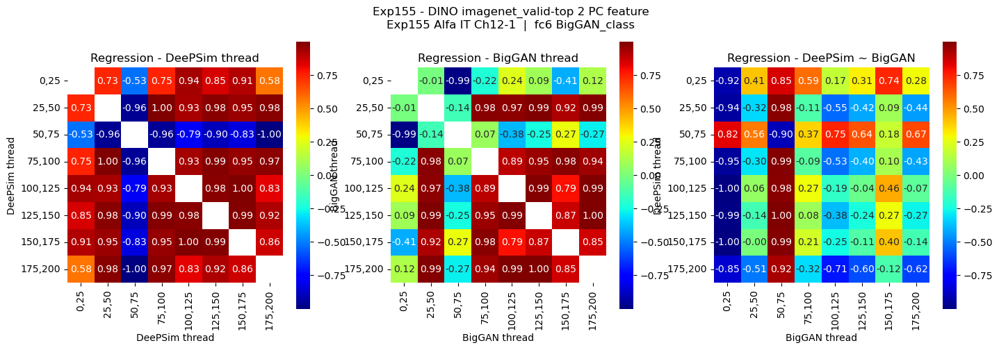

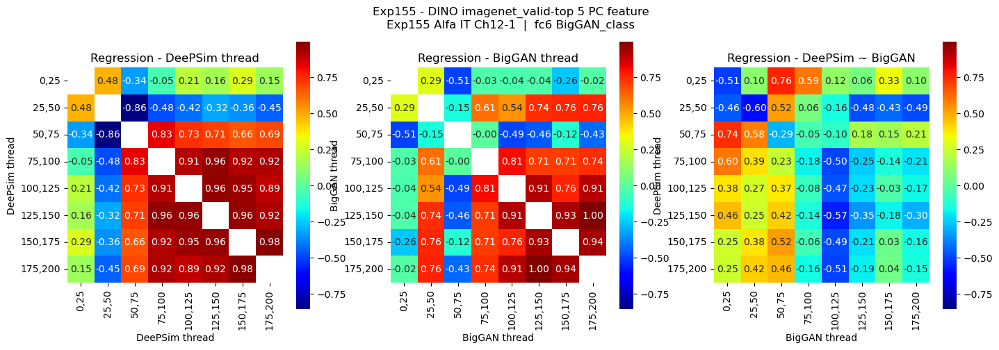

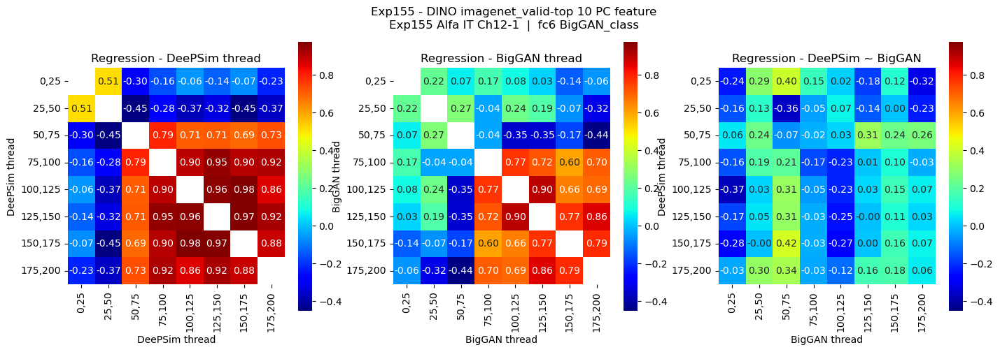

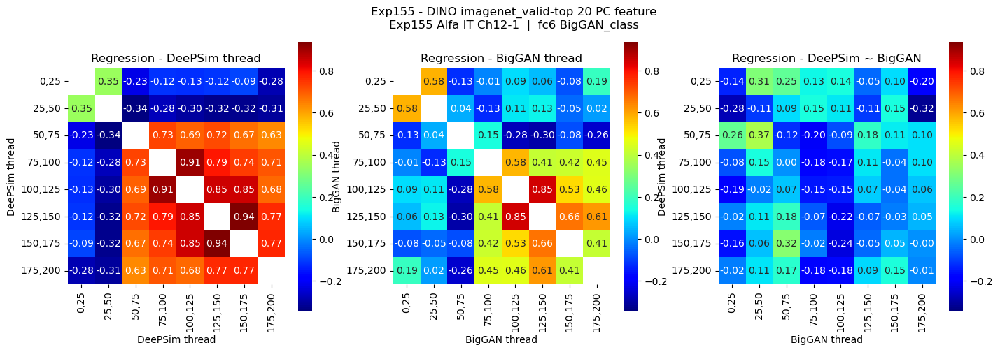

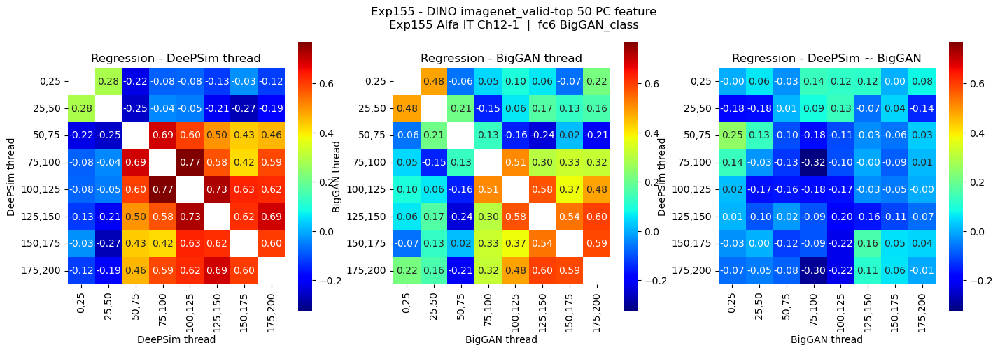

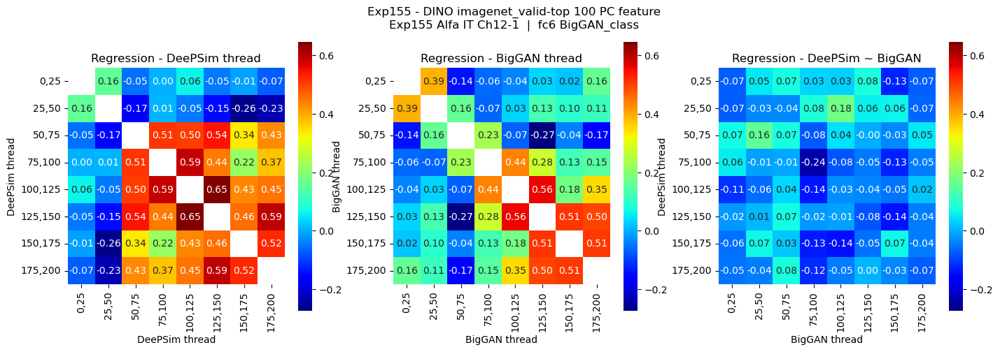

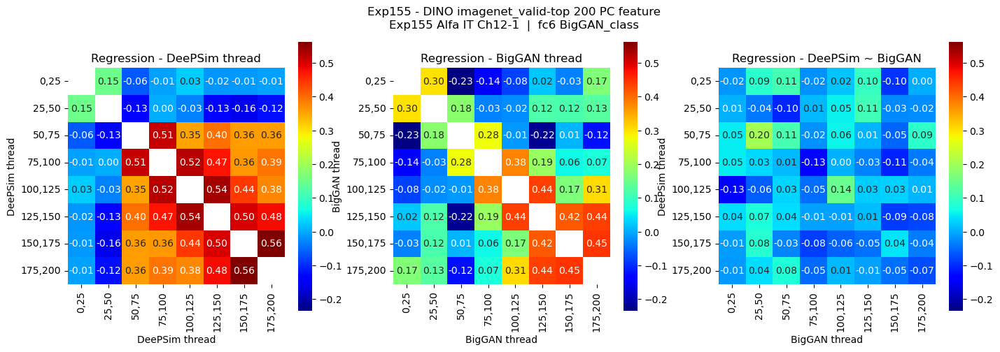

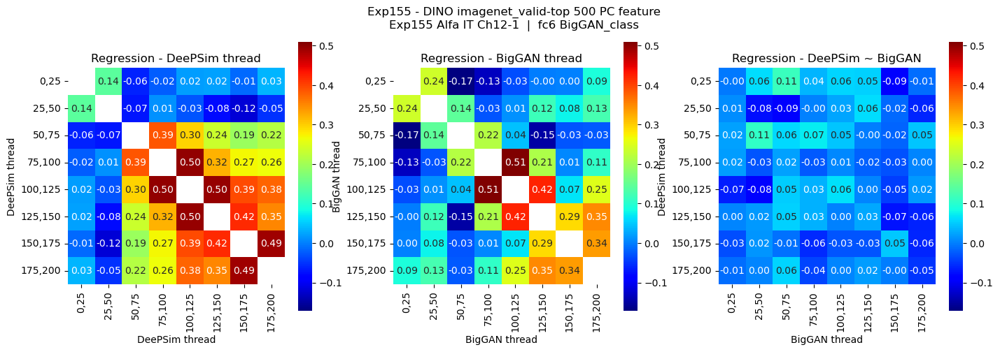

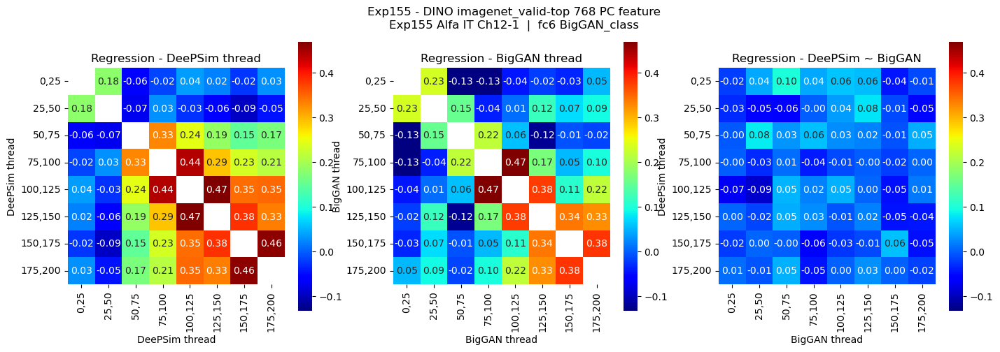

In [15]:
Expi = 155
savedir = r"/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/BigGAN_Project/EvolLinReg_axes"

model_stats_synopsis = pkl.load(open(join(savedir, f"Exp{Expi:03d}_imagenet_valid_PC_model_stats.pkl"), "rb"))
cross_eval_synopsis = pkl.load(open(join(savedir, f"Exp{Expi:03d}_imagenet_valid_PC_cross_eval_stats.pkl"), "rb"))

metaS = meta_df.loc[Expi]
expstr = f"Exp{Expi:03d} {metaS['Animal']} {metaS['visual_area']} Ch{metaS['prefchan']}-{metaS['prefunit']}"\
            f"  |  {metaS['space_names1']} {metaS['space_names2']}" 

for PCcutoff in model_stats_synopsis:
    model0 = model_stats_synopsis[PCcutoff]["thread 0"][0]
    model1 = model_stats_synopsis[PCcutoff]["thread 1"][0]
    cossim00 = cosine_similarity(model0.coef_, model0.coef_)
    cossim11 = cosine_similarity(model1.coef_, model1.coef_)
    cossim01 = cosine_similarity(model0.coef_, model1.coef_)
    # set diagonal to nan
    cossim00 = cossim00 + np.diag(np.ones(cossim00.shape[0])*np.nan)
    cossim11 = cossim11 + np.diag(np.ones(cossim11.shape[0])*np.nan) 
    for slc in [slice(-8, None)]: #slice(1, 5), 
        data = [cossim00[slc, slc], cossim11[slc, slc], cossim01[slc, slc]]
        xticklabels = [f"{wdw[0]},{wdw[-1]+1}" for wdw in rsp_wdw_fine[slc]]
        yticklabels = [f"{wdw[0]},{wdw[-1]+1}" for wdw in rsp_wdw_fine[slc]]
        label_xys = [("DeePSim thread", "DeePSim thread"), 
                    ("BigGAN thread", "BigGAN thread"),
                    ("BigGAN thread", "DeePSim thread")]
        title = ["Regression - DeePSim thread", "Regression - BigGAN thread", "Regression - DeePSim ~ BigGAN"]
        figh, axs = plot_heatmap(data, xticklabels, yticklabels, label_xys, title)
        figh.suptitle(f"Exp{Expi:03d} - {'DINO'} {dataset_str}-top {PCcutoff} PC feature\n{expstr}")
        figh.show()

/tmp/ipykernel_617568/1793250017.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  figh, axs = plt.subplots(1, 3, figsize=[17, 5], squeeze=False)


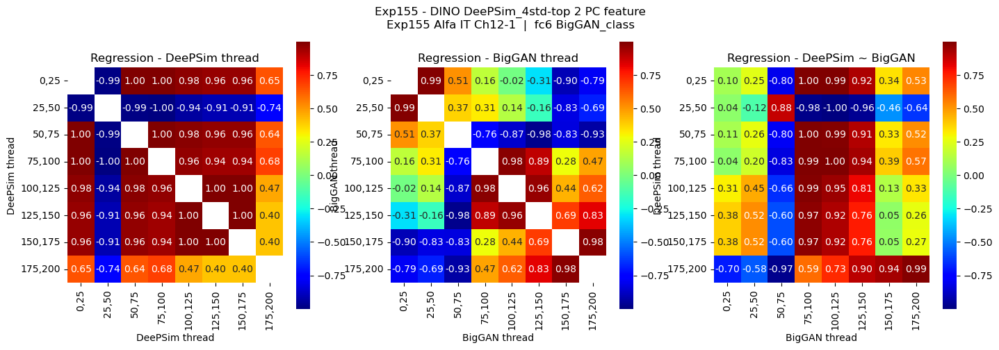

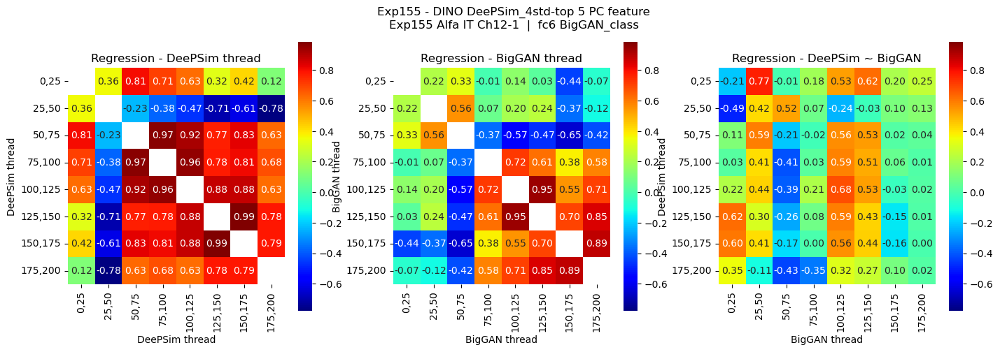

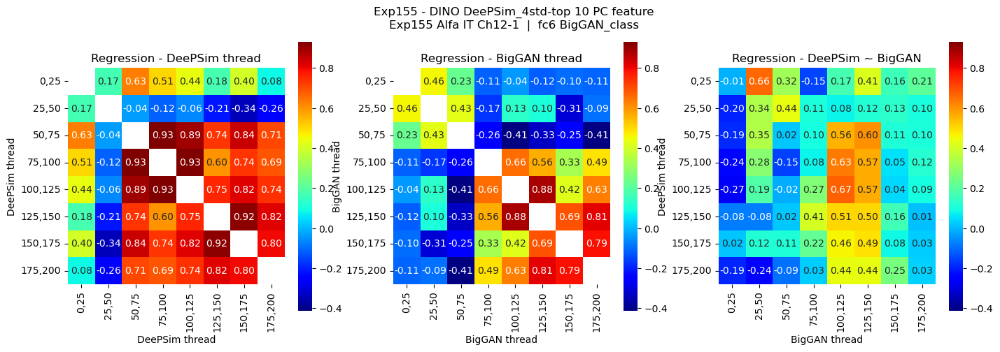

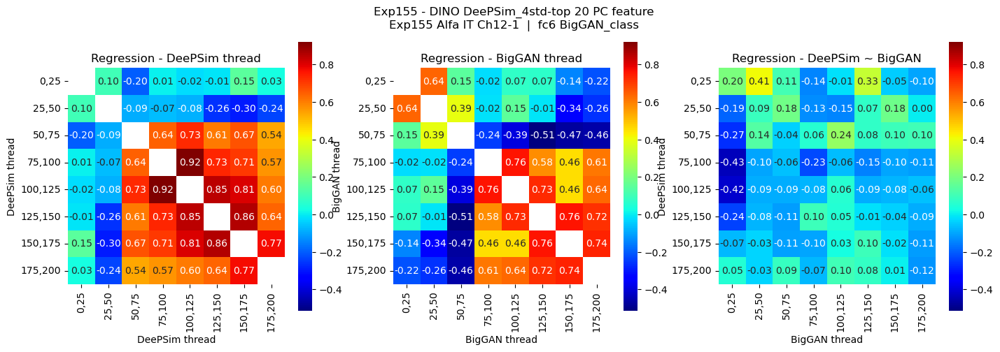

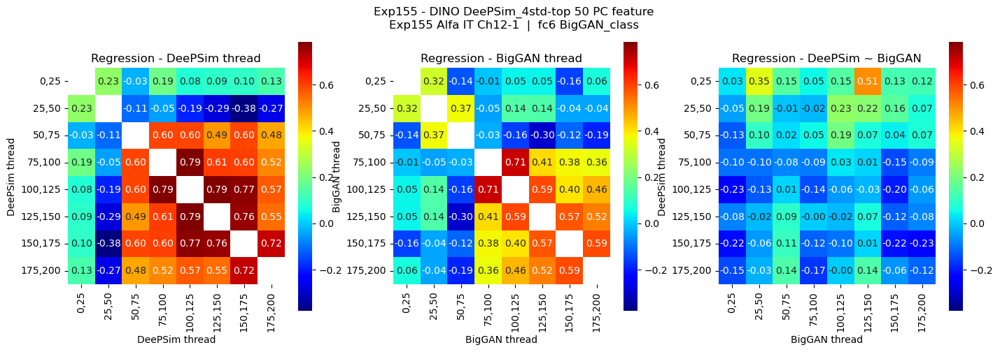

...

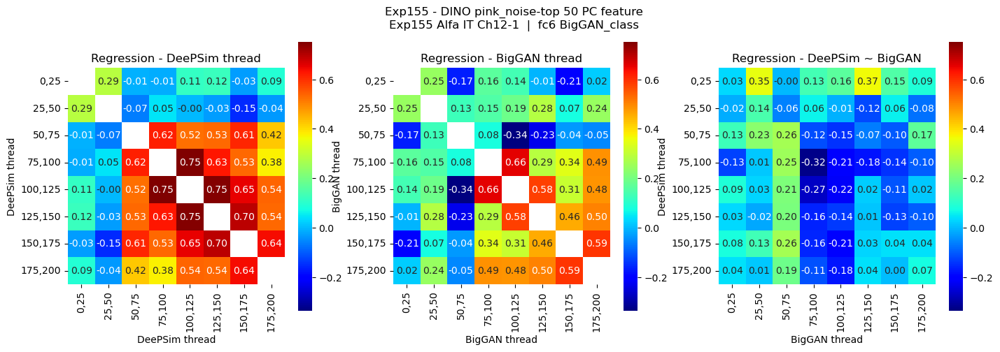

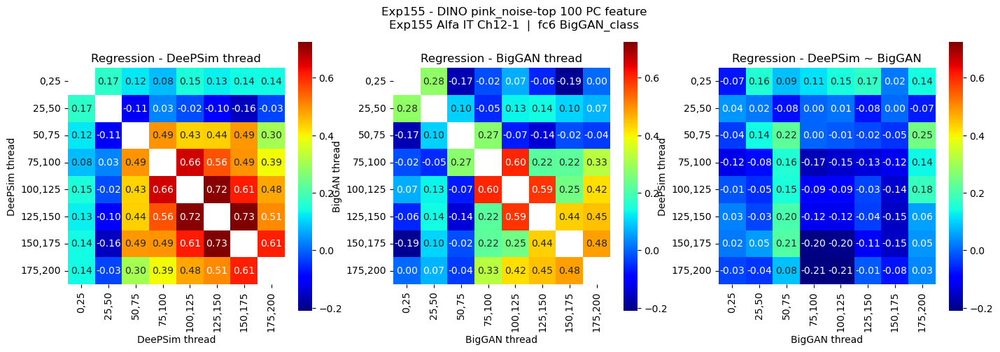

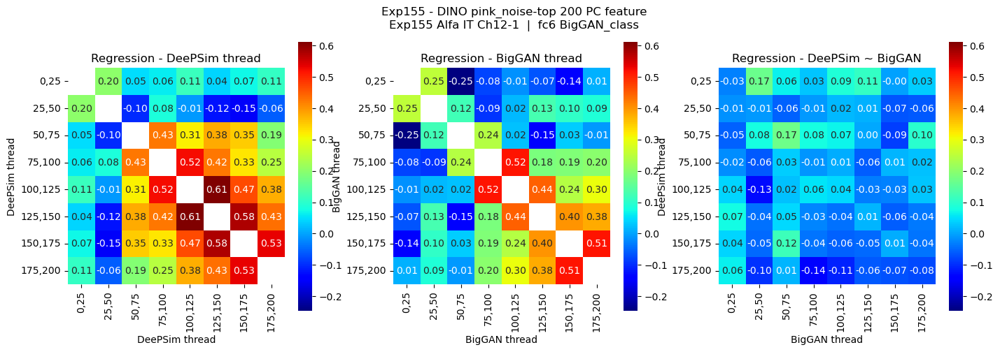

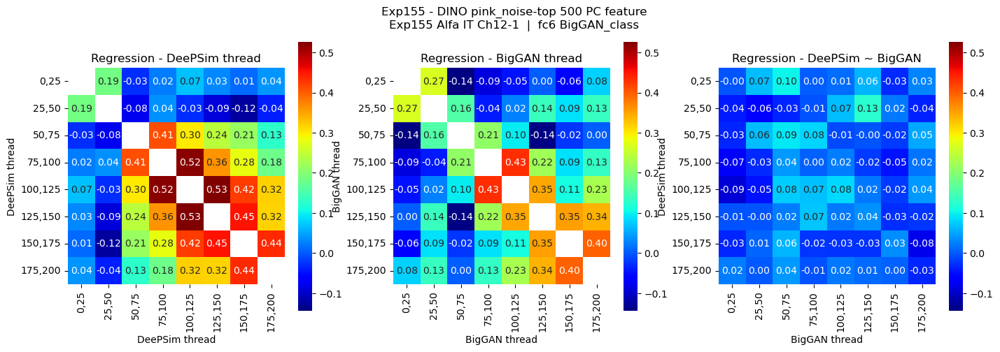

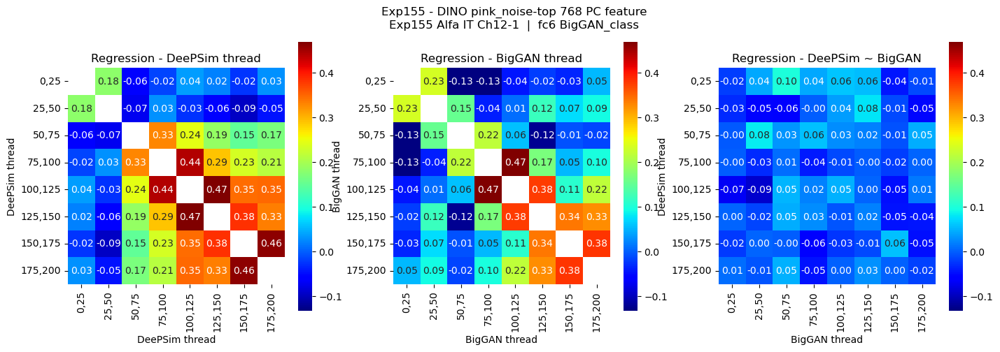

In [16]:
Expi = 155
savedir = r"/n/holylabs/LABS/kempner_fellows/Users/binxuwang/Projects/BigGAN_Project/EvolLinReg_axes"
metaS = meta_df.loc[Expi]
expstr = f"Exp{Expi:03d} {metaS['Animal']} {metaS['visual_area']} Ch{metaS['prefchan']}-{metaS['prefunit']}"\
            f"  |  {metaS['space_names1']} {metaS['space_names2']}" 
            
for dataset_str in ["DeePSim_4std", "BigGAN_trunc07", "imagenet_valid", "pink_noise"]:
    model_stats_synopsis = pkl.load(open(join(savedir, f"Exp{Expi:03d}_{dataset_str}_PC_model_stats.pkl"), "rb"))
    cross_eval_synopsis = pkl.load(open(join(savedir, f"Exp{Expi:03d}_{dataset_str}_PC_cross_eval_stats.pkl"), "rb"))
    for PCcutoff in model_stats_synopsis:
        model0 = model_stats_synopsis[PCcutoff]["thread 0"][0]
        model1 = model_stats_synopsis[PCcutoff]["thread 1"][0]
        cossim00 = cosine_similarity(model0.coef_, model0.coef_)
        cossim11 = cosine_similarity(model1.coef_, model1.coef_)
        cossim01 = cosine_similarity(model0.coef_, model1.coef_)
        # set diagonal to nan
        cossim00 = cossim00 + np.diag(np.ones(cossim00.shape[0])*np.nan)
        cossim11 = cossim11 + np.diag(np.ones(cossim11.shape[0])*np.nan) 
        for slc in [slice(-8, None)]: #slice(1, 5), 
            data = [cossim00[slc, slc], cossim11[slc, slc], cossim01[slc, slc]]
            xticklabels = [f"{wdw[0]},{wdw[-1]+1}" for wdw in rsp_wdw_fine[slc]]
            yticklabels = [f"{wdw[0]},{wdw[-1]+1}" for wdw in rsp_wdw_fine[slc]]
            label_xys = [("DeePSim thread", "DeePSim thread"), 
                        ("BigGAN thread", "BigGAN thread"),
                        ("BigGAN thread", "DeePSim thread")]
            title = ["Regression - DeePSim thread", "Regression - BigGAN thread", "Regression - DeePSim ~ BigGAN"]
            figh, axs = plot_heatmap(data, xticklabels, yticklabels, label_xys, title)
            figh.suptitle(f"Exp{Expi:03d} - {'DINO'} {dataset_str}-top {PCcutoff} PC feature\n{expstr}")
            figh.show()

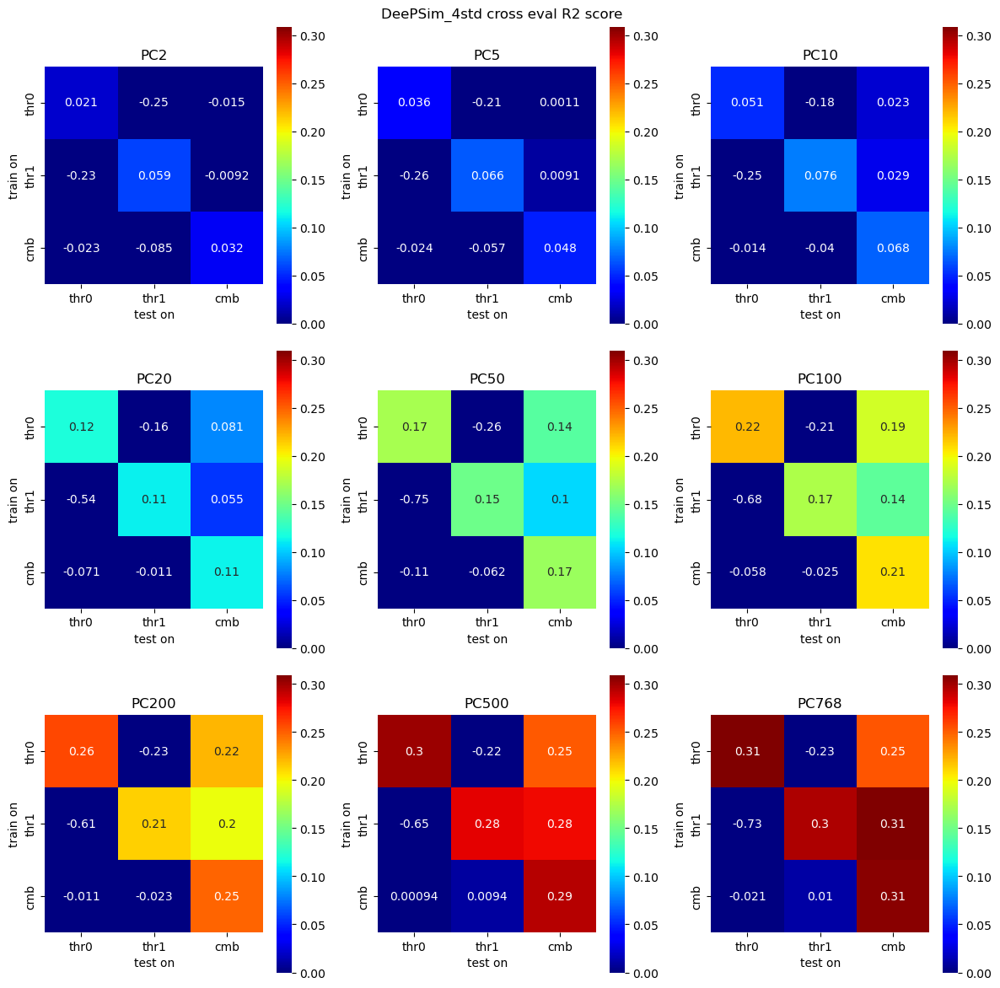

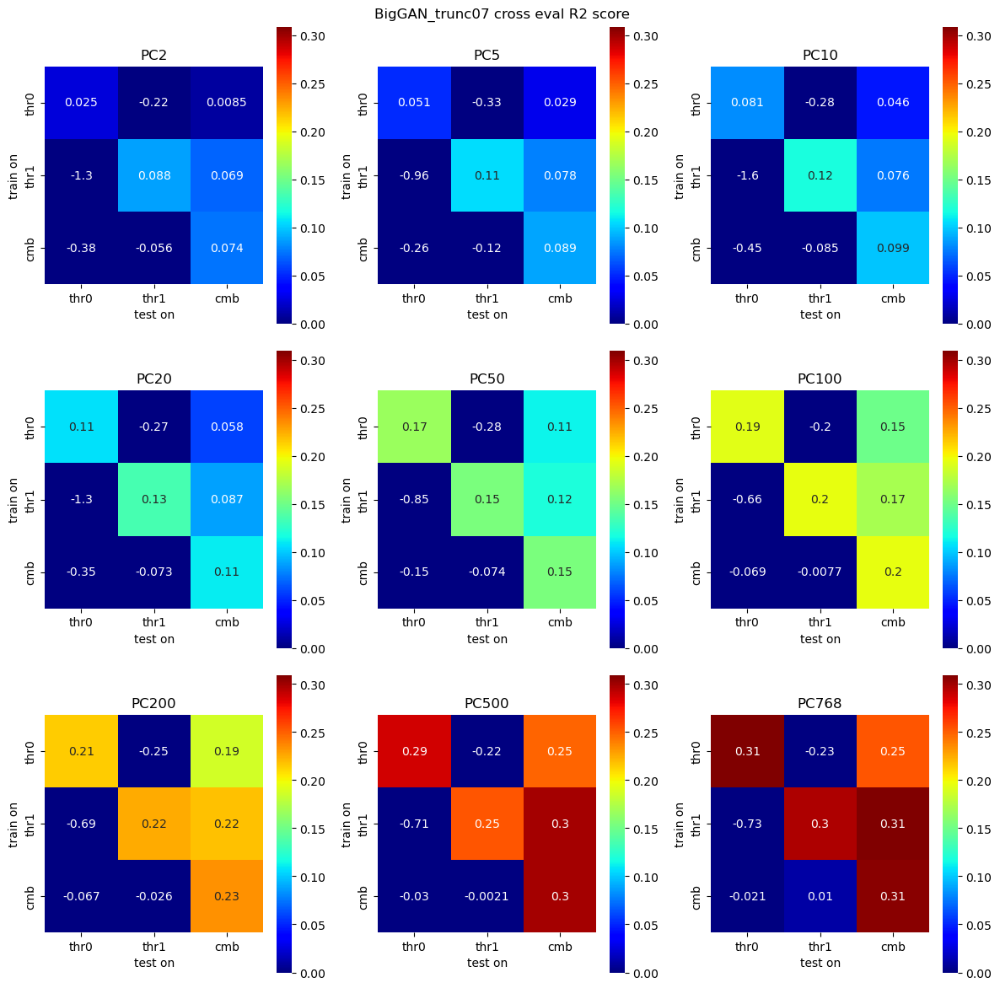

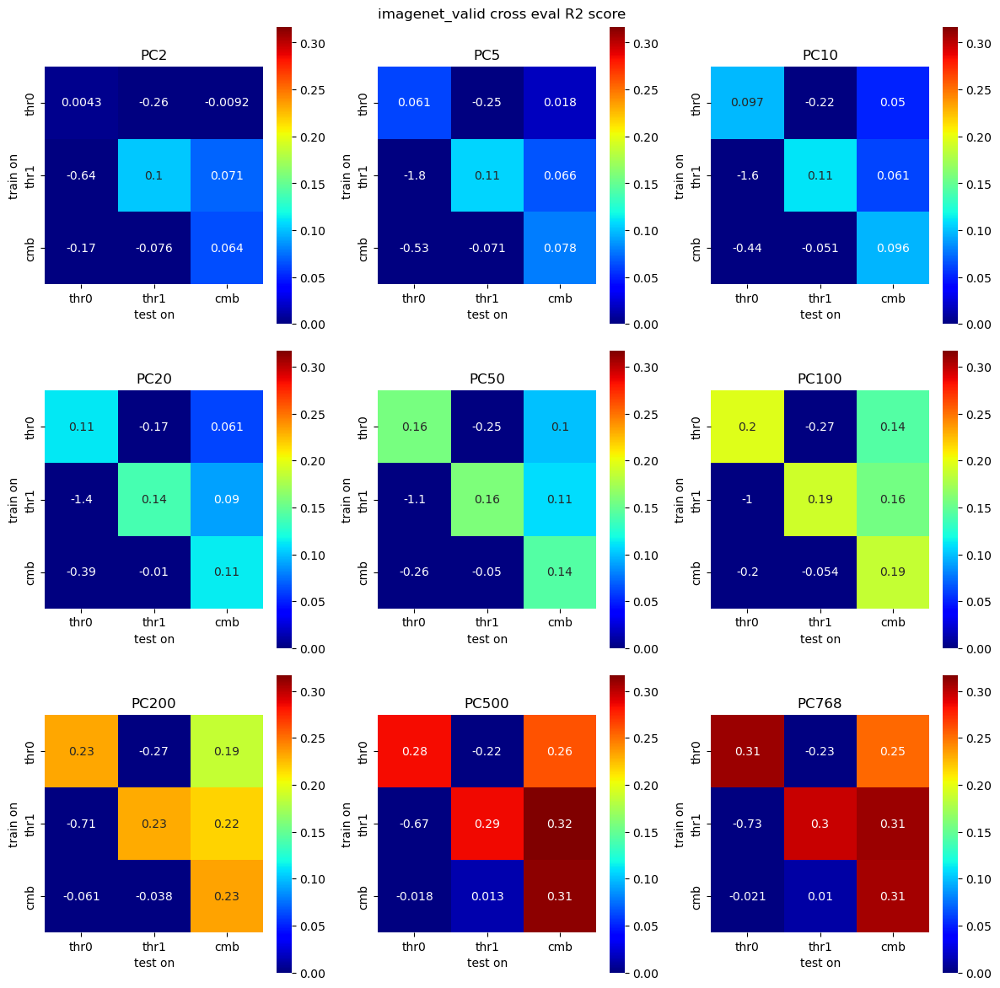

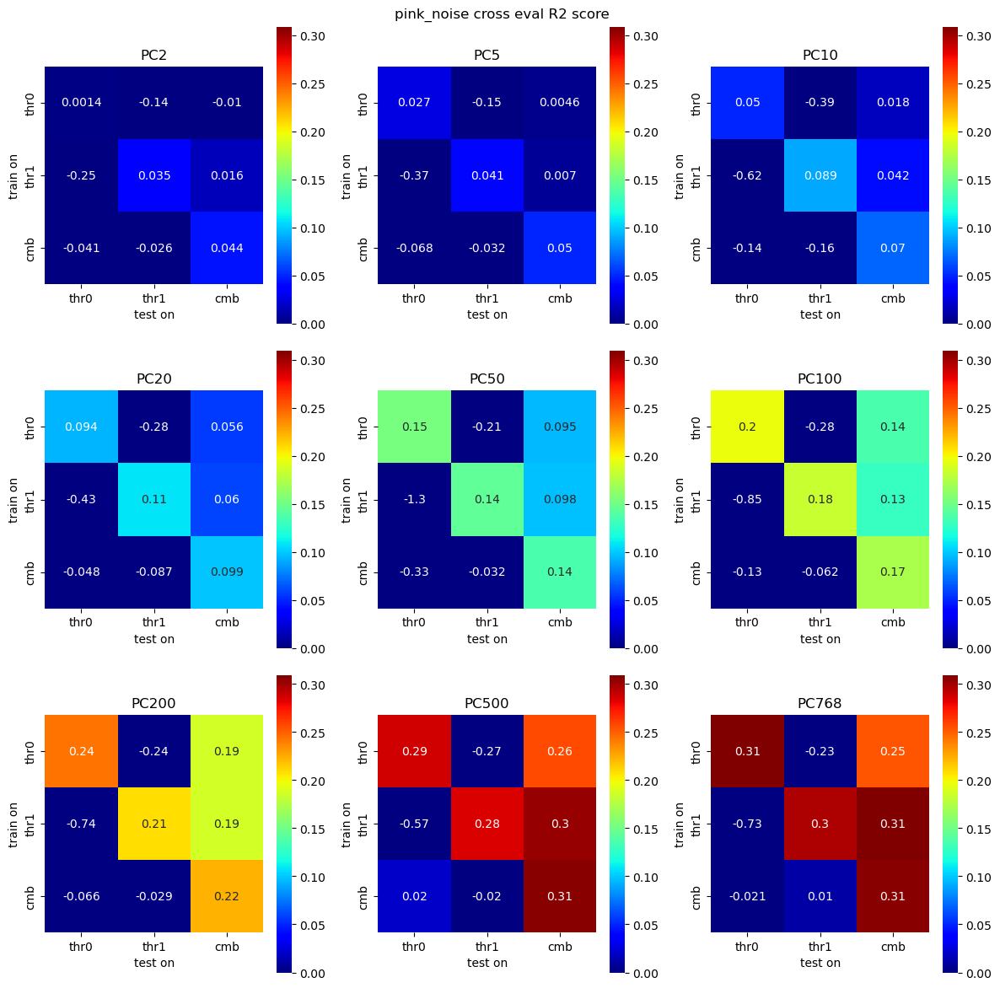

In [18]:

for dataset_str in ["DeePSim_4std", "BigGAN_trunc07", "imagenet_valid", "pink_noise"]:
    model_stats_synopsis = pkl.load(open(join(savedir, f"Exp{Expi:03d}_{dataset_str}_PC_model_stats.pkl"), "rb"))
    cross_eval_synopsis = pkl.load(open(join(savedir, f"Exp{Expi:03d}_{dataset_str}_PC_cross_eval_stats.pkl"), "rb"))

    cross_eval_mat_col = []
    for i, PCcutoff in enumerate(cross_eval_synopsis):
        cross_eval_mat = np.array([[cross_eval_synopsis[PCcutoff][(a,b)][1] 
                                for a in ["thread 0", "thread 1", "combined"]] 
                                for b in ["thread 0", "thread 1", "combined"]])
        cross_eval_mat_col.append(cross_eval_mat)

    plt.figure(figsize=[12, 12])
    vmax = np.max([np.nanmax(d) for d in cross_eval_mat_col])
    for i, PCcutoff in enumerate(cross_eval_synopsis):
        cross_eval_mat = cross_eval_mat_col[i]
        plt.subplot(3, 3, i+1)
        sns.heatmap(cross_eval_mat, annot=True, cmap="jet", vmin=0.0, vmax=vmax, square=True, 
                    xticklabels=["thr0", "thr1", "cmb"],
                    yticklabels=["thr0", "thr1", "cmb"])
        plt.title(f"PC{PCcutoff}")
        plt.ylabel("train on")
        plt.xlabel("test on")
    plt.suptitle(f"{dataset_str} cross eval R2 score")
    plt.tight_layout()
    plt.show()

### Masked all session synopsis

In [90]:
Amsk, Bmsk, V1msk, V4msk, ITmsk, \
    length_msk, spc_msk, sucsmsk, bsl_unstable_msk, \
    bsl_stable_msk, validmsk = get_all_masks(meta_df, return_type=tuple)
FCsucs_msk = meta_df.p_maxinit_0 < 0.05 
BGsucs_msk = meta_df.p_maxinit_1 < 0.05
bothsucs_msk = FCsucs_msk & BGsucs_msk
anysucs_msk = FCsucs_msk | BGsucs_msk

total number of experiments: 170
total number of valid experiments: 154
total number of valid experiments with suc: 133
Exluded:
  - short: 8
  - unstable baseline: 6
  - not fc6-BigGAN: 3


In [99]:
timewdw_strs = [f"{wdw[0]},{wdw[-1]+1}" for wdw in rsp_wdw_fine]

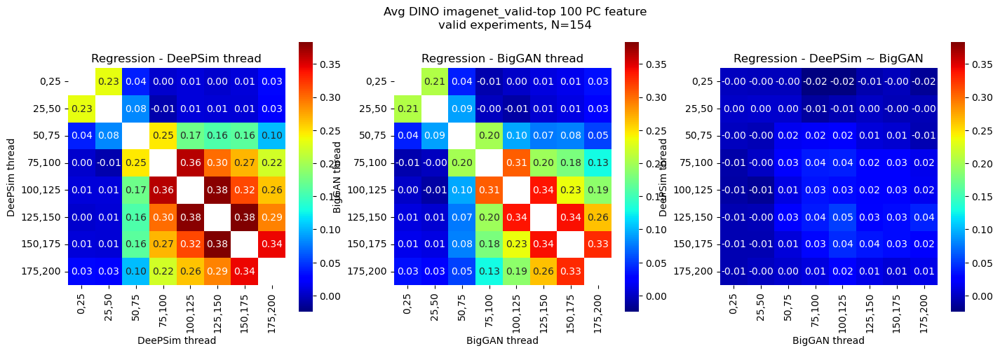

In [108]:
msk = validmsk
msk_str = f"valid experiments, N={msk.sum()}"
PCcutoff = 100
slc = slice(-8, None)
PCi = [2, 5, 10, 20, 50, 100, 200, 500, 768].index(PCcutoff)
data = [stats_col_tsr["cossim00"][msk, PCi].mean(axis=0)[slc,slc], 
        stats_col_tsr["cossim11"][msk, PCi].mean(axis=0)[slc,slc], 
        stats_col_tsr["cossim01"][msk, PCi].mean(axis=0)[slc,slc]]
label_xys = [("DeePSim thread", "DeePSim thread"), 
            ("BigGAN thread", "BigGAN thread"),
            ("BigGAN thread", "DeePSim thread")]
title = ["Regression - DeePSim thread", "Regression - BigGAN thread", "Regression - DeePSim ~ BigGAN"]
figh, axs = plot_heatmap(data, timewdw_strs[slc], timewdw_strs[slc], label_xys, title)
figh.suptitle(f"Encoding axis cosine similarity across thread and time\nAvg {'DINO'} {dataset_str}-top {PCcutoff} PC feature\n{msk_str}")
figh.show()

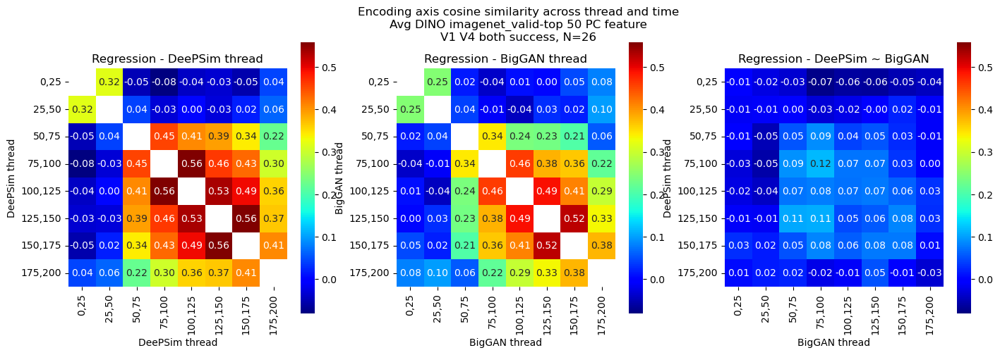

In [123]:
msk = (validmsk & bothsucs_msk & (V1msk | V4msk)).to_numpy()
msk_str = f"V1 V4 both success, N={msk.sum()}"
PCcutoff = 50
slc = slice(-8, None)
PCi = [2, 5, 10, 20, 50, 100, 200, 500, 768].index(PCcutoff)
data = [stats_col_tsr["cossim00"][msk, PCi].mean(axis=0)[slc,slc], 
        stats_col_tsr["cossim11"][msk, PCi].mean(axis=0)[slc,slc], 
        stats_col_tsr["cossim01"][msk, PCi].mean(axis=0)[slc,slc]]
label_xys = [("DeePSim thread", "DeePSim thread"), 
            ("BigGAN thread", "BigGAN thread"),
            ("BigGAN thread", "DeePSim thread")]
title = ["Regression - DeePSim thread", "Regression - BigGAN thread", "Regression - DeePSim ~ BigGAN"]
figh, axs = plot_heatmap(data, timewdw_strs[slc], timewdw_strs[slc], label_xys, title)
figh.suptitle(f"Encoding axis cosine similarity across thread and time\nAvg {'DINO'} {dataset_str}-top {PCcutoff} PC feature\n{msk_str}")
figh.show()

In [129]:
ttest_1samp(stats_col_tsr["cossim01"][msk, PCi][:, slc,slc], popmean=0.0, axis=0, )

TtestResult(statistic=array([[-0.274, -0.764, -1.072, -2.915, -2.513, -2.157, -1.488, -1.307],
       [-0.529, -0.471,  0.07 , -0.863, -0.561, -0.065,  0.696, -0.326],
       [-0.19 , -2.101,  1.916,  2.937,  1.395,  1.753,  1.117, -0.396],
       [-1.027, -1.85 ,  4.43 ,  3.799,  2.225,  2.381,  1.191,  0.032],
       [-0.783, -1.461,  3.156,  2.296,  2.019,  2.327,  1.657,  1.056],
       [-0.468, -0.502,  4.547,  2.801,  1.141,  1.597,  2.431,  0.851],
       [ 0.89 ,  0.685,  1.667,  2.864,  2.172,  2.318,  2.987,  0.242],
       [ 0.27 ,  0.578,  0.79 , -0.624, -0.429,  1.662, -0.239, -1.385]]), pvalue=array([[0.786, 0.452, 0.294, 0.007, 0.019, 0.041, 0.149, 0.203],
       [0.602, 0.642, 0.945, 0.396, 0.58 , 0.949, 0.493, 0.747],
       [0.851, 0.046, 0.067, 0.007, 0.175, 0.092, 0.275, 0.695],
       [0.314, 0.076, 0.   , 0.001, 0.035, 0.025, 0.245, 0.974],
       [0.441, 0.157, 0.004, 0.03 , 0.054, 0.028, 0.11 , 0.301],
       [0.644, 0.62 , 0.   , 0.01 , 0.265, 0.123, 0.023, 0.4

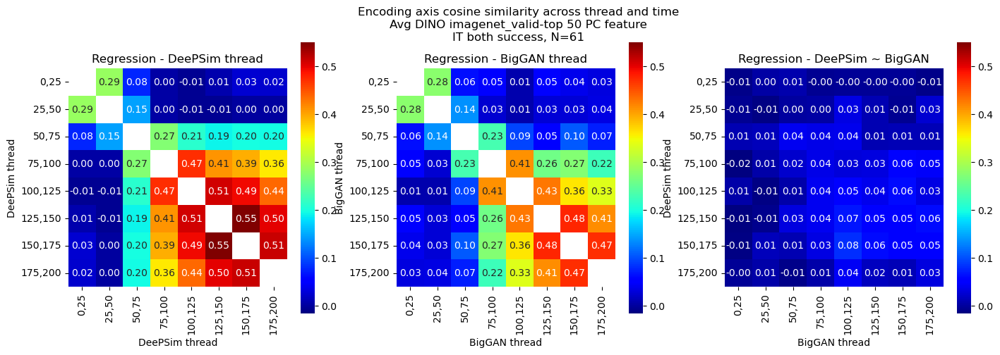

In [132]:
msk = (validmsk & bothsucs_msk & ITmsk).to_numpy()
msk_str = f"IT both success, N={msk.sum()}"
PCcutoff = 50
slc = slice(-8, None)
PCi = [2, 5, 10, 20, 50, 100, 200, 500, 768].index(PCcutoff)
data = [stats_col_tsr["cossim00"][msk, PCi].mean(axis=0)[slc,slc], 
        stats_col_tsr["cossim11"][msk, PCi].mean(axis=0)[slc,slc], 
        stats_col_tsr["cossim01"][msk, PCi].mean(axis=0)[slc,slc]]
label_xys = [("DeePSim thread", "DeePSim thread"), 
            ("BigGAN thread", "BigGAN thread"),
            ("BigGAN thread", "DeePSim thread")]
title = ["Regression - DeePSim thread", "Regression - BigGAN thread", "Regression - DeePSim ~ BigGAN"]
figh, axs = plot_heatmap(data, timewdw_strs[slc], timewdw_strs[slc], label_xys, title)
figh.suptitle(f"Encoding axis cosine similarity across thread and time\nAvg {'DINO'} {dataset_str}-top {PCcutoff} PC feature\n{msk_str}")
figh.show()

In [133]:
ttest_1samp(stats_col_tsr["cossim01"][msk, PCi][:, slc,slc], popmean=0.0, axis=0, )

TtestResult(statistic=array([[-0.544,  0.226,  0.393, -0.231, -0.161, -0.133, -0.153, -0.561],
       [-0.312, -0.672,  0.025,  0.22 ,  1.868,  0.613, -0.331,  1.391],
       [ 0.497,  0.763,  2.153,  2.068,  1.969,  0.491,  0.613,  0.605],
       [-0.755,  0.347,  1.158,  1.937,  1.75 ,  1.856,  3.022,  2.582],
       [ 0.314, -0.707,  0.316,  1.937,  2.765,  1.938,  3.507,  2.002],
       [-0.751, -0.443,  1.598,  2.048,  4.085,  3.219,  2.717,  3.967],
       [-0.65 ,  0.894,  0.503,  1.814,  4.589,  3.218,  2.841,  2.711],
       [-0.185,  0.345, -0.544,  0.316,  2.249,  0.932,  0.752,  2.261]]), pvalue=array([[0.588, 0.822, 0.695, 0.818, 0.872, 0.895, 0.879, 0.577],
       [0.756, 0.504, 0.98 , 0.827, 0.067, 0.543, 0.742, 0.169],
       [0.621, 0.449, 0.035, 0.043, 0.054, 0.625, 0.542, 0.548],
       [0.453, 0.729, 0.251, 0.057, 0.085, 0.068, 0.004, 0.012],
       [0.755, 0.483, 0.753, 0.057, 0.008, 0.057, 0.001, 0.05 ],
       [0.456, 0.66 , 0.115, 0.045, 0.   , 0.002, 0.009, 0. 

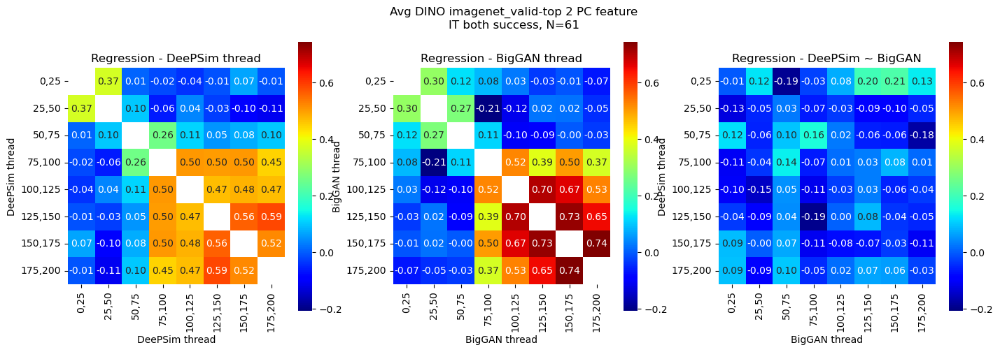

In [120]:
msk = (validmsk & bothsucs_msk & ITmsk).to_numpy()
msk_str = f"IT both success, N={msk.sum()}"
PCcutoff = 2
slc = slice(-8, None)
PCi = [2, 5, 10, 20, 50, 100, 200, 500, 768].index(PCcutoff)
data = [stats_col_tsr["cossim00"][msk, PCi].mean(axis=0)[slc,slc], 
        stats_col_tsr["cossim11"][msk, PCi].mean(axis=0)[slc,slc], 
        stats_col_tsr["cossim01"][msk, PCi].mean(axis=0)[slc,slc]]
label_xys = [("DeePSim thread", "DeePSim thread"), 
            ("BigGAN thread", "BigGAN thread"),
            ("BigGAN thread", "DeePSim thread")]
title = ["Regression - DeePSim thread", "Regression - BigGAN thread", "Regression - DeePSim ~ BigGAN"]
figh, axs = plot_heatmap(data, timewdw_strs[slc], timewdw_strs[slc], label_xys, title)
figh.suptitle(f"Avg {'DINO'} {dataset_str}-top {PCcutoff} PC feature\n{msk_str}")
figh.show()

In [111]:
stats_col_tsr["cross_eval_eachtime_tsr"].shape

(170, 9, 3, 3, 13)

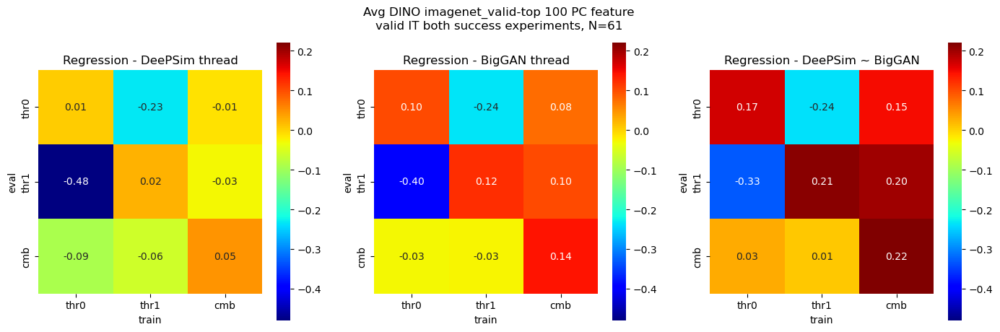

In [117]:
msk = validmsk & bothsucs_msk & ITmsk
msk_str = f"valid IT both success experiments, N={msk.sum()}"
PCcutoff = 100
slc = slice(-8, None)
PCi = [2, 5, 10, 20, 50, 100, 200, 500, 768].index(PCcutoff)
data = [stats_col_tsr["cross_eval_mat"][msk, 0].mean(axis=0),
        stats_col_tsr["cross_eval_mat"][msk, PCi].mean(axis=0),
        stats_col_tsr["cross_eval_mat"][msk, -1].mean(axis=0),]
tick_labels = ["thr0", "thr1", "cmb"]
label_xys = [("train", "eval",), 
            ( "train", "eval",), 
            ("train",  "eval",) ] # double check which is which
title = ["Regression - DeePSim thread", "Regression - BigGAN thread", "Regression - DeePSim ~ BigGAN"]
figh, axs = plot_heatmap(data, tick_labels, tick_labels, label_xys, title)
figh.suptitle(f"Avg {'DINO'} {dataset_str}-top {PCcutoff} PC feature\n{msk_str}")
figh.show()

## Example single session analysis

In [ ]:
PCcutoff = 100
Expi = 159
Evol_emb_data = pkl.load(open(join(Evol_embed_dir, f"Exp{Expi:03d}_embed_act_data.pkl"), "rb"))
imgfps0, resp_mat0, gen_vec0 = load_img_resp_pairs_multiwindow(BFEStats, Expi,
                         "Evol", thread=0, stimdrive=stim_rootdir,
                        output_fmt="vec", rsp_wdws=rsp_wdw_fine)
imgfps1, resp_mat1, gen_vec1 = load_img_resp_pairs_multiwindow(BFEStats, Expi,
                         "Evol", thread=1, stimdrive=stim_rootdir,
                         output_fmt="vec", rsp_wdws=rsp_wdw_fine)
gen_vec_cmb = np.concatenate([gen_vec0, gen_vec1], axis=0)
resp_mat_cmb = np.concatenate([resp_mat0, resp_mat1], axis=0)
embeddings0 = Evol_emb_data[f"embeddings0"]
embeddings1 = Evol_emb_data[f"embeddings1"]
embeddings_cmb = torch.cat([embeddings0, embeddings1], dim=0)

In [28]:
model0 = RidgeCV(alphas=np.logspace(-4, 4, 15), fit_intercept=True, alpha_per_target=True)
model0.fit(PCproj0[:, :PCcutoff], resp_mat0)

RidgeCV(alpha_per_target=True,
        alphas=array([1.00000000e-04, 3.72759372e-04, 1.38949549e-03, 5.17947468e-03,
       1.93069773e-02, 7.19685673e-02, 2.68269580e-01, 1.00000000e+00,
       3.72759372e+00, 1.38949549e+01, 5.17947468e+01, 1.93069773e+02,
       7.19685673e+02, 2.68269580e+03, 1.00000000e+04]))

In [31]:
model0.intercept_

array([143.21861451,  35.94136069, 105.64258137, 172.70883008,
       157.03248474,  39.67624462,  32.20647676,  78.96373101,
       132.4213354 , 190.88885961, 176.38959905, 169.97463271,
       144.09033677])

In [ ]:
model0 = RidgeCV(alphas=np.logspace(-4, 4, 15), 
                    fit_intercept=True, alpha_per_target=True)
model0.fit(PCproj0[:, :PCcutoff], resp_mat0)
predresp0 = model0.predict(PCproj0[:, :PCcutoff])
R2_eachtime = r2_score(resp_mat0, predresp0, multioutput='raw_values')
R2_varwt = r2_score(resp_mat0, predresp0, multioutput='variance_weighted')
R2_avg = r2_score(resp_mat0, predresp0, multioutput='uniform_average')
print (f"R2_eachtime: {R2_eachtime}")
print (f"R2_varwt: {R2_varwt}")
print (f"R2_avg: {R2_avg}") # this is the default score used by RidgeCV
        

In [38]:
model0.score(PCproj0[:, :PCcutoff], resp_mat0)

0.12258018998620843

In [39]:
R2_eachtime = r2_score(resp_mat0, predresp0, multioutput='raw_values')
R2_varwt = r2_score(resp_mat0, predresp0, multioutput='variance_weighted')
R2_avg = r2_score(resp_mat0, predresp0, multioutput='uniform_average')
print (f"R2_eachtime: {R2_eachtime}")
print (f"R2_varwt: {R2_varwt}")
print (f"R2_avg: {R2_avg}") # this is the default score used by RidgeCV

R2_eachtime: [0.29412321 0.01587041 0.28016459 0.22709093 0.02184518 0.01171998
 0.01806489 0.06533215 0.30896072 0.22742786 0.08368191 0.02356984
 0.0156908 ]
R2_varwt: 0.15686116302805425
R2_avg: 0.12258018998620843


In [136]:
PCcutoff = 100
Expi = 159
Evol_emb_data = pkl.load(open(join(Evol_embed_dir, f"Exp{Expi:03d}_embed_act_data.pkl"), "rb"))
imgfps0, resp_mat0, gen_vec0 = load_img_resp_pairs_multiwindow(BFEStats, Expi,
                         "Evol", thread=0, stimdrive=stim_rootdir,
                        output_fmt="vec", rsp_wdws=rsp_wdw_fine)
imgfps1, resp_mat1, gen_vec1 = load_img_resp_pairs_multiwindow(BFEStats, Expi,
                         "Evol", thread=1, stimdrive=stim_rootdir,
                         output_fmt="vec", rsp_wdws=rsp_wdw_fine)
gen_vec_cmb = np.concatenate([gen_vec0, gen_vec1], axis=0)
resp_mat_cmb = np.concatenate([resp_mat0, resp_mat1], axis=0)
embeddings0 = Evol_emb_data[f"embeddings0"]
embeddings1 = Evol_emb_data[f"embeddings1"]
embeddings_cmb = torch.cat([embeddings0, embeddings1], dim=0)
for dataset_str in ["imagenet_valid",]:#"DeePSim_4std", "imagenet_valid", ]: #"DeePSim_4std", "BigGAN_trunc07","BigGAN_std_008", #MH_eig_col:
    data_mean, data_eigvals, data_eigvecs = MH_eig_col[dataset_str]
    # project the embeddings onto the eigenvectors
    PCproj0 = ((embeddings0.cuda() - data_mean[None,:]) @ data_eigvecs).cpu()
    PCproj1 = ((embeddings1.cuda() - data_mean[None,:]) @ data_eigvecs).cpu()
    PCproj_cmb = ((embeddings_cmb.cuda() - data_mean[None,:]) @ data_eigvecs).cpu()
    
    model0 = RidgeCV(alphas=np.logspace(-3, 3, 10), fit_intercept=True, )
    model0.fit(PCproj0[:, :PCcutoff], resp_mat0[:, :])
    
    model1 = RidgeCV(alphas=np.logspace(-3, 3, 10), fit_intercept=True, )
    model1.fit(PCproj1[:, :PCcutoff], resp_mat1[:, :])
    
    model_cmb = RidgeCV(alphas=np.logspace(-3, 3, 10), fit_intercept=True, )
    model_cmb.fit(PCproj_cmb[:, :PCcutoff], resp_mat_cmb[:, :])
    
    for (model, X, y, label) in [
        (model0, PCproj0[:, :PCcutoff], resp_mat0, "thread 0"),
        (model1, PCproj1[:, :PCcutoff], resp_mat1, "thread 1"),
        (model_cmb, PCproj_cmb[:, :PCcutoff], resp_mat_cmb, "combined"),
    ]:
        for (_, X_, y_, label_) in [
        (model0, PCproj0[:, :PCcutoff], resp_mat0, "thread 0"),
        (model1, PCproj1[:, :PCcutoff], resp_mat1, "thread 1"),
        (model_cmb, PCproj_cmb[:, :PCcutoff], resp_mat_cmb, "combined"),
        ]:
            fitscore = model.score(X_, y_)
            print(f"model fit on {label} eval score on {label_}: {fitscore:.3f}")

model fit on thread 0 eval score on thread 0: 0.067
model fit on thread 0 eval score on thread 1: -0.158
model fit on thread 0 eval score on combined: -0.021
model fit on thread 1 eval score on thread 0: -0.213
model fit on thread 1 eval score on thread 1: 0.107
model fit on thread 1 eval score on combined: -0.081
model fit on combined eval score on thread 0: 0.041
model fit on combined eval score on thread 1: 0.075
model fit on combined eval score on combined: 0.059


### Encoding axis similarity 

In [ ]:
from tqdm import tqdm, trange
from sklearn.metrics.pairwise import cosine_similarity
import seaborn as sns

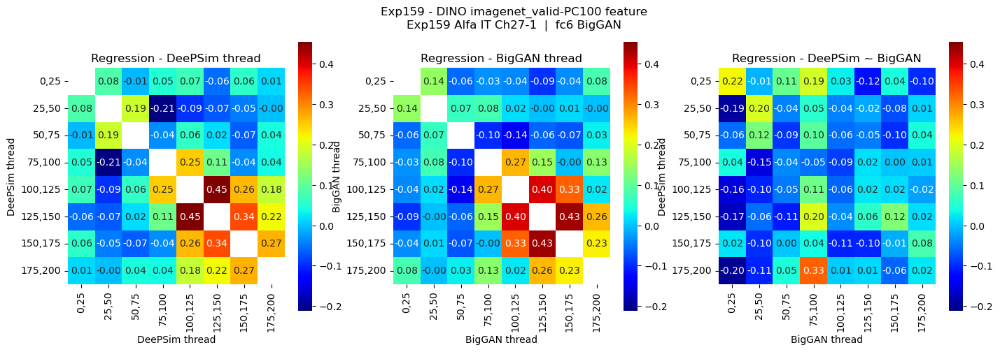

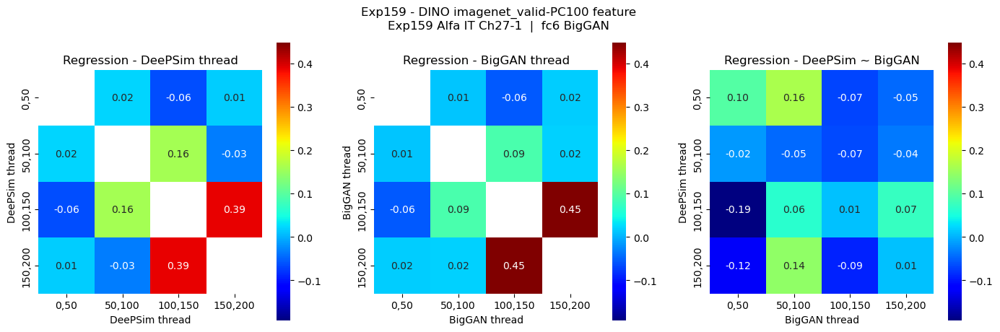

In [137]:

metaS = meta_df.loc[Expi]
expstr = f"Exp{Expi:03d} {metaS['Animal']} {metaS['visual_area']} Ch{metaS['prefchan']}-{metaS['prefunit']}"\
            f"  |  {metaS['space_names1']} {metaS['space_names2']}" 
mata_stat = meta_df.loc[Expi]
for slc in [slice(-8, None), slice(0, 4)]:
    n_time = len(rsp_wdw_fine[slc])
    data = [
        cosine_similarity(model0.coef_[slc, :], model0.coef_[slc, :]) + np.diag(np.ones(n_time)*np.nan),
        cosine_similarity(model1.coef_[slc, :], model1.coef_[slc, :]) + np.diag(np.ones(n_time)*np.nan),
        cosine_similarity(model0.coef_[slc, :], model1.coef_[slc, :])
    ]
    xticklabels = [f"{wdw[0]},{wdw[-1]+1}" for wdw in rsp_wdw_fine[slc]]
    yticklabels = [f"{wdw[0]},{wdw[-1]+1}" for wdw in rsp_wdw_fine[slc]]
    label_xys = [("DeePSim thread", "DeePSim thread"), 
                 ("BigGAN thread", "BigGAN thread"),
                 ("BigGAN thread", "DeePSim thread")]
    title = ["Regression - DeePSim thread", "Regression - BigGAN thread", "Regression - DeePSim ~ BigGAN"]
    figh, axs = plot_heatmap(data, xticklabels, yticklabels, label_xys, title)
    figh.suptitle(f"Exp{Expi:03d} - {'DINO'} {dataset_str}-PC{PCcutoff} feature\n{expstr}")
    figh.show()


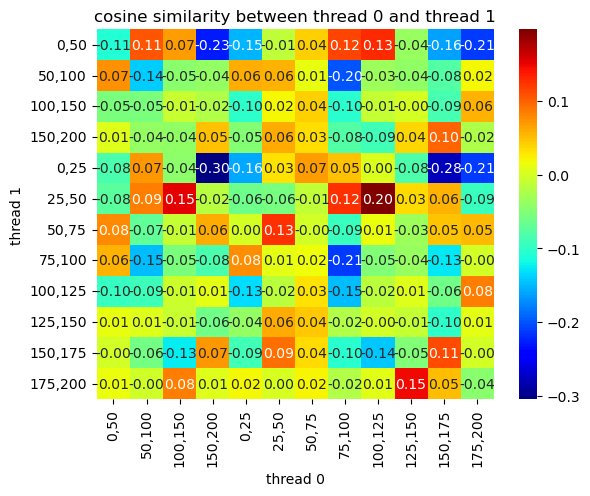

In [68]:
# cosine similarity
sns.heatmap(cosine_similarity(model0.coef_, model1.coef_), 
            annot=True, cmap="jet", fmt=".2f",
            xticklabels=[f"{wdw[0]},{wdw[-1]+1}" for wdw in rsp_wdw_fine], 
            yticklabels=[f"{wdw[0]},{wdw[-1]+1}" for wdw in rsp_wdw_fine]
            )
plt.ylabel("thread 1")
plt.xlabel("thread 0")
plt.title("cosine similarity between thread 0 and thread 1")
plt.show()

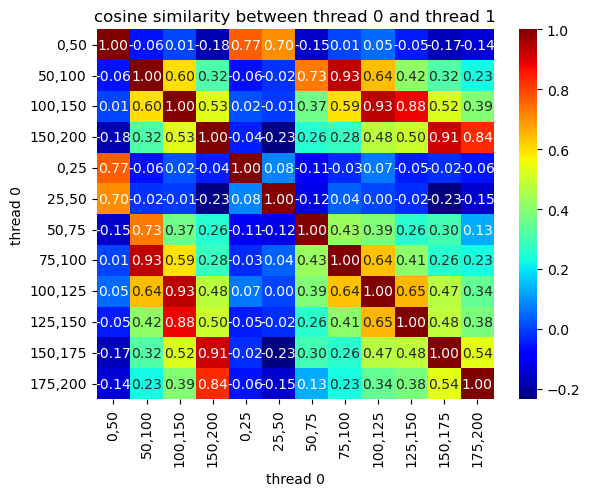

In [69]:
# cosine similarity
sns.heatmap(cosine_similarity(model0.coef_, model0.coef_), 
            annot=True, cmap="jet", fmt=".2f",
            xticklabels=[f"{wdw[0]},{wdw[-1]+1}" for wdw in rsp_wdw_fine], 
            yticklabels=[f"{wdw[0]},{wdw[-1]+1}" for wdw in rsp_wdw_fine]
            )
plt.ylabel("thread 0")
plt.xlabel("thread 0")
plt.title("cosine similarity between thread 0 and thread 1")
plt.show()

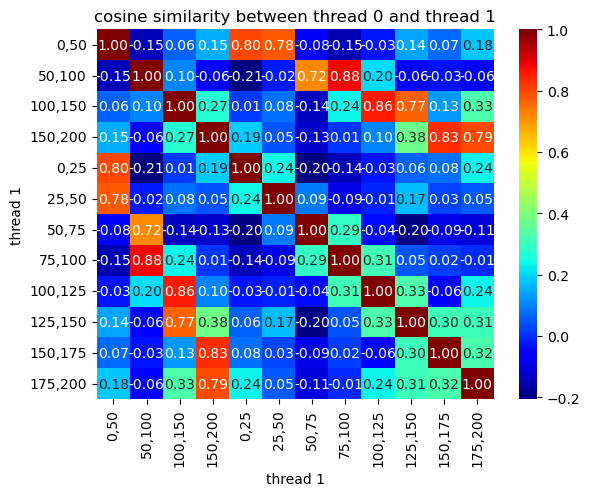

In [70]:
# cosine similarity
sns.heatmap(cosine_similarity(model1.coef_, model1.coef_), 
            annot=True, cmap="jet", fmt=".2f",
            xticklabels=[f"{wdw[0]},{wdw[-1]+1}" for wdw in rsp_wdw_fine], 
            yticklabels=[f"{wdw[0]},{wdw[-1]+1}" for wdw in rsp_wdw_fine]
            )
plt.ylabel("thread 1")
plt.xlabel("thread 1")
plt.title("cosine similarity between thread 0 and thread 1")
plt.show()

In [ ]:
# compute mahalanobis distance for all Exps
stats_df_col = []
for Expi in tqdm(range(1, 190+1)):
    # if ~ os.path.exists(join(Evol_embed_dir, f"Exp{Expi}_embed_act_data.pkl")):
    #     continue
    if Expi not in meta_df.index:
        continue
    meta_dict = meta_df.loc[Expi][['Animal', 'expdate', 'ephysFN', 'prefchan', 'prefunit', 'visual_area',
       'space1', 'space2', 'optim_names1', 'optim_names2', 'blockN']].to_dict()
    Evol_emb_data = pkl.load(open(join(Evol_embed_dir, f"Exp{Expi:03d}_embed_act_data.pkl"), "rb"))
    for thread in [0, 1]:
        stats_col = {}
        embeddings = Evol_emb_data[f"embeddings{thread}"]
        gen_vec = Evol_emb_data[f"gen_vec{thread}"]
        resp_mat = Evol_emb_data[f"resp_mat{thread}"]
        stats_col["Expi"] = Expi
        stats_col["thread"] = thread
        stats_col["generation"] = gen_vec
        stats_col["resp_mean"] = resp_mat[:, 0]
        for dataset_str in MH_eig_col:
            data_mean, data_eigvals, data_eigvecs = MH_eig_col[dataset_str]
            MHdist_thread = mahalanobis_sqdist(embeddings.cuda(), data_mean, data_eigvecs, data_eigvals, eigfloor=1e-3).cpu()
            NLL_thread = gaussian_nll_with_eig(embeddings.cuda(), data_mean, data_eigvals, data_eigvecs, eigfloor=1e-3).cpu()
            stats_col[f"MHdist_{dataset_str}"] = MHdist_thread
            stats_col[f"NLL_{dataset_str}"] = NLL_thread
        stats_col.update(meta_dict)
        stats_df = pd.DataFrame(stats_col)
        stats_df_col.append(stats_df)
    # raise RuntimeError("Stop here")
stats_df_all = pd.concat(stats_df_col, ignore_index=True)